## Customer Personality Analysis 

Customer Personality Analysis is a detailed analysis of a company’s ideal customers. It helps a business to better understand its customers and makes it easier for them to modify products according to the specific needs, behaviors and concerns of different types of customers.
Customer personality analysis helps a business to modify its product based on its target customers from different types of customer segments. For example, instead of spending money to market a new product to every customer in the company’s database, a company can analyze which customer segment is most likely to buy the product and then market the product only on that particular segment.
Attributes

People
ID: Customer's unique identifier

Year_Birth: Customer's birth year

Education: Customer's education level

Marital_Status: Customer's marital status

Income: Customer's yearly household income

Kidhome: Number of children in customer's household

Teenhome: Number of teenagers in customer's household

Dt_Customer: Date of customer's enrollment with the company

Recency: Number of days since customer's last purchase

Complain: 1 if the customer complained in the last 2 years, 0 otherwise
Products

MntWines: Amount spent on wine in last 2 years

MntFruits: Amount spent on fruits in last 2 years

MntMeatProducts: Amount spent on meat in last 2 years

MntFishProducts: Amount spent on fish in last 2 years

MntSweetProducts: Amount spent on sweets in last 2 years

MntGoldProds: Amount spent on gold in last 2 years
Promotion

NumDealsPurchases: Number of purchases made with a discount

AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise

AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise

AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise

AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise

AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise

Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
Place

NumWebPurchases: Number of purchases made through the company’s website

NumCatalogPurchases: Number of purchases made using a catalogue

NumStorePurchases: Number of purchases made directly in stores

NumWebVisitsMonth: Number of visits to company’s website in the last month

## Target
Need to perform clustering to summarize customer segments.

## Data Exploratory Analysis

In [ ]:
#installing libraries
!pip install kmodes
!pip install kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sn
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime,timedelta
from sklearn.preprocessing import MinMaxScaler,StandardScaler,OneHotEncoder
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score,silhouette_samples
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.cm as cm
import scipy.cluster.hierarchy as sch
from itertools import product
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


In [ ]:
from google.colab import files 
uploaded = files.upload()

Saving marketing_campaign3.xlsx to marketing_campaign3.xlsx


In [ ]:
df_cust = pd.read_excel("marketing_campaign3.xlsx")

In [ ]:
df_cust.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [ ]:
df_cust.dtypes

ID                              int64
Year_Birth                      int64
Education                      object
Marital_Status                 object
Income                        float64
Kidhome                         int64
Teenhome                        int64
Dt_Customer            datetime64[ns]
Recency                         int64
MntWines                        int64
MntFruits                       int64
MntMeatProducts                 int64
MntFishProducts                 int64
MntSweetProducts                int64
MntGoldProds                    int64
NumDealsPurchases               int64
NumWebPurchases                 int64
NumCatalogPurchases             int64
NumStorePurchases               int64
NumWebVisitsMonth               int64
AcceptedCmp3                    int64
AcceptedCmp4                    int64
AcceptedCmp5                    int64
AcceptedCmp1                    int64
AcceptedCmp2                    int64
Complain                        int64
Z_CostContac

In [ ]:
#checking shape of data 
df_cust.shape

(2240, 29)

In [ ]:
#checking with descriptive statistics 
df_cust.describe().T.style.background_gradient(cmap='Greens')

,count,mean,std,min,25%,50%,75%,max
ID,2240.000000,5592.159821,3246.662198,0.000000,2828.250000,5458.500000,8427.750000,11191.000000
Year_Birth,2240.000000,1968.805804,11.984069,1893.000000,1959.000000,1970.000000,1977.000000,1996.000000
Income,2216.000000,52247.251354,25173.076661,1730.000000,35303.000000,51381.500000,68522.000000,666666.000000
Kidhome,2240.000000,0.444196,0.538398,0.000000,0.000000,0.000000,1.000000,2.000000
Teenhome,2240.000000,0.506250,0.544538,0.000000,0.000000,0.000000,1.000000,2.000000
Recency,2240.000000,49.109375,28.962453,0.000000,24.000000,49.000000,74.000000,99.000000
MntWines,2240.000000,303.935714,336.597393,0.000000,23.750000,173.500000,504.250000,1493.000000
MntFruits,2240.000000,26.302232,39.773434,0.000000,1.000000,8.000000,33.000000,199.000000
MntMeatProducts,2240.000000,166.950000,225.715373,0.000000,16.000000,67.000000,232.000000,1725.000000
MntFishProducts,2240.000000,37.525446,54.628979,0.000000,3.000000,12.000000,50.000000,259.000000


In [ ]:
# Missing values percentage in 'Income' column of datatset
missing_percentage= df_cust["Income"].isnull().sum()*100 /len(df_cust)
print("Percentage of missing values in 'income' column: {:.2f}%".format(missing_percentage))

Percentage of missing values in 'income' column: 1.07%


In [ ]:
#checking fro any null values 
df_cust.isnull().sum()


ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

<Axes: >

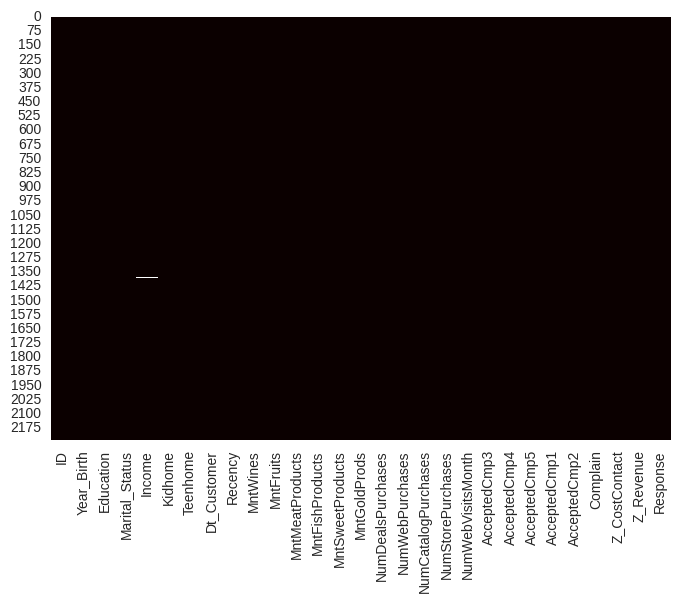

In [ ]:
#plotting with heatmap for null values 
sn.heatmap(df_cust.isnull(),cbar=False,cmap='hot')

In [ ]:
#checking with information of data 
df_cust.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

In [ ]:
#checking with the datatypes 
df_cust.dtypes

ID                              int64
Year_Birth                      int64
Education                      object
Marital_Status                 object
Income                        float64
Kidhome                         int64
Teenhome                        int64
Dt_Customer            datetime64[ns]
Recency                         int64
MntWines                        int64
MntFruits                       int64
MntMeatProducts                 int64
MntFishProducts                 int64
MntSweetProducts                int64
MntGoldProds                    int64
NumDealsPurchases               int64
NumWebPurchases                 int64
NumCatalogPurchases             int64
NumStorePurchases               int64
NumWebVisitsMonth               int64
AcceptedCmp3                    int64
AcceptedCmp4                    int64
AcceptedCmp5                    int64
AcceptedCmp1                    int64
AcceptedCmp2                    int64
Complain                        int64
Z_CostContac

In [ ]:
#checking for any duplicate records 
df_cust[df_cust.duplicated()]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response


# Univariate Analysis

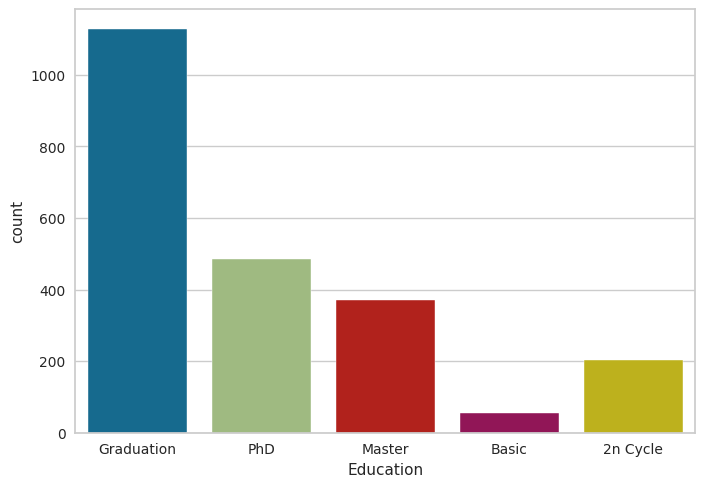

In [ ]:
# checking with the count of education 
sn.set_style('whitegrid') 
sn.countplot(x ='Education',data=df_cust)  
plt.show() 

 - Observation

 We observe that most of the customers come from a good background of education ,most of them are having post garduation and graduation degrees 
   


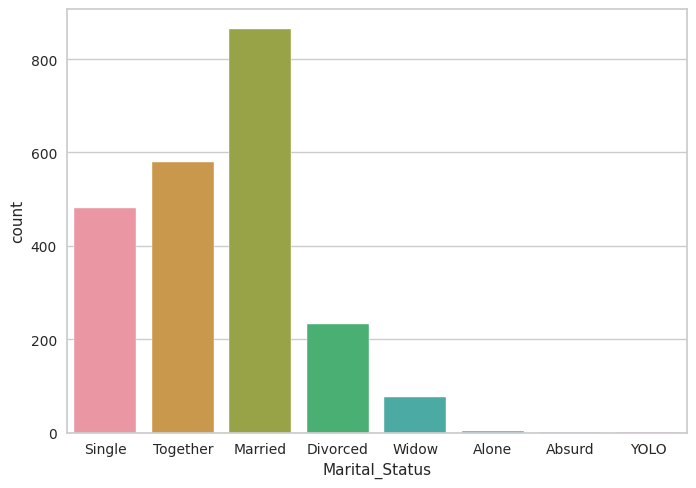

In [ ]:
#checking with feature marital_status
sn.set_style('whitegrid') 
sn.countplot(x ='Marital_Status',data=df_cust)  
plt.show() 

- Observation 

We observe that most of them are in a association compared to bachelors and singles 

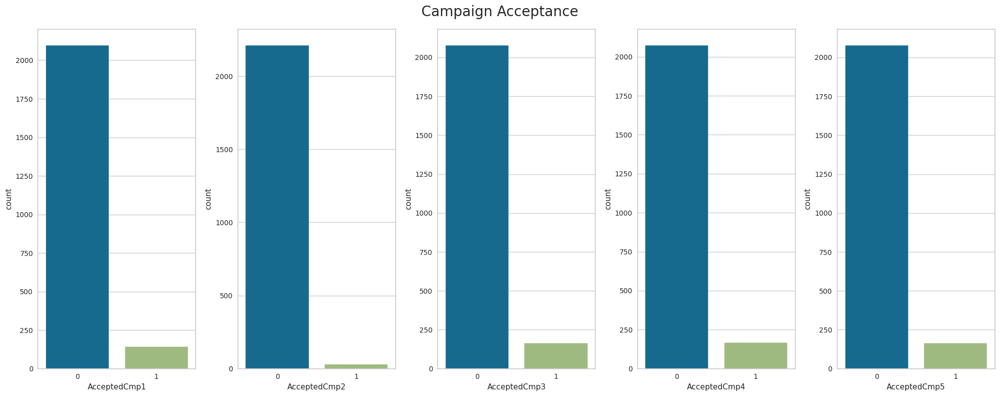

In [ ]:
#checking count with customers accepted campaigns 
fig,ax = plt.subplots(1,5,figsize = (20,8))
colors =['#9EF8EE','#348888']
fig.suptitle('Campaign Acceptance',fontsize = 20)
sn.countplot(ax = ax[0],x = 'AcceptedCmp1',data=df_cust)
sn.countplot(ax = ax[1],x = 'AcceptedCmp2',data=df_cust)
sn.countplot(ax = ax[2],x = 'AcceptedCmp3',data=df_cust)
sn.countplot(ax = ax[3],x = 'AcceptedCmp4',data=df_cust)
sn.countplot(ax = ax[4],x = 'AcceptedCmp5',data=df_cust)
plt.tight_layout()

- Observation

We observe that most of the people have not participated in any of the campaigns and accepted offers  



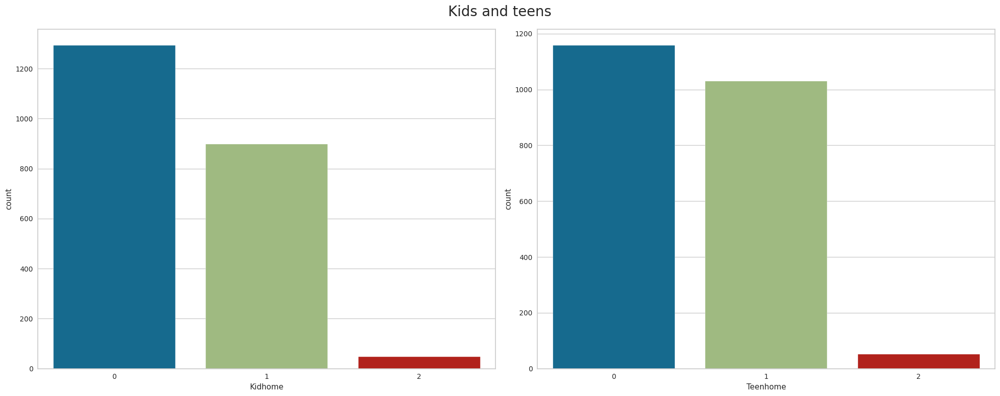

In [ ]:
#checking with the count of children 
fig,ax = plt.subplots(1,2,figsize = (20,8))
colors =['#9EF8EE','#348888']
fig.suptitle('Kids and teens',fontsize = 20)
sn.countplot(ax = ax[0],x = 'Kidhome',data=df_cust)
sn.countplot(ax = ax[1],x = 'Teenhome',data=df_cust)

plt.tight_layout()


 - observations 
 We observe that the ratio is equally shared by kids and teens, most of the customers have no kids or teens 

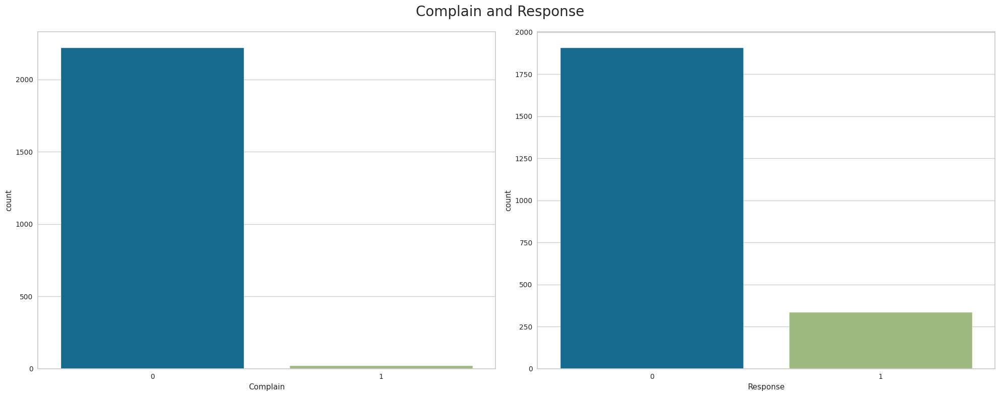

In [ ]:
#plotting with complain and response 
fig,ax = plt.subplots(1,2,figsize = (20,8))
colors =['#9EF8EE','#348888']
fig.suptitle('Complain and Response',fontsize = 20)
sn.countplot(ax = ax[0],x = 'Complain',data=df_cust)
sn.countplot(ax = ax[1],x = 'Response',data=df_cust)

plt.tight_layout()


 - Observations 
 
 - We observe that most of the customers have no complains 
 - In the response plot most have not well reponded to the recent campaign or last campaign 

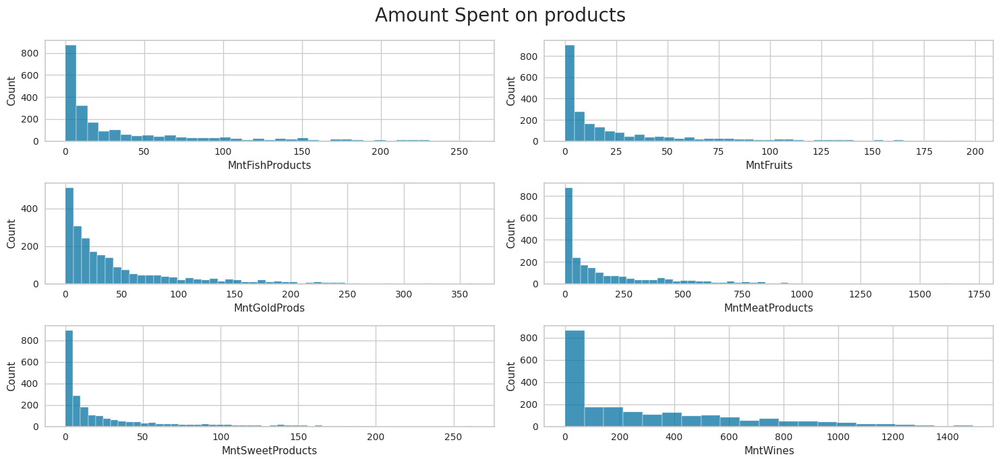

In [ ]:
fig,ax = plt.subplots(nrows = 3,ncols = 2,figsize = (15,7))
fig.suptitle('Amount Spent on products',fontsize = 20)
sn.histplot(ax = ax[0,0],x = 'MntFishProducts',data=df_cust)
sn.histplot(ax = ax[0,1],x = 'MntFruits',data=df_cust)
sn.histplot(ax = ax[1,0],x = 'MntGoldProds',data=df_cust)
sn.histplot(ax = ax[1,1],x = 'MntMeatProducts',data=df_cust)
sn.histplot(ax = ax[2,0],x = 'MntSweetProducts',data=df_cust)
sn.histplot(ax = ax[2,1],x = 'MntWines',data=df_cust)
plt.tight_layout()


- Observations 

- We observe that most of the customer have highest expenditure over wines and meatproducts and least engaged with fruits 

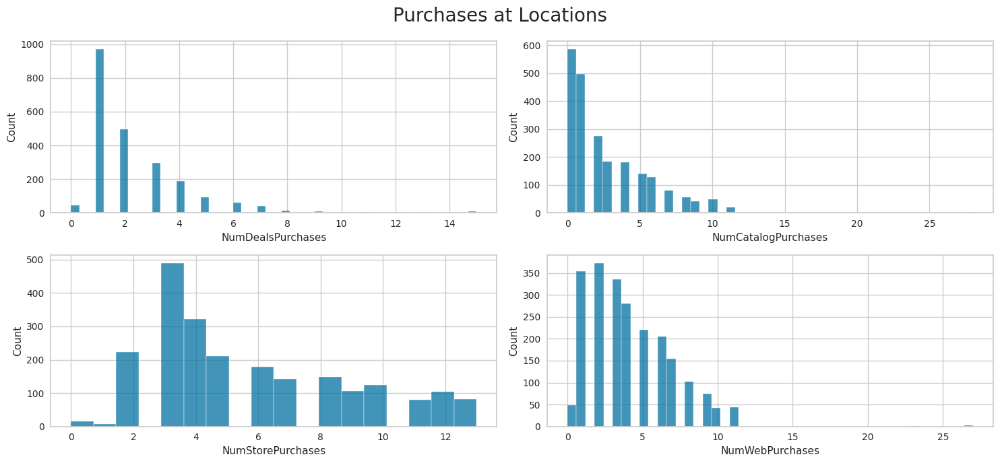

In [ ]:
#plotting with purchases at different locations 
fig,ax = plt.subplots(nrows = 2,ncols = 2,figsize = (15,7))
fig.suptitle('Purchases at Locations',fontsize = 20)
sn.histplot(ax = ax[0,0],x = 'NumDealsPurchases',data=df_cust)
sn.histplot(ax = ax[0,1],x = 'NumCatalogPurchases',data=df_cust)
sn.histplot(ax = ax[1,0],x = 'NumStorePurchases',data=df_cust)
sn.histplot(ax = ax[1,1],x = 'NumWebPurchases',data=df_cust)

plt.tight_layout()

 - Observations 

 -  We observe most of the customers have reached to catalogs and purchased items and have selected particular item 

 - we can also see most of the customers have prefeered online shopping and have purchased from website 

 - most of customers have reach out to store and we can infer that customers purchase rate through store is less compared to other locations 

ID


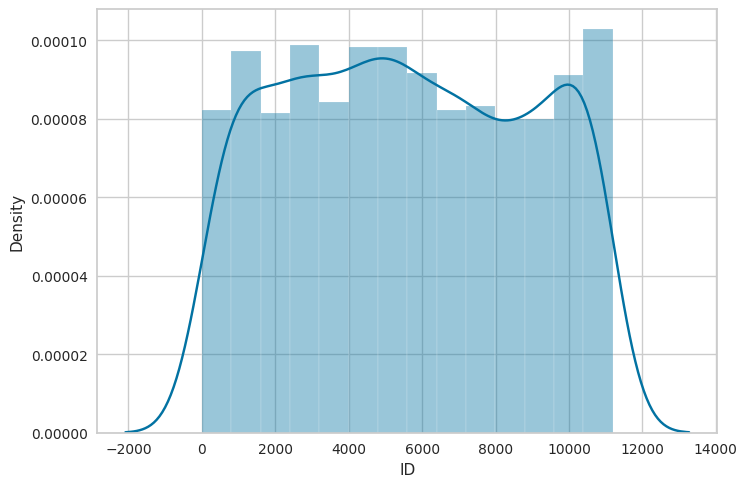

<Figure size 2000x1000 with 0 Axes>

Year_Birth


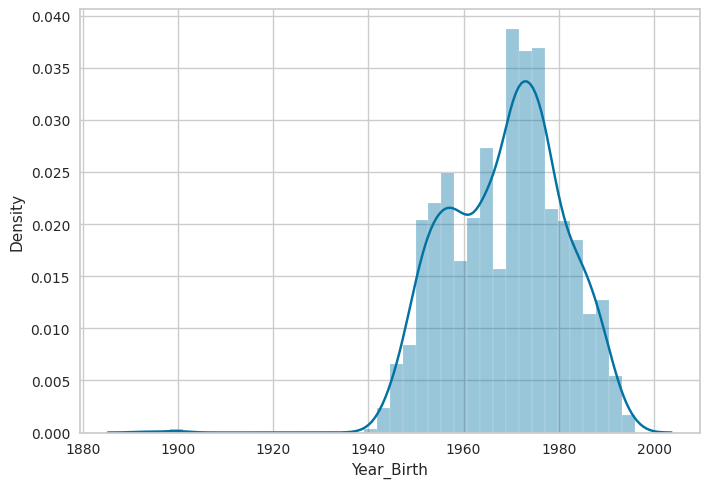

<Figure size 2000x1000 with 0 Axes>

Kidhome


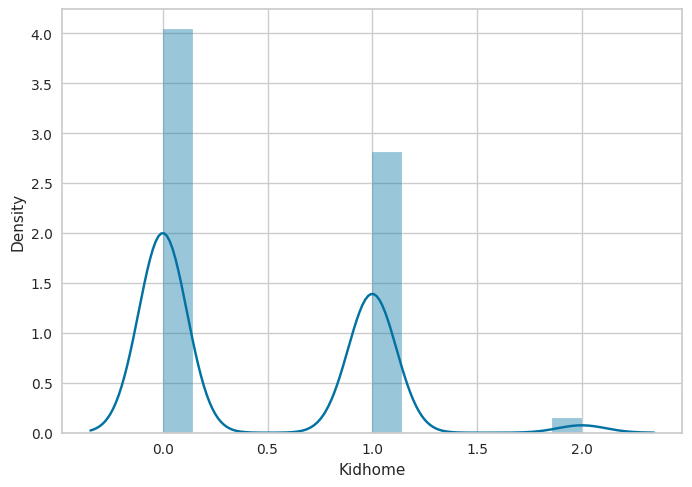

<Figure size 2000x1000 with 0 Axes>

Teenhome


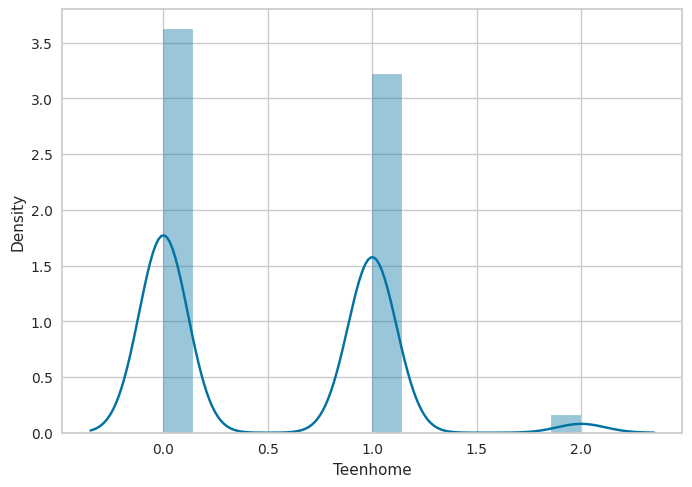

<Figure size 2000x1000 with 0 Axes>

Recency


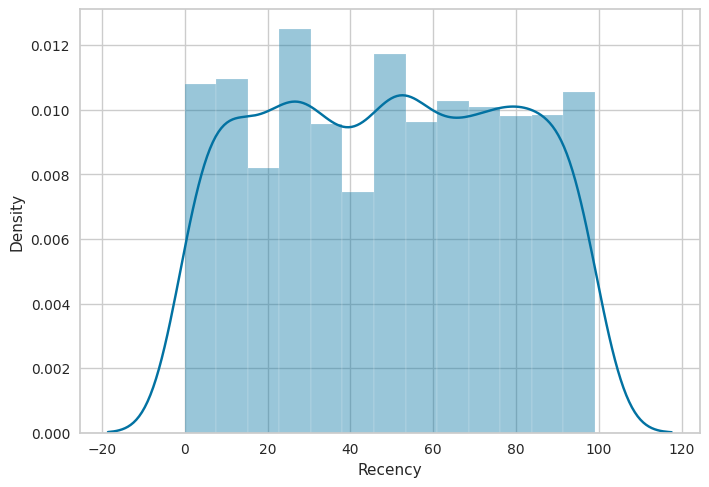

<Figure size 2000x1000 with 0 Axes>

MntWines


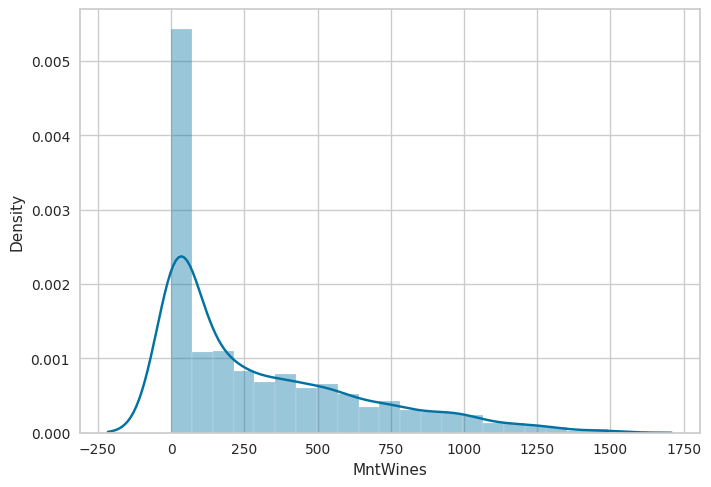

<Figure size 2000x1000 with 0 Axes>

MntFruits


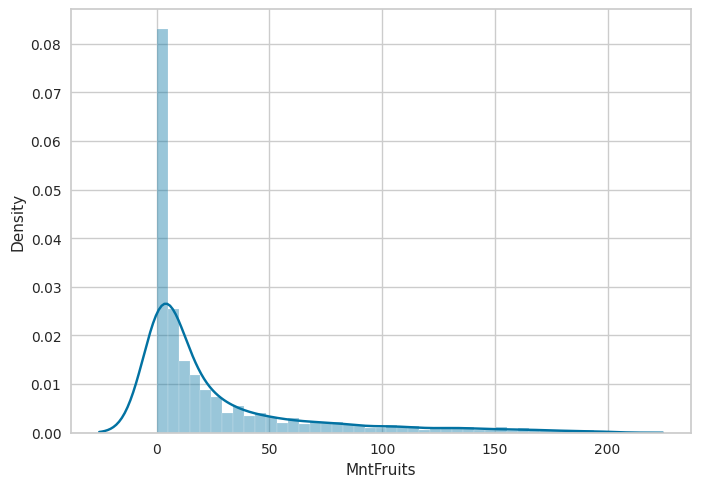

<Figure size 2000x1000 with 0 Axes>

MntMeatProducts


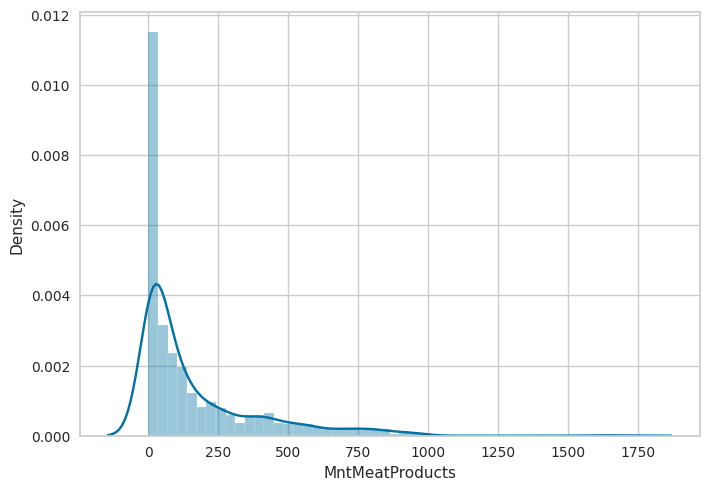

<Figure size 2000x1000 with 0 Axes>

MntFishProducts


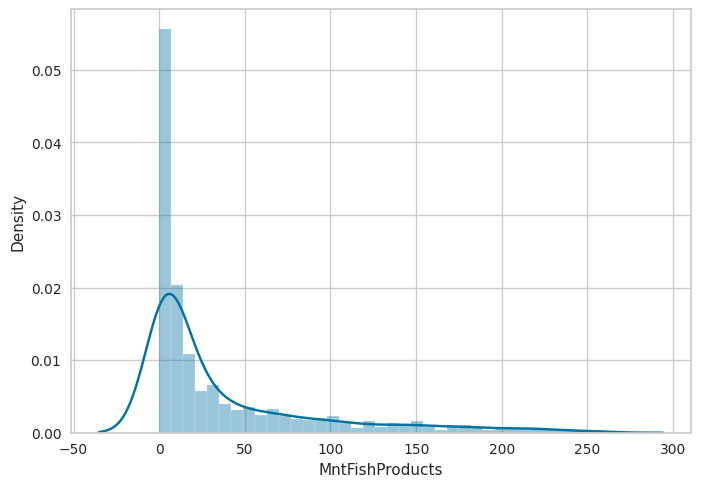

<Figure size 2000x1000 with 0 Axes>

MntSweetProducts


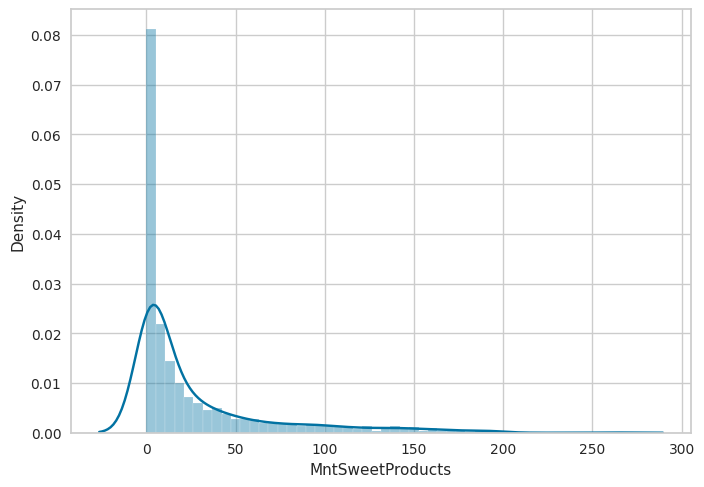

<Figure size 2000x1000 with 0 Axes>

MntGoldProds


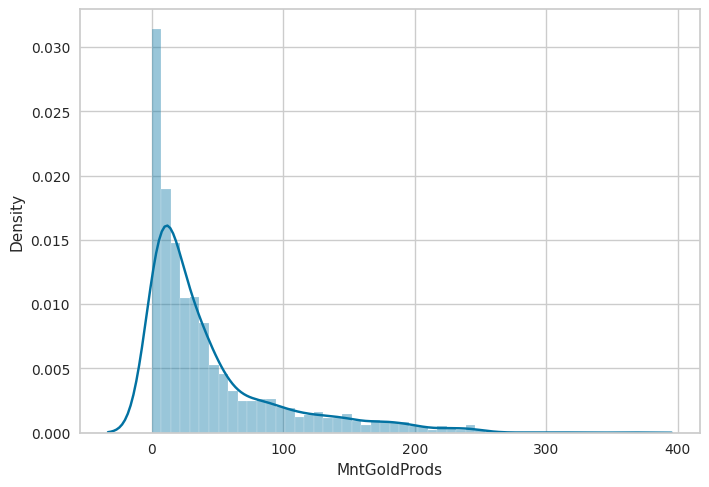

<Figure size 2000x1000 with 0 Axes>

NumDealsPurchases


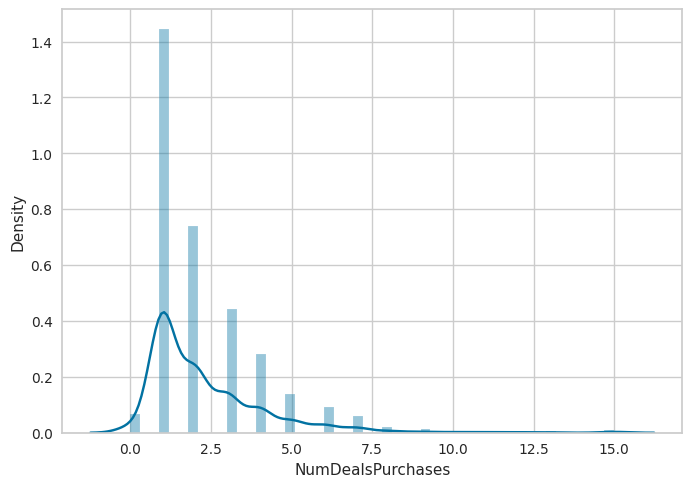

<Figure size 2000x1000 with 0 Axes>

NumWebPurchases


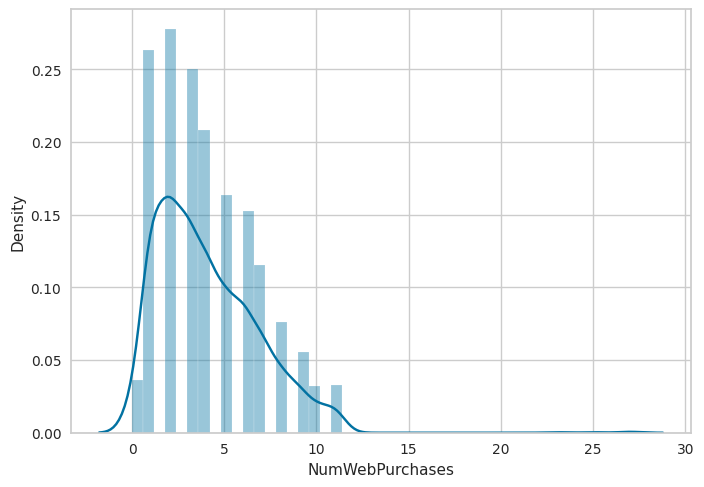

<Figure size 2000x1000 with 0 Axes>

NumCatalogPurchases


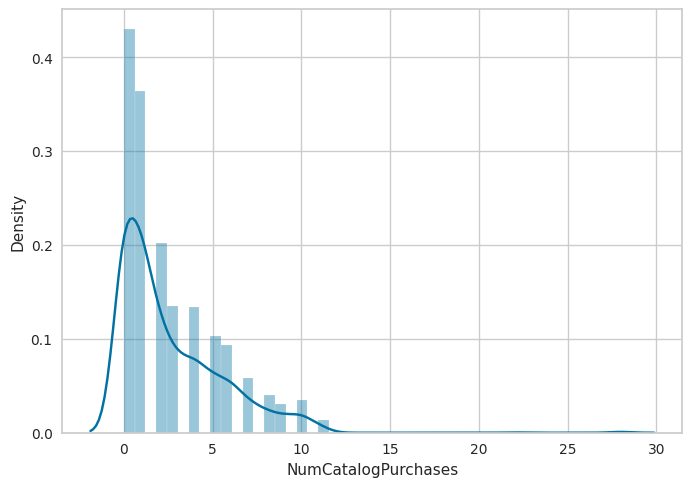

<Figure size 2000x1000 with 0 Axes>

NumStorePurchases


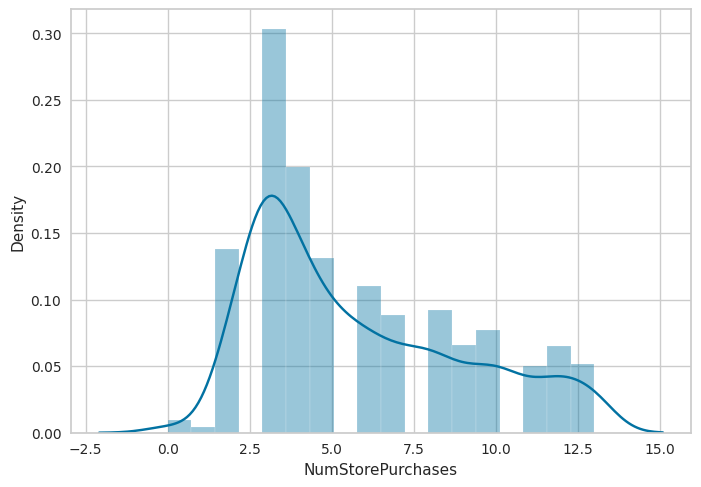

<Figure size 2000x1000 with 0 Axes>

NumWebVisitsMonth


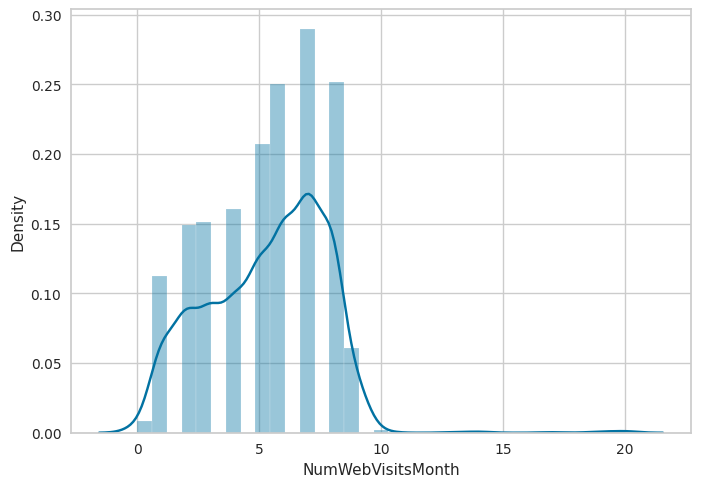

<Figure size 2000x1000 with 0 Axes>

AcceptedCmp3


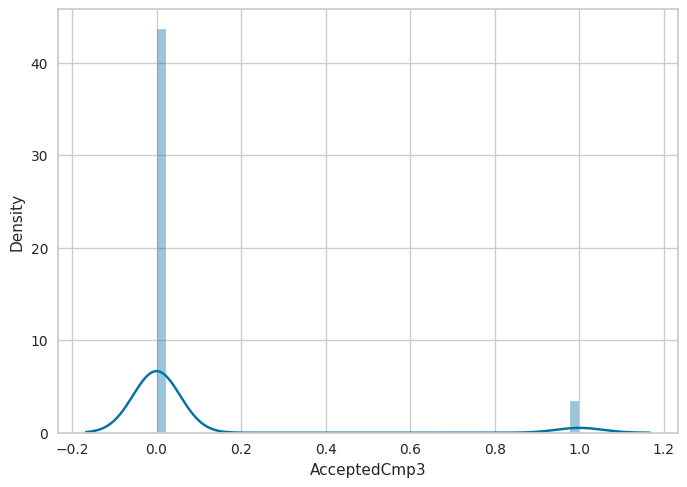

<Figure size 2000x1000 with 0 Axes>

AcceptedCmp4


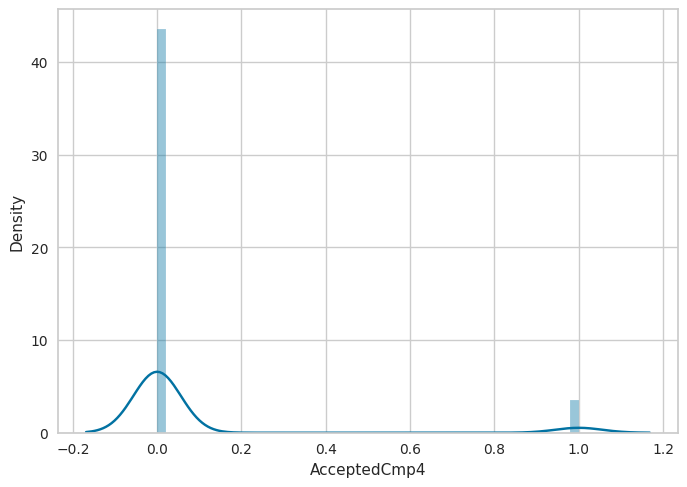

<Figure size 2000x1000 with 0 Axes>

AcceptedCmp5


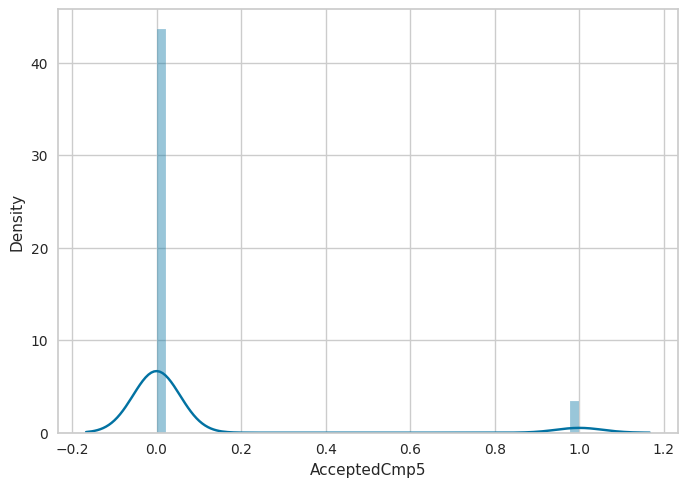

<Figure size 2000x1000 with 0 Axes>

AcceptedCmp1


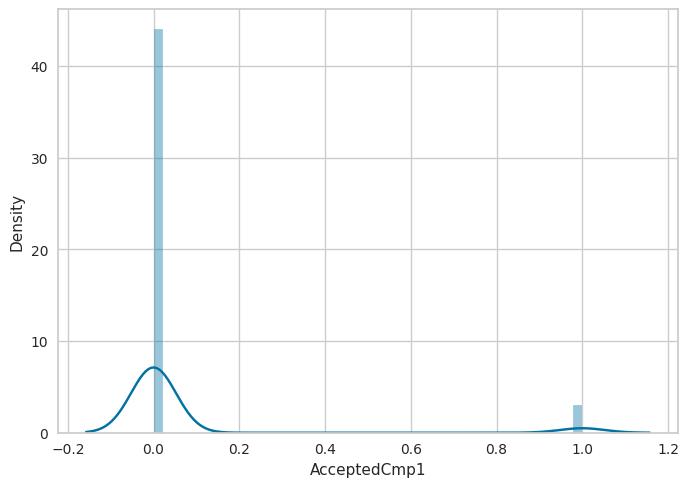

<Figure size 2000x1000 with 0 Axes>

AcceptedCmp2


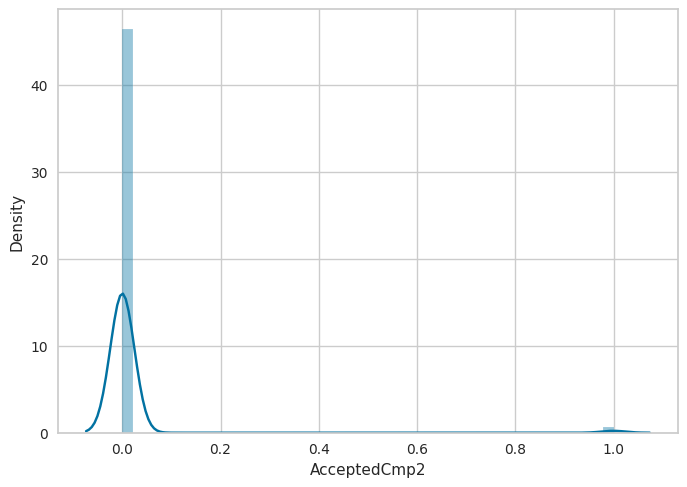

<Figure size 2000x1000 with 0 Axes>

Complain


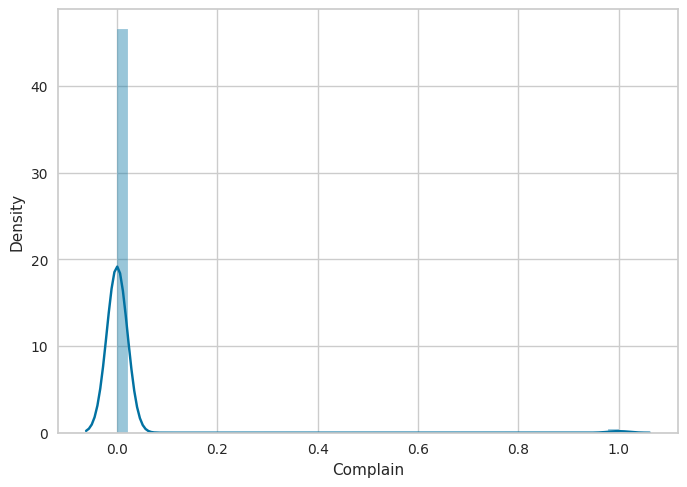

<Figure size 2000x1000 with 0 Axes>

Z_CostContact


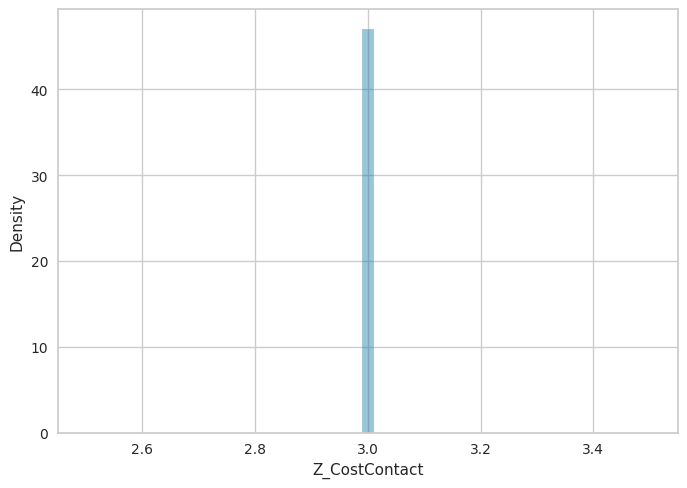

<Figure size 2000x1000 with 0 Axes>

Z_Revenue


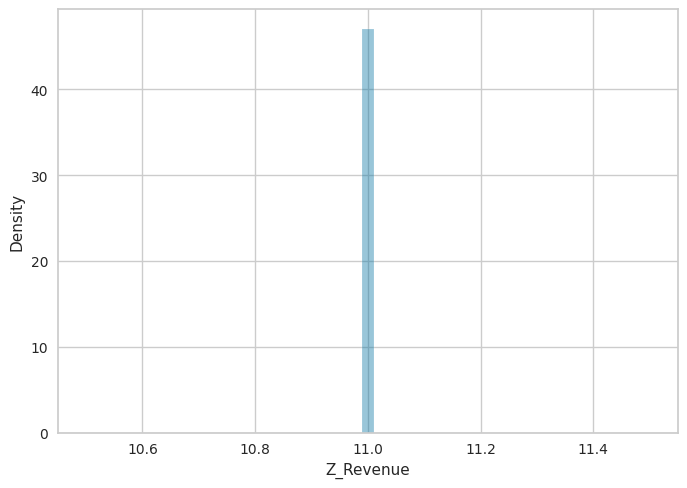

<Figure size 2000x1000 with 0 Axes>

Response


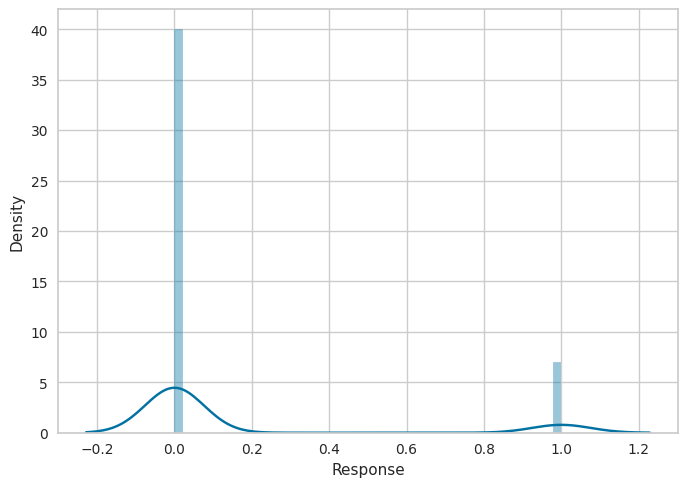

<Figure size 2000x1000 with 0 Axes>

In [ ]:
#checking distribution for numerical data 
numerical_feature = df_cust.select_dtypes(include = 'integer')

for n in numerical_feature.columns:
    print(n)
   
    sn.distplot(numerical_feature[n])
    plt.figure(figsize=(20,10))
    plt.show()

In [ ]:
#checking with value counts of categorical features 
categorical_feature = df_cust.select_dtypes(include = 'object')

for var in categorical_feature:
    
    print(df_cust[var].value_counts())

Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64


Income


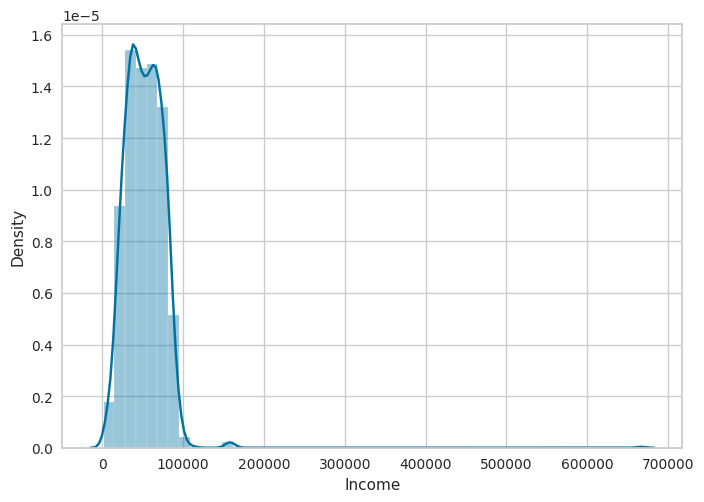

<Figure size 2000x1000 with 0 Axes>

In [ ]:
#checking with any float value 
float_feature = df_cust.select_dtypes(include = 'float')

for n in float_feature.columns:
    print(n)
    
    sn.distplot(float_feature[n])
    plt.figure(figsize=(20,10))
    plt.show()


 Observations 

- We observe that  our numerical dataset is not normally distributed, this tells us that the data has skewness and needs to be treated 

- We also observe that the Income feature contains null values which needs to be treated 

- we also observe that the distribution of feeature Z_cost contact and Z_cost revenue is very similiar. 

- We also have categorical columns which needs to be converted to numerical columns by feature engineering 

- We observe that in the income column our data is highly skewed and does not support a normal distribution so to fill null values we go with median,moreover median also reduces the effect of outliers  


## Feature analysis

In [ ]:
df_cust.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [ ]:
#dropping our ID,Z_CostContact,Z_Revenue
df_cust2 = df_cust.drop(['ID','Z_CostContact','Z_Revenue'],axis = 1)

In [ ]:
df_cust2

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,...,3,4,5,0,0,0,0,0,0,0
2236,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,...,2,5,7,0,0,0,1,0,0,0
2237,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,...,3,13,6,0,1,0,0,0,0,0
2238,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,...,5,10,3,0,0,0,0,0,0,0


- Analysis On Products feature 

In [ ]:
#checking the unique labels of products 
products = [df_cust2['MntWines'],df_cust2['MntFishProducts'],df_cust2['MntGoldProds'],df_cust2['MntMeatProducts'],df_cust2['MntSweetProducts'],df_cust2['MntFruits']]

for items in products:
  print(items.unique())

[ 635   11  426  173  520  235   76   14   28    5    6  194  233    3
 1006   53   84 1012    4   86    1  867  384  270   36  684    8  112
  110   96  482   40  702   55  437  421   13    9   81  123   48  826
  245  650   12  510  328  984  295  447  712  452  523  546  398   10
  688  247  856  496   25  258  565    2  721 1032  577   64  163   17
  130  292  350  135  230    7  445   15   27  505   51  207   41  386
  562  217  144  454  425 1332  527  490  378  547   47  320   34  722
  162  450   70  352  492  120  534  236  231  220  796    0  962  738
  399  614   32  598   73   42  346  888  997  212  536 1349 1001   20
   18  125  277   85   59 1149  847   29  152  620   35  356  783  466
   23  656  519  344  448  265  587  763   22   54 1170   72  613  224
  410  239  171 1076  182  824   30  377  155  897  131  297  787  792
  983  415  901  382  559  789 1218  925  864  960   16  168   45   24
  918  138  554  167  177   38  483   77  778   33  625  216   68  196
  204 

In [ ]:
df_cust2['Expenses'] = df_cust2['MntWines'] + df_cust2['MntFruits'] + df_cust2['MntMeatProducts'] + df_cust2['MntFishProducts'] + df_cust2['MntSweetProducts'] + df_cust2['MntGoldProds']

 
df_cust2['Expenses'].head(10)



0    1617
1      27
2     776
3      53
4     422
5     716
6     590
7     169
8      46
9      49
Name: Expenses, dtype: int64

In [ ]:
df_cust2.drop(['MntWines','MntFruits','MntFishProducts','MntGoldProds','MntMeatProducts','MntSweetProducts'],axis = 1,inplace=True)

In [ ]:
df_cust2.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Expenses
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,3,8,...,4,7,0,0,0,0,0,0,1,1617
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,2,1,...,2,5,0,0,0,0,0,0,0,27
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,1,8,...,10,4,0,0,0,0,0,0,0,776
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,2,2,...,4,6,0,0,0,0,0,0,0,53
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,5,5,...,6,5,0,0,0,0,0,0,0,422


In [ ]:
#checking with the mean of expenses on total products 
df_cust2.Expenses.mean()

605.7982142857143

- Purchases Feature 

In [ ]:
Purchases = df_cust2['NumCatalogPurchases'],df_cust2['NumDealsPurchases'],df_cust2['NumStorePurchases'],df_cust2['NumWebPurchases']

for items in Purchases:
  print(items.unique())



[10  1  2  0  3  4  6 28  9  5  8  7 11 22]
[ 3  2  1  5  4 15  7  0  6  9 12  8 10 13 11]
[ 4  2 10  6  7  0  3  8  5 12  9 13 11  1]
[ 8  1  2  5  6  7  4  3 11  0 27 10  9 23 25]


In [ ]:
#adding Purchases features
df_cust2['Purchases'] = df_cust2['NumCatalogPurchases']+df_cust2['NumDealsPurchases']+df_cust2['NumStorePurchases']+df_cust2['NumWebPurchases']

df_cust2['Purchases'].head(10)

0    25
1     6
2    21
3     8
4    19
5    22
6    21
7    10
8     6
9     2
Name: Purchases, dtype: int64

In [ ]:
#dropping the columns 
df_cust2.drop(['NumCatalogPurchases','NumDealsPurchases','NumStorePurchases','NumWebPurchases'],axis = 1 , inplace = True)

In [ ]:
df_cust2

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Expenses,Purchases
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,7,0,0,0,0,0,0,1,1617,25
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,5,0,0,0,0,0,0,0,27,6
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,4,0,0,0,0,0,0,0,776,21
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,6,0,0,0,0,0,0,0,53,8
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,5,0,0,0,0,0,0,0,422,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,5,0,0,0,0,0,0,0,1341,18
2236,1946,PhD,Together,64014.0,2,1,2014-06-10,56,7,0,0,0,1,0,0,0,444,22
2237,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,6,0,1,0,0,0,0,0,1241,19
2238,1956,Master,Together,69245.0,0,1,2014-01-24,8,3,0,0,0,0,0,0,0,843,23


In [ ]:
#checking with the mean of purchase 
df_cust2.Purchases.mean()

14.862053571428572

- Acceptance Feature

In [ ]:
Acceptance = [df_cust2['AcceptedCmp1'],df_cust2['AcceptedCmp2'],df_cust2['AcceptedCmp3'],df_cust2['AcceptedCmp4'],df_cust2['AcceptedCmp5']]

for items in Acceptance:
  print(items.unique)

<bound method Series.unique of 0       0
1       0
2       0
3       0
4       0
       ..
2235    0
2236    1
2237    0
2238    0
2239    0
Name: AcceptedCmp1, Length: 2240, dtype: int64>
<bound method Series.unique of 0       0
1       0
2       0
3       0
4       0
       ..
2235    0
2236    0
2237    0
2238    0
2239    0
Name: AcceptedCmp2, Length: 2240, dtype: int64>
<bound method Series.unique of 0       0
1       0
2       0
3       0
4       0
       ..
2235    0
2236    0
2237    0
2238    0
2239    0
Name: AcceptedCmp3, Length: 2240, dtype: int64>
<bound method Series.unique of 0       0
1       0
2       0
3       0
4       0
       ..
2235    0
2236    0
2237    1
2238    0
2239    0
Name: AcceptedCmp4, Length: 2240, dtype: int64>
<bound method Series.unique of 0       0
1       0
2       0
3       0
4       0
       ..
2235    0
2236    0
2237    0
2238    0
2239    0
Name: AcceptedCmp5, Length: 2240, dtype: int64>


In [ ]:
#combining our acceptance column to one feature 
df_cust2['Acceptance'] = df_cust2['AcceptedCmp1']+df_cust2['AcceptedCmp2']+df_cust2['AcceptedCmp3']+df_cust2['AcceptedCmp4']+df_cust2['AcceptedCmp5']

df_cust2['Acceptance'].head(100)

0     0
1     0
2     0
3     0
4     0
     ..
95    0
96    1
97    0
98    1
99    0
Name: Acceptance, Length: 100, dtype: int64

In [ ]:
df_cust.AcceptedCmp1.value_counts()

0    2096
1     144
Name: AcceptedCmp1, dtype: int64

In [ ]:
#dropping campaign acceptance columns from main dataframe 
df_cust2.drop(['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5'],axis=1,inplace = True)

In [ ]:
df_cust2.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,NumWebVisitsMonth,Complain,Response,Expenses,Purchases,Acceptance
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,7,0,1,1617,25,0
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,5,0,0,27,6,0
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,4,0,0,776,21,0
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,6,0,0,53,8,0
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,5,0,0,422,19,0


- Children Feature

In [ ]:
#checking with value counts with children 
Children = [df_cust2['Kidhome'],df_cust2['Teenhome']]

for items in Children:
  print(items.value_counts())

0    1293
1     899
2      48
Name: Kidhome, dtype: int64
0    1158
1    1030
2      52
Name: Teenhome, dtype: int64


In [ ]:
#combining children columns into one column 
df_cust2['Children'] = df_cust2['Kidhome']+df_cust2['Teenhome']

df_cust2['Children'].head(10)

0    0
1    2
2    0
3    1
4    1
5    1
6    1
7    1
8    1
9    2
Name: Children, dtype: int64

In [ ]:
#dropping our kids and teen column 
df_cust2.drop(['Kidhome','Teenhome'],axis = 1,inplace = True)

In [ ]:
df_cust2.head()

,Year_Birth,Education,Marital_Status,Income,Dt_Customer,Recency,NumWebVisitsMonth,Complain,Response,Expenses,Purchases,Acceptance,Children
0,1957,Graduation,Single,58138.0,2012-09-04,58,7,0,1,1617,25,0,0
1,1954,Graduation,Single,46344.0,2014-03-08,38,5,0,0,27,6,0,2
2,1965,Graduation,Together,71613.0,2013-08-21,26,4,0,0,776,21,0,0
3,1984,Graduation,Together,26646.0,2014-02-10,26,6,0,0,53,8,0,1
4,1981,PhD,Married,58293.0,2014-01-19,94,5,0,0,422,19,0,1


Customer Age Feature

In [ ]:
#extracting the year,day name and month name from date customer feature 
df_cust2['Year_Enr'] = df_cust2['Dt_Customer'].dt.year
df_cust2['Day'] = df_cust2['Dt_Customer'].dt.day_name()
df_cust2['month'] = df_cust2['Dt_Customer'].dt.month_name()

In [ ]:
df_cust2.head()

,Year_Birth,Education,Marital_Status,Income,Dt_Customer,Recency,NumWebVisitsMonth,Complain,Response,Expenses,Purchases,Acceptance,Children,Year_Enr,Day,month
0,1957,Graduation,Single,58138.0,2012-09-04,58,7,0,1,1617,25,0,0,2012,Tuesday,September
1,1954,Graduation,Single,46344.0,2014-03-08,38,5,0,0,27,6,0,2,2014,Saturday,March
2,1965,Graduation,Together,71613.0,2013-08-21,26,4,0,0,776,21,0,0,2013,Wednesday,August
3,1984,Graduation,Together,26646.0,2014-02-10,26,6,0,0,53,8,0,1,2014,Monday,February
4,1981,PhD,Married,58293.0,2014-01-19,94,5,0,0,422,19,0,1,2014,Sunday,January


In [ ]:
df_cust2.Dt_Customer.value_counts()

2012-08-31    12
2012-09-12    11
2013-02-14    11
2014-05-12    11
2013-08-20    10
              ..
2012-08-05     1
2012-11-18     1
2013-05-25     1
2013-04-14     1
2014-01-09     1
Name: Dt_Customer, Length: 663, dtype: int64

In [ ]:
print(df_cust2.Dt_Customer.max(),df_cust2.Dt_Customer.min())

2014-06-29 00:00:00 2012-07-30 00:00:00


In [ ]:
#Extracting Day engaged with the company using the schedule of first day enrollment program of next year
df_cust2['Dt_Customer'] = pd.to_datetime(df_cust2.Dt_Customer)
df_cust2['First_day'] = '01-01-2015'
df_cust2['First_day'] = pd.to_datetime(df_cust2.First_day)
df_cust2['day_engaged'] = (df_cust2['First_day'] - df_cust2['Dt_Customer']).dt.days


In [ ]:
df_cust2.head()

,Year_Birth,Education,Marital_Status,Income,Dt_Customer,Recency,NumWebVisitsMonth,Complain,Response,Expenses,Purchases,Acceptance,Children,Year_Enr,Day,month,First_day,day_engaged
0,1957,Graduation,Single,58138.0,2012-09-04,58,7,0,1,1617,25,0,0,2012,Tuesday,September,2015-01-01,849
1,1954,Graduation,Single,46344.0,2014-03-08,38,5,0,0,27,6,0,2,2014,Saturday,March,2015-01-01,299
2,1965,Graduation,Together,71613.0,2013-08-21,26,4,0,0,776,21,0,0,2013,Wednesday,August,2015-01-01,498
3,1984,Graduation,Together,26646.0,2014-02-10,26,6,0,0,53,8,0,1,2014,Monday,February,2015-01-01,325
4,1981,PhD,Married,58293.0,2014-01-19,94,5,0,0,422,19,0,1,2014,Sunday,January,2015-01-01,347


In [ ]:
df_cust2['Customer_Age'] = 2023 - df_cust2['Year_Birth']

In [ ]:
df_cust2.head()

,Year_Birth,Education,Marital_Status,Income,Dt_Customer,Recency,NumWebVisitsMonth,Complain,Response,Expenses,Purchases,Acceptance,Children,Year_Enr,Day,month,First_day,day_engaged,Customer_Age
0,1957,Graduation,Single,58138.0,2012-09-04,58,7,0,1,1617,25,0,0,2012,Tuesday,September,2015-01-01,849,66
1,1954,Graduation,Single,46344.0,2014-03-08,38,5,0,0,27,6,0,2,2014,Saturday,March,2015-01-01,299,69
2,1965,Graduation,Together,71613.0,2013-08-21,26,4,0,0,776,21,0,0,2013,Wednesday,August,2015-01-01,498,58
3,1984,Graduation,Together,26646.0,2014-02-10,26,6,0,0,53,8,0,1,2014,Monday,February,2015-01-01,325,39
4,1981,PhD,Married,58293.0,2014-01-19,94,5,0,0,422,19,0,1,2014,Sunday,January,2015-01-01,347,42


In [ ]:
df_cust2 = df_cust2.drop(['Dt_Customer','Year_Birth','First_day'],axis=1)

In [ ]:
#extracting age frequency of customers enrolled from the year joined till today 
df_cust2['Enr_Freq'] = 2023 - df_cust2['Year_Enr']

In [ ]:
df_cust2.head()

,Education,Marital_Status,Income,Recency,NumWebVisitsMonth,Complain,Response,Expenses,Purchases,Acceptance,Children,Year_Enr,Day,month,day_engaged,Customer_Age,Enr_Freq
0,Graduation,Single,58138.0,58,7,0,1,1617,25,0,0,2012,Tuesday,September,849,66,11
1,Graduation,Single,46344.0,38,5,0,0,27,6,0,2,2014,Saturday,March,299,69,9
2,Graduation,Together,71613.0,26,4,0,0,776,21,0,0,2013,Wednesday,August,498,58,10
3,Graduation,Together,26646.0,26,6,0,0,53,8,0,1,2014,Monday,February,325,39,9
4,PhD,Married,58293.0,94,5,0,0,422,19,0,1,2014,Sunday,January,347,42,9


In [ ]:
#checking value counts with Day enrolled 
df_cust2.Day.value_counts()

Monday       341
Wednesday    339
Friday       333
Saturday     325
Thursday     310
Sunday       308
Tuesday      284
Name: Day, dtype: int64

In [ ]:
#checking value counts with month enrolled 
df_cust2.month.value_counts()

August       222
May          216
October      212
March        211
January      197
September    193
November     187
April        182
February     178
December     175
June         166
July         101
Name: month, dtype: int64

<Axes: ylabel='Day'>

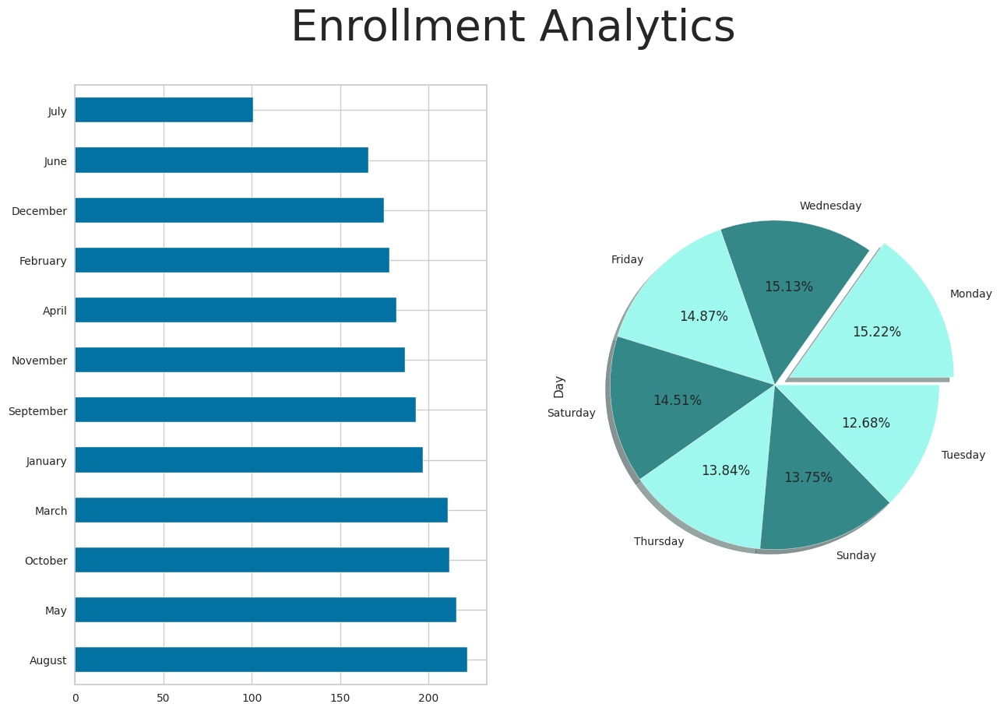

In [ ]:
#plotting enrollment analysis with the company 
fig,ax = plt.subplots(1,2,figsize = (15,10))
colors =['#9EF8EE','#348888']
fig.suptitle('Enrollment Analytics',fontsize = 40)
df_cust2.month.value_counts().sort_values(ascending = False).plot(ax = ax [0],kind ='barh')
df_cust2.Day.value_counts().plot(ax = ax [1],kind ='pie', autopct= '%.2f%%',shadow=True,explode = [0.1,0.0,0.0,0.0,0.0,0.0,0.0],colors=colors)

Obervations
- In the customer enrollment analytics we observe that most of the customer have enrolled in the month of August, and least in th month of july

- In the customer enrollment analytics We observe that on daily analysis that most customers have enrolled on Monday and least on tuesday



In [ ]:
#computing the counts of years of relationship with company
df_cust2.Enr_Freq.value_counts()

10    1189
9      557
11     494
Name: Enr_Freq, dtype: int64

In [ ]:
#dropping unecessary columns with a new dataframe 
df_cust3  = df_cust2.copy()
df_cust3 = df_cust3.drop(['Day','month','Year_Enr','NumWebVisitsMonth','Complain','Response'],axis = 1)

In [ ]:
df_cust3.head()

,Education,Marital_Status,Income,Recency,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq
0,Graduation,Single,58138.0,58,1617,25,0,0,849,66,11
1,Graduation,Single,46344.0,38,27,6,0,2,299,69,9
2,Graduation,Together,71613.0,26,776,21,0,0,498,58,10
3,Graduation,Together,26646.0,26,53,8,0,1,325,39,9
4,PhD,Married,58293.0,94,422,19,0,1,347,42,9


- Marital_Status Feature

In [ ]:
df_cust3.Marital_Status.value_counts()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

In [ ]:
#replacing values of marital status 
df_cust3['Marital_Status'] = df_cust3['Marital_Status'].replace(['Married','Together'],'Couple')
df_cust3['Marital_Status'] = df_cust3['Marital_Status'].replace(['Single','Divorced','Widow','Alone','Absurd','YOLO'],'Solo')

In [ ]:
print(df_cust3.Marital_Status.value_counts())

Couple    1444
Solo       796
Name: Marital_Status, dtype: int64


In [ ]:
df_cust3.head()

,Education,Marital_Status,Income,Recency,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq
0,Graduation,Solo,58138.0,58,1617,25,0,0,849,66,11
1,Graduation,Solo,46344.0,38,27,6,0,2,299,69,9
2,Graduation,Couple,71613.0,26,776,21,0,0,498,58,10
3,Graduation,Couple,26646.0,26,53,8,0,1,325,39,9
4,PhD,Couple,58293.0,94,422,19,0,1,347,42,9


- Education Feature

In [ ]:
df_cust3.Education.value_counts()

Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

In [ ]:
#replacing values of Education 
df_cust3['Education'] = df_cust3['Education'].replace(['PhD','Master','2n Cycle'],'PostGrad')
df_cust3['Education'] = df_cust3['Education'].replace(['Graduation'],'Grad')
df_cust3['Education'] = df_cust3['Education'].replace(['Basic'],'Undergrad')

In [ ]:
df_cust3.Education.value_counts()

Grad         1127
PostGrad     1059
Undergrad      54
Name: Education, dtype: int64

In [ ]:
df_cust3.head()

,Education,Marital_Status,Income,Recency,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq
0,Grad,Solo,58138.0,58,1617,25,0,0,849,66,11
1,Grad,Solo,46344.0,38,27,6,0,2,299,69,9
2,Grad,Couple,71613.0,26,776,21,0,0,498,58,10
3,Grad,Couple,26646.0,26,53,8,0,1,325,39,9
4,PostGrad,Couple,58293.0,94,422,19,0,1,347,42,9


In [ ]:
#dropping the recency columns as we dont require 
df_cust3 = df_cust3.drop(['Recency'],axis = 1)

In [ ]:
df_cust3.head()

,Education,Marital_Status,Income,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq
0,Grad,Solo,58138.0,1617,25,0,0,849,66,11
1,Grad,Solo,46344.0,27,6,0,2,299,69,9
2,Grad,Couple,71613.0,776,21,0,0,498,58,10
3,Grad,Couple,26646.0,53,8,0,1,325,39,9
4,PostGrad,Couple,58293.0,422,19,0,1,347,42,9


# EDA And Visualizations

- Income Feature

In [ ]:
#checking with the descriptive statistics of income
df_cust3.Income.describe()

count      2216.000000
mean      52247.251354
std       25173.076661
min        1730.000000
25%       35303.000000
50%       51381.500000
75%       68522.000000
max      666666.000000
Name: Income, dtype: float64

In [ ]:
#filling null values for Income value 
median = df_cust3.Income.median()
df_cust3['Income'] = df_cust3['Income'].fillna(median)

In [ ]:
df_cust3.Income.isnull().sum()

0

In [ ]:
#checking with descriptive statistics for Income feature 
df_cust3.Income.describe()

count      2240.000000
mean      52237.975446
std       25037.955891
min        1730.000000
25%       35538.750000
50%       51381.500000
75%       68289.750000
max      666666.000000
Name: Income, dtype: float64

<Axes: >

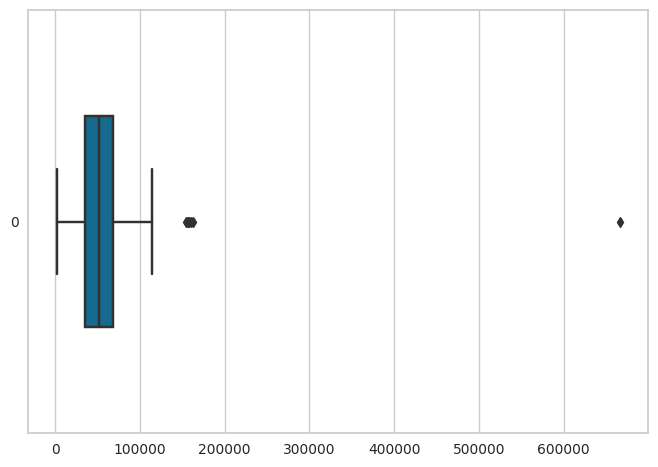

In [ ]:
#checking for outliers in Income column
sn.boxplot(df_cust3['Income'],orient='h',width = 0.5)

In [ ]:
#locating outliers in the income column 
df_cust3[df_cust3['Income']>600000]

,Education,Marital_Status,Income,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq
2233,Grad,Couple,666666.0,62,11,0,1,578,46,10


In [ ]:
#since we have observed that our income column is skewed we will use the interquartile method
#locating iqr 
percentile25 = df_cust3['Income'].quantile(0.25)
percentile75 = df_cust3['Income'].quantile(0.75)

iqr = percentile75 - percentile25


In [ ]:
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr
print(upper_limit,lower_limit)

117416.25 -13587.75


In [ ]:
df_cust3[df_cust3['Income']>upper_limit]
df_cust3[df_cust3['Income']<lower_limit]

,Education,Marital_Status,Income,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq


In [ ]:
#trimming the outliers 
df_cust4 = df_cust3[df_cust3['Income']< upper_limit]
df_cust4.shape

(2232, 10)

In [ ]:
#capping or winsorization method 
df_cust4['Income'] = np.where(df_cust4['Income']>upper_limit,
                      upper_limit,
                      np.where(df_cust4['Income']<lower_limit,
                              lower_limit,
                           df_cust4['Income']))

<Axes: >

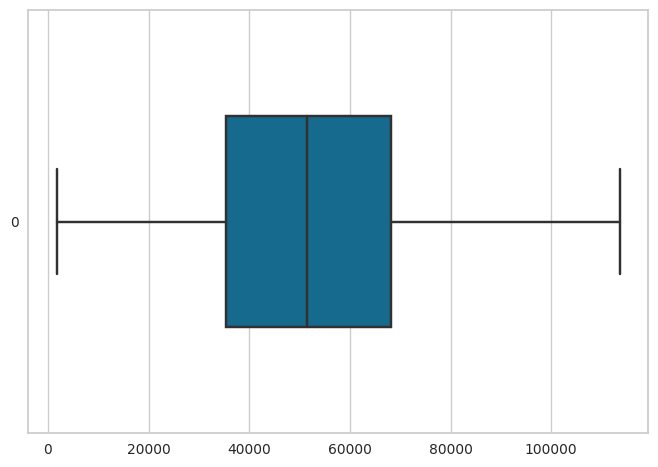

In [ ]:
#checking the Income feature after treating outliers 
sn.boxplot(df_cust4['Income'],orient = 'h', width = 0.5)

In [ ]:
#checking with descriptive statistics with income  feature for binning
df_cust4.Income.describe()

count      2232.000000
mean      51630.926971
std       20601.679542
min        1730.000000
25%       35434.750000
50%       51381.500000
75%       68118.000000
max      113734.000000
Name: Income, dtype: float64

In [ ]:
#binning for Income column 
min_value = df_cust4['Income'].min()
max_value = df_cust4['Income'].max()
income_range = (np.round(max_value - min_value))
bins = 4
bin_width = int(np.round(income_range/bins))


In [ ]:
#printing our values 
print("the max range is ,",max_value)
print("the min range is ,",min_value)
print("the income range is ,",income_range)
print("the bin width is ,",bin_width)

the max range is , 113734.0
the min range is , 1730.0
the income range is , 112004.0
the bin width is , 28001


<Axes: title={'center': 'Before Bining Distribution'}, xlabel='Income', ylabel='Count'>

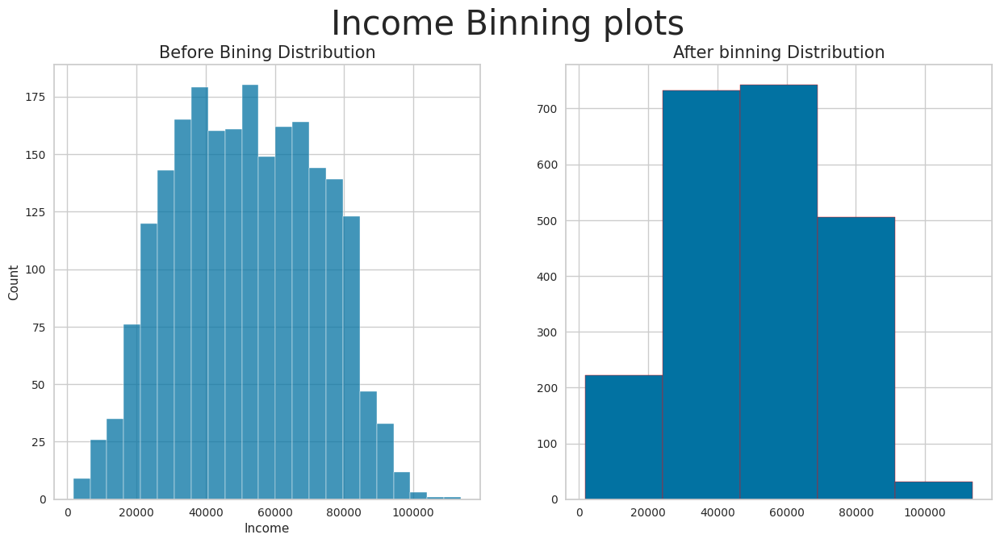

In [ ]:
#plotting for histogram before binning  and afte binning 
values = df_cust4.Income.values
fig,ax = plt.subplots(ncols = 2,figsize = (15,7))
fig.suptitle("Income Binning plots",fontsize = 30)
ax[0].set_title('Before Bining Distribution',fontsize = 15)
ax[1].set_title('After binning Distribution',fontsize = 15)
plt.hist( values,edgecolor="red", bins= 5)
sn.histplot(ax=ax[0],x = 'Income',data=df_cust4)

- Observation
 - Before binnning we observe that we have peaks with irregular intervals of data points.

 - after binning our intervals have been generalised and uneven peaks have been reduced  with a normal distribution 

In [ ]:
#locating the range for binning using numpy library
np.linspace(min_value,max_value,5)

array([  1730.,  29731.,  57732.,  85733., 113734.])

In [ ]:
#creating bins for income columns by choosing bins= 5 according to histogram plots shown above 

df_cust4['Income_Category'] = pd.cut(df_cust4['Income'],bins = [0,29732,57733,85734,113735],labels = ['lower','middle','upper_middle','upper'],right=False,include_lowest=True)
df_cust4.head()

,Education,Marital_Status,Income,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq,Income_Category
0,Grad,Solo,58138.0,1617,25,0,0,849,66,11,upper_middle
1,Grad,Solo,46344.0,27,6,0,2,299,69,9,middle
2,Grad,Couple,71613.0,776,21,0,0,498,58,10,upper_middle
3,Grad,Couple,26646.0,53,8,0,1,325,39,9,lower
4,PostGrad,Couple,58293.0,422,19,0,1,347,42,9,upper_middle


In [ ]:
df_cust4.Income_Category.value_counts()

middle          966
upper_middle    824
lower           363
upper            79
Name: Income_Category, dtype: int64

In [ ]:
#dropping our income feature as we have created bins 
df_cust4.drop(['Income'],axis=1,inplace=True)

In [ ]:
df_cust4.head()

,Education,Marital_Status,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq,Income_Category
0,Grad,Solo,1617,25,0,0,849,66,11,upper_middle
1,Grad,Solo,27,6,0,2,299,69,9,middle
2,Grad,Couple,776,21,0,0,498,58,10,upper_middle
3,Grad,Couple,53,8,0,1,325,39,9,lower
4,PostGrad,Couple,422,19,0,1,347,42,9,upper_middle


<Axes: >

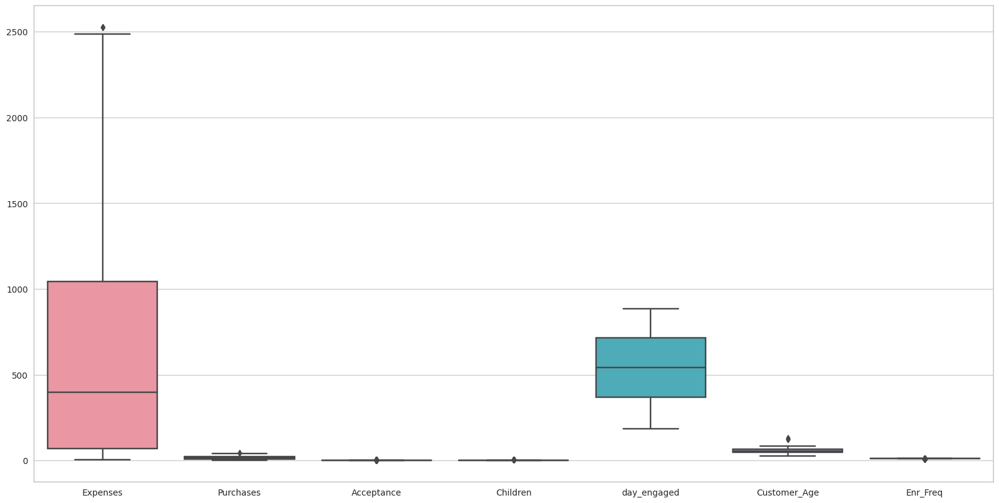

In [ ]:
#checking with outliers in our total dataframe
plt.figure(figsize=(20,10))
sn.boxplot(data=df_cust4)

<Axes: title={'center': 'Customer Age'}>

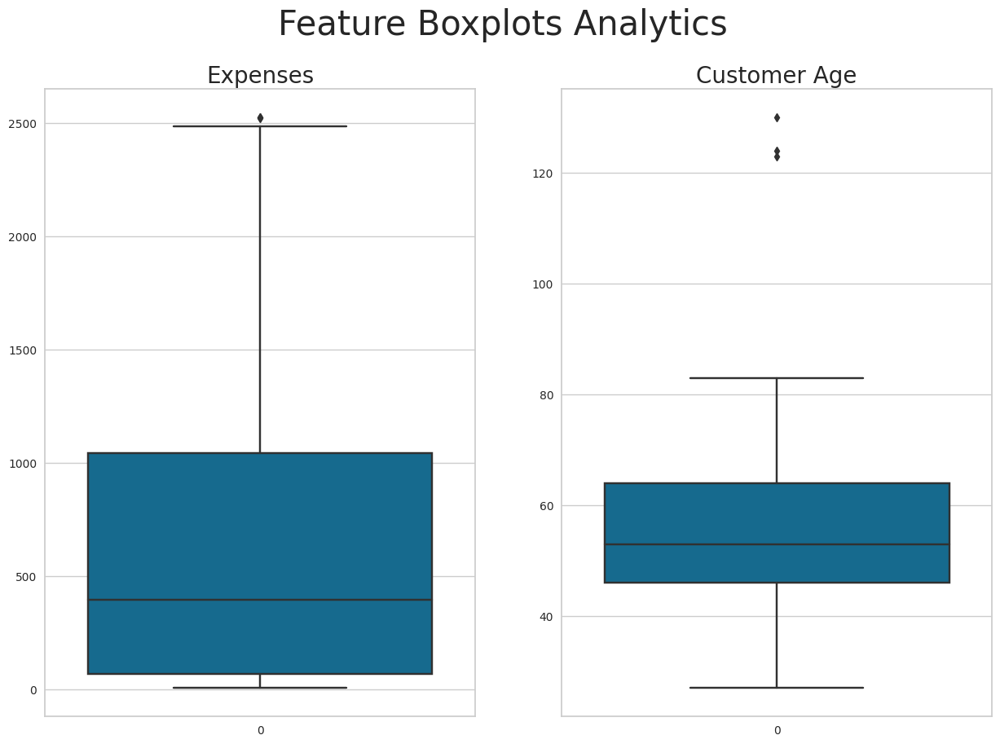

In [ ]:
#subplots to check the distance of outliers for Expenses and customer Age 
fig,ax = plt.subplots(1,2,figsize = (15,10))
fig.suptitle("Feature Boxplots Analytics",fontsize = 30)
ax[0].set_title('Expenses',fontsize = 20)
ax[1].set_title('Customer Age',fontsize = 20)
sn.boxplot(ax=ax[0],data=df_cust4['Expenses'])
sn.boxplot(ax=ax[1],data=df_cust4['Customer_Age'])

- In the expenses plot we observe that we have very minimal distance of outliers, hence we leave it without treating 

- In the Customer Age plot we observe that we have outliers with extreme values of distance hence we choose the Customer Age to treat the outliers

Outlier Analysis with Customer Age Feature 

<Axes: >

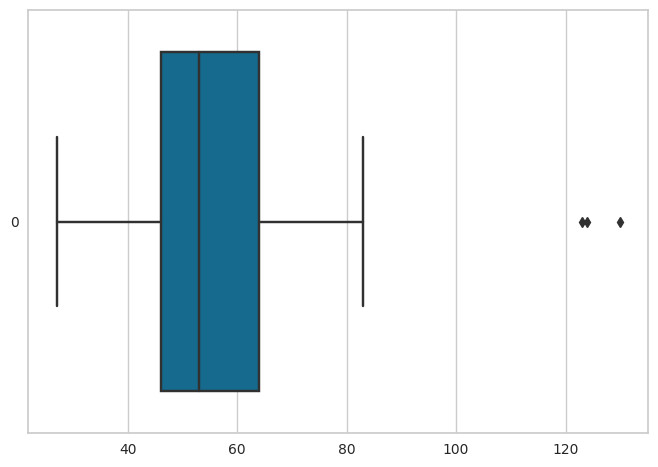

In [ ]:
#checking with boxenplot for the customer Age feature 
sn.boxplot(df_cust4['Customer_Age'],orient = 'h',)

In [ ]:
#checking with outliers with age feature 
df_cust4[df_cust4['Customer_Age']>100]

,Education,Marital_Status,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq,Income_Category
192,PostGrad,Solo,65,6,0,1,462,123,10,middle
239,PostGrad,Solo,22,4,0,1,229,130,9,upper_middle
339,PostGrad,Couple,1853,15,1,0,462,124,10,upper_middle


In [ ]:
#since we have observed that our Customer Age column is skewed we will use the interquartile method
#locating iqr 
percentile25 = df_cust4['Customer_Age'].quantile(0.25)
percentile75 = df_cust4['Customer_Age'].quantile(0.75)

iqr = percentile75 - percentile25
print(iqr)


18.0


In [ ]:
#locating our upper and lower limit 
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr
print(upper_limit,lower_limit)

91.0 19.0


In [ ]:
#locating the outliers 
df_cust4[df_cust4['Customer_Age']>upper_limit]
df_cust4[df_cust4['Customer_Age']<lower_limit]

,Education,Marital_Status,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq,Income_Category


In [ ]:
#trimming the outliers 
df_cust5 = df_cust4[df_cust4['Customer_Age']< upper_limit]
df_cust5.shape

(2229, 10)

In [ ]:
#capping or winsorization method 
df_cust5['Customer_Age'] = np.where(df_cust5['Customer_Age']>upper_limit,
                      upper_limit,
                      np.where(df_cust5['Customer_Age']<lower_limit,
                              lower_limit,
                           df_cust5['Customer_Age']))

<Axes: >

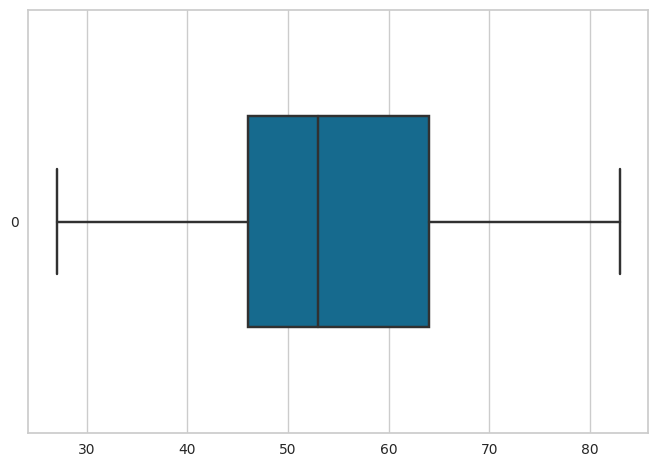

In [ ]:
#checking the Customer Age after treating outliers 
sn.boxplot(df_cust5['Customer_Age'],orient = 'h', width = 0.5)

In [ ]:
#checking with descriptive statistics with Customer Age 
df_cust5.Customer_Age.describe()

count    2229.000000
mean       54.111261
std        11.707430
min        27.000000
25%        46.000000
50%        53.000000
75%        64.000000
max        83.000000
Name: Customer_Age, dtype: float64

In [ ]:
df_cust5.head()

,Education,Marital_Status,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq,Income_Category
0,Grad,Solo,1617,25,0,0,849,66.0,11,upper_middle
1,Grad,Solo,27,6,0,2,299,69.0,9,middle
2,Grad,Couple,776,21,0,0,498,58.0,10,upper_middle
3,Grad,Couple,53,8,0,1,325,39.0,9,lower
4,PostGrad,Couple,422,19,0,1,347,42.0,9,upper_middle


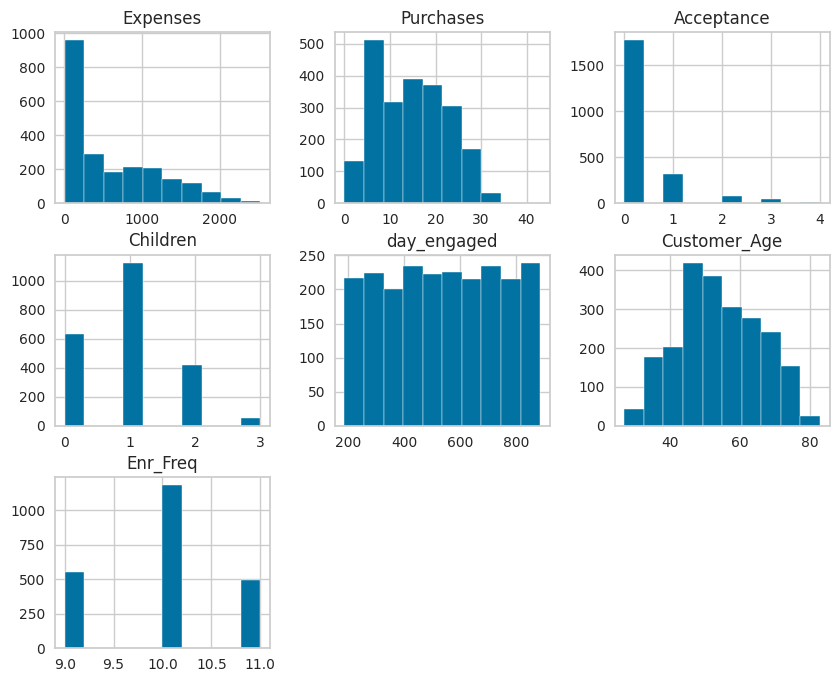

In [ ]:
#checking with histogram with our final dataset 
df_cust5.hist(figsize = (10,8))
plt.show()

In [ ]:
#checking with Dtypes 
df_cust5.dtypes

Education            object
Marital_Status       object
Expenses              int64
Purchases             int64
Acceptance            int64
Children              int64
day_engaged           int64
Customer_Age        float64
Enr_Freq              int64
Income_Category    category
dtype: object

- Combining Marital and Children To Family Feature 

In [ ]:
#checking with marital status and children 
print(df_cust5.Marital_Status.value_counts())
print(df_cust5.Children.value_counts())

Couple    1436
Solo       793
Name: Marital_Status, dtype: int64
1    1123
0     633
2     420
3      53
Name: Children, dtype: int64


In [ ]:
# Mapping Marital status for combination with children to create a new feature Family 
df_cust5.Marital_Status = df_cust5.Marital_Status.map({'Solo':1,'Couple':2})

In [ ]:
df_cust5.head()

,Education,Marital_Status,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq,Income_Category
0,Grad,1,1617,25,0,0,849,66.0,11,upper_middle
1,Grad,1,27,6,0,2,299,69.0,9,middle
2,Grad,2,776,21,0,0,498,58.0,10,upper_middle
3,Grad,2,53,8,0,1,325,39.0,9,lower
4,PostGrad,2,422,19,0,1,347,42.0,9,upper_middle


In [ ]:
#adding our Marital feature and children feature to create one feature family
df_cust5['Family'] = df_cust5['Marital_Status']+ df_cust5['Children']

In [ ]:
df_cust5.head()

,Education,Marital_Status,Expenses,Purchases,Acceptance,Children,day_engaged,Customer_Age,Enr_Freq,Income_Category,Family
0,Grad,1,1617,25,0,0,849,66.0,11,upper_middle,1
1,Grad,1,27,6,0,2,299,69.0,9,middle,3
2,Grad,2,776,21,0,0,498,58.0,10,upper_middle,2
3,Grad,2,53,8,0,1,325,39.0,9,lower,3
4,PostGrad,2,422,19,0,1,347,42.0,9,upper_middle,3


In [ ]:
#dropping our Marital Status and Children feature 
df_cust5.drop(['Marital_Status','Children'],axis=1,inplace = True)

In [ ]:
df_cust5.head()

,Education,Expenses,Purchases,Acceptance,day_engaged,Customer_Age,Enr_Freq,Income_Category,Family
0,Grad,1617,25,0,849,66.0,11,upper_middle,1
1,Grad,27,6,0,299,69.0,9,middle,3
2,Grad,776,21,0,498,58.0,10,upper_middle,2
3,Grad,53,8,0,325,39.0,9,lower,3
4,PostGrad,422,19,0,347,42.0,9,upper_middle,3


In [ ]:
print(df_cust5.Family.value_counts())

3    886
2    758
4    300
1    253
5     32
Name: Family, dtype: int64


# Bivariate Analysis

<Axes: title={'center': 'Family Expenses Distribution'}, xlabel='Family', ylabel='Expenses'>

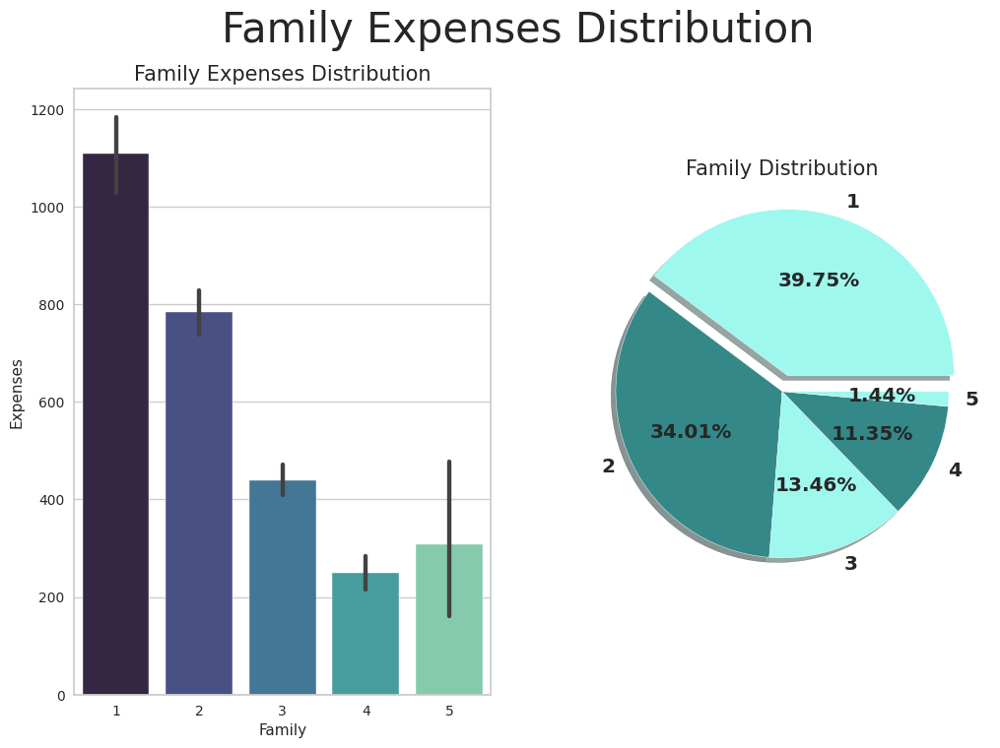

In [ ]:
#plotting with Family Distribution and their expenses 
fig,ax = plt.subplots(1,2,figsize = (12,8))
fig.suptitle("Family Expenses Distribution",fontsize = 30)
ax[0].set_title('Family Expenses Distribution',fontsize = 15)
ax[1].set_title('Family Distribution',fontsize = 15)
plt.pie(df_cust5.Family.value_counts(),
      labels=['1','2','3','4','5'], autopct= '%.2f%%',shadow=True,
      colors = ['#9EF8EE','#348888'],explode= [0.1,0.0,0.0,0.0,0.0],
      textprops={'size':'large',
                 'fontweight':'bold'})
sn.barplot(ax=ax[0],data = df_cust5,x='Family',y = 'Expenses',palette="mako",)


- Observations

- We observe people who are single comprise around 39.75% and have the    highest expenses compared to others 

- Family of 4 or 5 have very less  expenses compared to singles and they comprise of 11.35% and 1.44% respectively 

- Family of 2 and 3 have moderate expenses and spend very judiciously compared to other categories,they comprise 34.01% and 13.46% respectively

In [ ]:
df_cust5.head()

,Education,Expenses,Purchases,Acceptance,day_engaged,Customer_Age,Enr_Freq,Income_Category,Family
0,Grad,1617,25,0,849,66.0,11,upper_middle,1
1,Grad,27,6,0,299,69.0,9,middle,3
2,Grad,776,21,0,498,58.0,10,upper_middle,2
3,Grad,53,8,0,325,39.0,9,lower,3
4,PostGrad,422,19,0,347,42.0,9,upper_middle,3


<Axes: title={'center': 'Bar Distribution'}, xlabel='Education', ylabel='Expenses'>

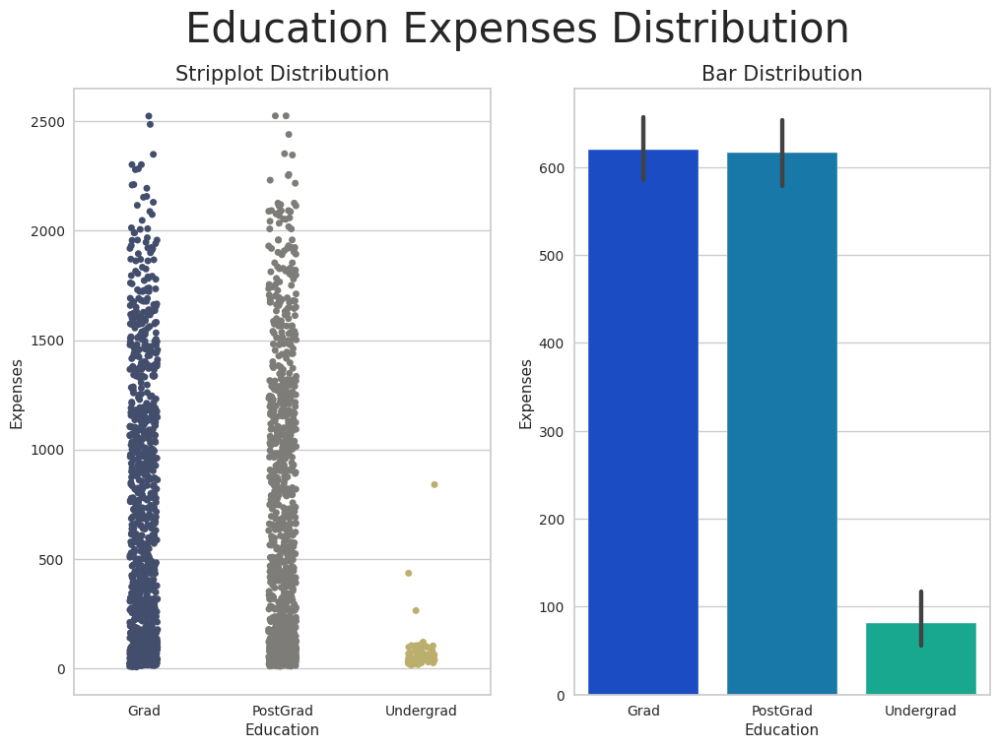

In [ ]:
#plotting Education with Expenses 
fig,ax = plt.subplots(1,2,figsize =(12,8))
fig.suptitle("Education Expenses Distribution",fontsize = 30)
ax[0].set_title('Stripplot Distribution',fontsize = 15)
ax[1].set_title('Bar Distribution',fontsize = 15)
sn.stripplot(ax=ax[0],data= df_cust5,x = 'Education',y = 'Expenses',palette='cividis',jitter=True)
sn.barplot(ax = ax [1],data = df_cust5,x = 'Education',y = 'Expenses',palette='winter')


- Observations

- We clearly observe that people  with Post graduation and graduation degree have higher expenses compared to people with under graduation and also we observe that the majority with post graduation and graduation are greater in number compared to undergrads

In [ ]:
df_cust5.head()

,Education,Expenses,Purchases,Acceptance,day_engaged,Customer_Age,Enr_Freq,Income_Category,Family
0,Grad,1617,25,0,849,66.0,11,upper_middle,1
1,Grad,27,6,0,299,69.0,9,middle,3
2,Grad,776,21,0,498,58.0,10,upper_middle,2
3,Grad,53,8,0,325,39.0,9,lower,3
4,PostGrad,422,19,0,347,42.0,9,upper_middle,3


Text(0.5, 1.0, 'Purchases - Expenses Lineplot with Family Size')

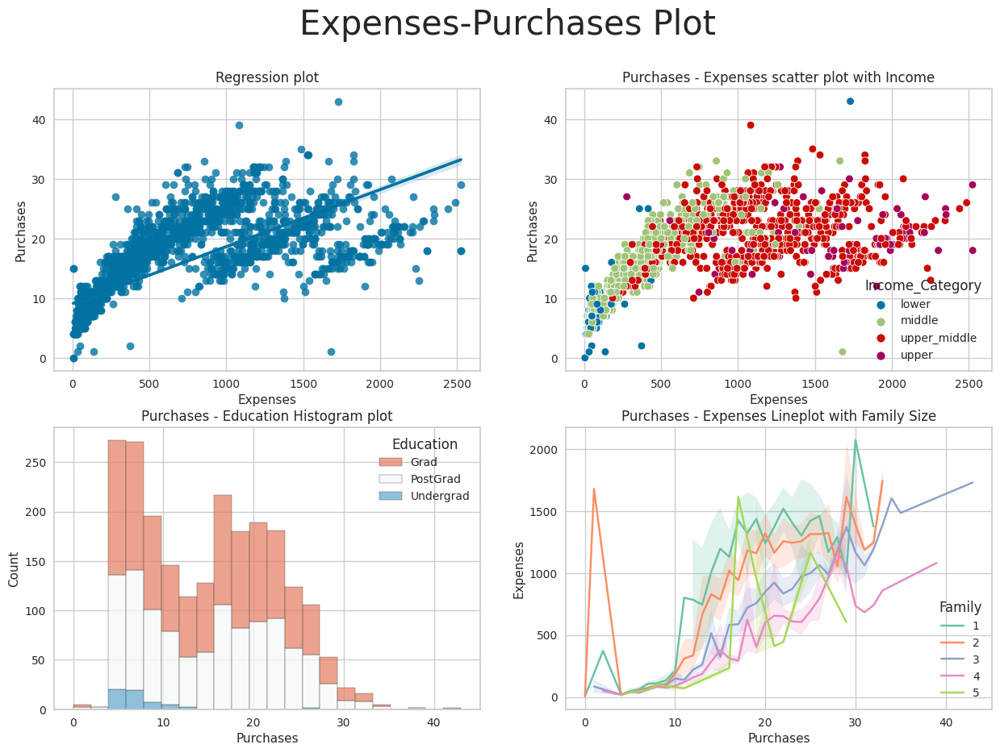

In [ ]:
#plotting with Expenses and purchases 
fig,ax = plt.subplots(nrows=2,ncols=2,figsize = (15,10))
fig.suptitle("Expenses-Purchases Plot",fontsize = 30)
sn.regplot(ax=ax[0,0],x='Expenses',y = 'Purchases',data=df_cust5)
sn.scatterplot(ax=ax[0,1],x='Expenses',y = 'Purchases',data=df_cust5,hue = 'Income_Category')
sn.histplot(ax=ax[1,0],x='Purchases',hue ='Education',multiple="stack",palette="RdBu",
            edgecolor = ".3",data=df_cust5)
sn.lineplot(ax =ax[1,1],x='Purchases',y ='Expenses',data = df_cust5,hue = 'Family'
            ,palette = "Set2")
ax[0,0].set_title("Regression plot")
ax[0,1].set_title("Purchases - Expenses scatter plot with Income")
ax[1,0].set_title("Purchases - Education Histogram plot")
ax[1,1].set_title("Purchases - Expenses Lineplot with Family Size")

- Observations 

- In the Regression Plot we are plotting to observe the linear relationship of purchases with expenses and we observed that increase in expenditure results increase in purchases 

- In the scatter plot we are relating to hue as Income Category , we observe 
that the majority of customer segments are comprised by middle and upper middle class with highest rate of purchases and expenditures, when compared to upper and lower income class

- In the histogram plot we observe that people with higher education have higher purchases compared to basic education.

-  In the Lineplot people with family have higher expenditures and purchases compared to people who are single, this  also indicates that the average purchases is an upward trend and for future we can see average rate of expenditures and purchases rising for families compared to bachelors

- in the lineplot we also observe that there is a sudden spike with family that comprise atleast 2 who have purchases interval between 0 - 5 products atleast.



 - Binning for Customer Age Feature

In [ ]:
#since Our target is to find customer segments that  are likely to buy the product dividing our Customer Age into Segments by binning 
#binning for Income column 
min_value = df_cust5['Customer_Age'].min()
max_value = df_cust5['Customer_Age'].max()
age_range = (np.round(max_value - min_value))
bins = 4
bin_width = int(np.round(age_range/bins))


In [ ]:

#printing our values 
print("the max range is ,",max_value)
print("the min range is ,",min_value)
print("the age range is ,",age_range)
print("the bin width is ,",bin_width)


the max range is , 83.0
the min range is , 27.0
the age range is , 56.0
the bin width is , 14


<Axes: title={'center': 'Before Bining Distribution'}, xlabel='Customer_Age', ylabel='Count'>

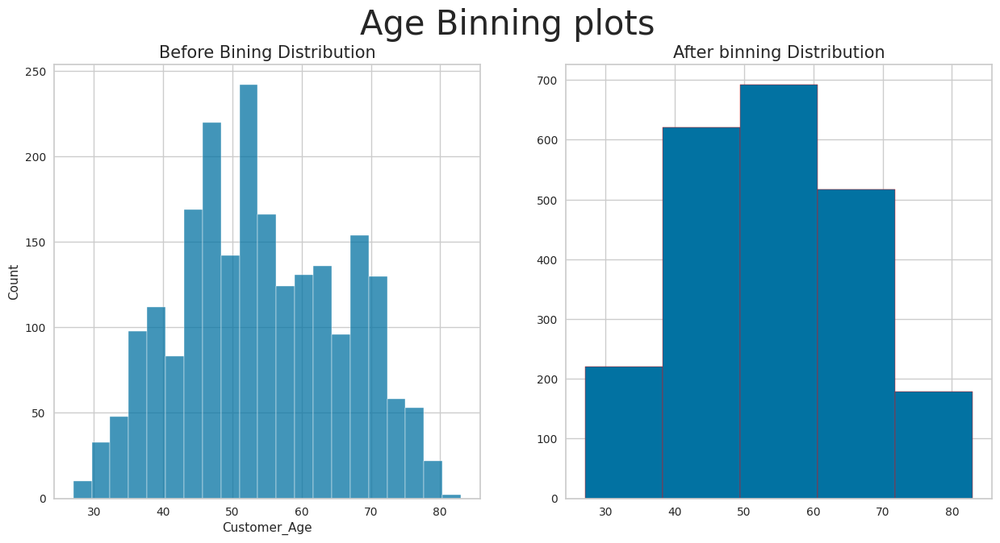

In [ ]:
#plotting for histogram before binning  and afte binning 
values = df_cust5.Customer_Age.values
fig,ax = plt.subplots(ncols = 2,figsize = (15,7))
fig.suptitle("Age Binning plots",fontsize = 30)
ax[0].set_title('Before Bining Distribution',fontsize = 15)
ax[1].set_title('After binning Distribution',fontsize = 15)
plt.hist( values,edgecolor="red", bins= 5)
sn.histplot(ax=ax[0],x = 'Customer_Age',data=df_cust5)

- Observation
 - Before binnning we observe that we have peaks with irregular intervals of data points.

 - after binning our intervals have been generalised and even peaks have been reduced  with a normal distribution 

In [ ]:
 #locating the range for binning using numpy library
np.linspace(min_value,max_value,5)

array([27., 41., 55., 69., 83.])

## dividing Age  in 4 catogories as customer segment

* The Silent Generation: Born 1928-1945 (78-84 years old)
* Boomers: Born 1946-1964 (59-70 years old)
* Gen X: Born 1965-1980 (43-56 years old)
* Millennials: Born 1981-1996 (27-42 years old)

In [ ]:
#creating bins for Age columns 

df_cust5['Customer_Segment'] = pd.cut(df_cust5['Customer_Age'],bins = [26,42,56,70,84],labels = ['Millennial','Gen X','Boomer','Silent'],right=False,include_lowest=True)
df_cust5.head()

,Education,Expenses,Purchases,Acceptance,day_engaged,Customer_Age,Enr_Freq,Income_Category,Family,Customer_Segment
0,Grad,1617,25,0,849,66.0,11,upper_middle,1,Boomer
1,Grad,27,6,0,299,69.0,9,middle,3,Boomer
2,Grad,776,21,0,498,58.0,10,upper_middle,2,Boomer
3,Grad,53,8,0,325,39.0,9,lower,3,Millennial
4,PostGrad,422,19,0,347,42.0,9,upper_middle,3,Gen X


In [ ]:
#dropping the Customer Age feature as we have got age type
df_cust5.drop(['Customer_Age'],axis = 1,inplace = True)

In [ ]:
df_cust5.head()

,Education,Expenses,Purchases,Acceptance,day_engaged,Enr_Freq,Income_Category,Family,Customer_Segment
0,Grad,1617,25,0,849,11,upper_middle,1,Boomer
1,Grad,27,6,0,299,9,middle,3,Boomer
2,Grad,776,21,0,498,10,upper_middle,2,Boomer
3,Grad,53,8,0,325,9,lower,3,Millennial
4,PostGrad,422,19,0,347,9,upper_middle,3,Gen X


In [ ]:
#checking with the counts of our feature customer segment 
df_cust5.Customer_Segment.value_counts()

Gen X         934
Boomer        685
Millennial    345
Silent        265
Name: Customer_Segment, dtype: int64

([<matplotlib.patches.Wedge at 0x7f9cbd3d17c0>,
 [Text(0.30199761282596826, 1.1613773899329265, 'Gen X'),
  Text(-0.9872874378174519, -0.48503970469215324, 'Boomer'),
  Text(0.3642998784352085, -1.037923695929567, 'Millennial'),
  Text(1.0241633191156239, -0.4013595592209922, 'Silent')],
 [Text(0.1761652741484815, 0.6774701441275405, '41.90%'),
  Text(-0.538520420627701, -0.26456711165026536, '30.73%'),
  Text(0.1987090246010228, -0.5661401977797638, '15.48%'),
  Text(0.558634537699431, -0.21892339593872298, '11.89%')])

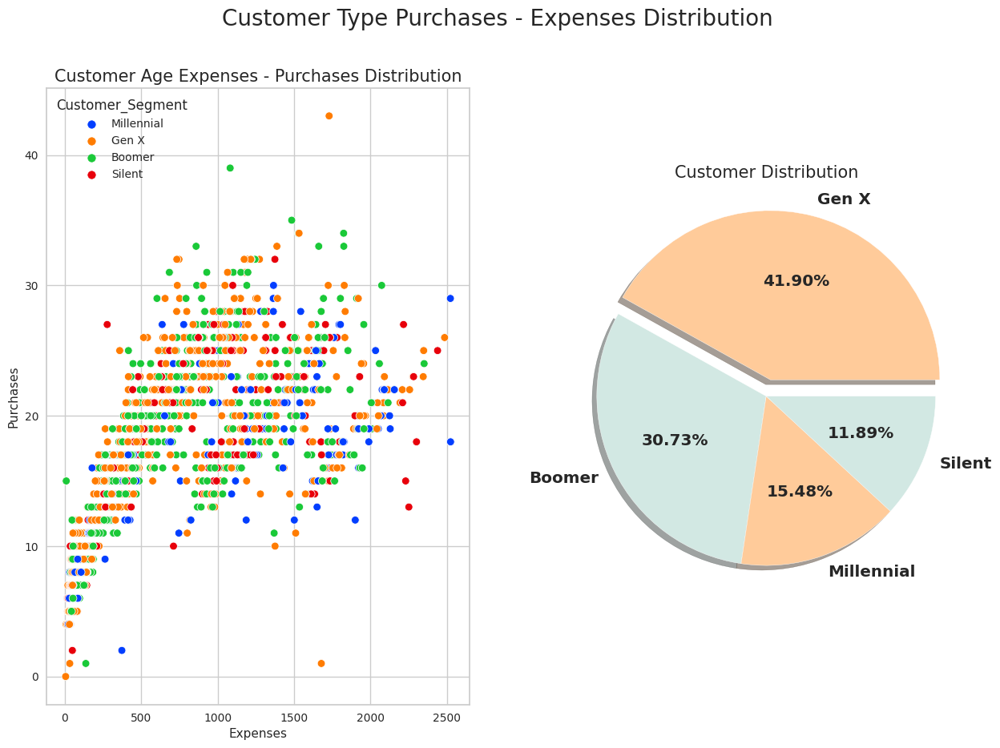

In [ ]:
#plotting with Age Distribution With Expenses and purchases 
fig,ax = plt.subplots(1,2,figsize = (15,10))
fig.suptitle("Customer Type Purchases - Expenses Distribution",fontsize = 20)
ax[0].set_title('Customer Age Expenses - Purchases Distribution',fontsize = 15)
ax[1].set_title('Customer Distribution',fontsize = 15)
sn.scatterplot(ax=ax[0],data = df_cust5,x='Expenses',y = 'Purchases', hue ='Customer_Segment',markers = True,
               palette="bright")
plt.pie(df_cust5.Customer_Segment.value_counts(),
      labels=['Gen X','Boomer','Millennial','Silent'], autopct= '%.2f%%',shadow=True,
      colors = ['#FFCB9A','#D2E8E3'],explode= [0.1,0.0,0.0,0.0],
      textprops={'size':'large',
                 'fontweight':'bold'})



- Observations 

- In the customer segments scatterplot we observe that majority of expenses and purchases are done by GenX and Boomers, that is customer in the range of 42 - 56 yrs and 56 - 70yrs, when compared to customers who are in millenials and Silent  .

- In the pie chart we can relate to the scatterplot that Gen X and Boomer have higher expenses and purchases as they are in higher percentage when compared to millenials and silent customers with least percentage distribution

In [ ]:
df_cust5.Acceptance.value_counts()

0    1767
1     324
2      83
3      44
4      11
Name: Acceptance, dtype: int64

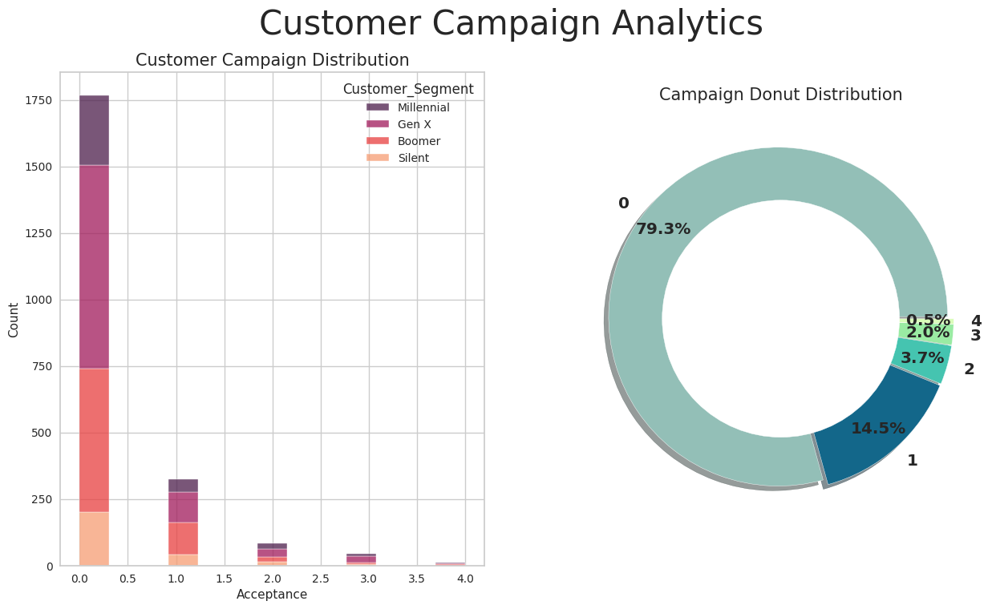

<Figure size 800x550 with 0 Axes>

In [ ]:
#checking with customers who have accepted campaign programs 
fig,ax = plt.subplots(1,2,figsize =(15,8))
fig.suptitle("Customer Campaign Analytics",fontsize = 30)
ax[0].set_title('Customer Campaign Distribution',fontsize = 15)
ax[1].set_title('Campaign Donut Distribution',fontsize = 15)
sn.histplot(ax=ax[0],data= df_cust5,x = 'Acceptance',hue='Customer_Segment',multiple = 'stack',
            palette = 'rocket')
labels = '0','1','2','3','4'
colors =['#93BFB7', '#13678A', '#45C4B0', 
          '#9AEBA3', '#DAFDBA']
explode = (0.02, 0.02, 0.02, 0.02, 0.02)        
plt.pie(df_cust5.Acceptance.value_counts(),autopct='%1.1f%%', pctdistance=0.85,
       labels=labels,colors = colors,explode = explode,shadow = True,
          textprops={'size':'large',
                 'fontweight':'bold'})               
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
plot = plt.gcf()  
# Adding Circle in Pie chart
plot.gca().add_artist(centre_circle)
  
# Displaying Chart
plt.show()
plt.tight_layout()

- Observations 
- In the campaign Analytics, we observe that 79 percent of have accepted the  offer in the first campaign, that includes majority of Gen X and Boomers compared to while the millenials and silent are in minority 

- In the second campaign we observe that only 14.5 percent have accepted the offer and in majority are Gen X and Boomers compared to silent and millennials 

- In the third campaign the percentage is around 3.5 percent comparatively to the first two campaigns, offer accepted is lesser and almost all the age groups share the same distribution 

- In the fourth campaign the percentage is around 2.0 percent, we observe that the people are not interested in the offers of any age group, even distribution of acceptance to offers is lower than other campaigns 

- In the fifth campaign the percentage of customers accepted offer is just 0.5 percent,this also tells us that people might be interested in better    offers and this could attract customers of all age groups 

In [ ]:
df_cust5.head()

,Education,Expenses,Purchases,Acceptance,day_engaged,Enr_Freq,Income_Category,Family,Customer_Segment
0,Grad,1617,25,0,849,11,upper_middle,1,Boomer
1,Grad,27,6,0,299,9,middle,3,Boomer
2,Grad,776,21,0,498,10,upper_middle,2,Boomer
3,Grad,53,8,0,325,9,lower,3,Millennial
4,PostGrad,422,19,0,347,9,upper_middle,3,Gen X


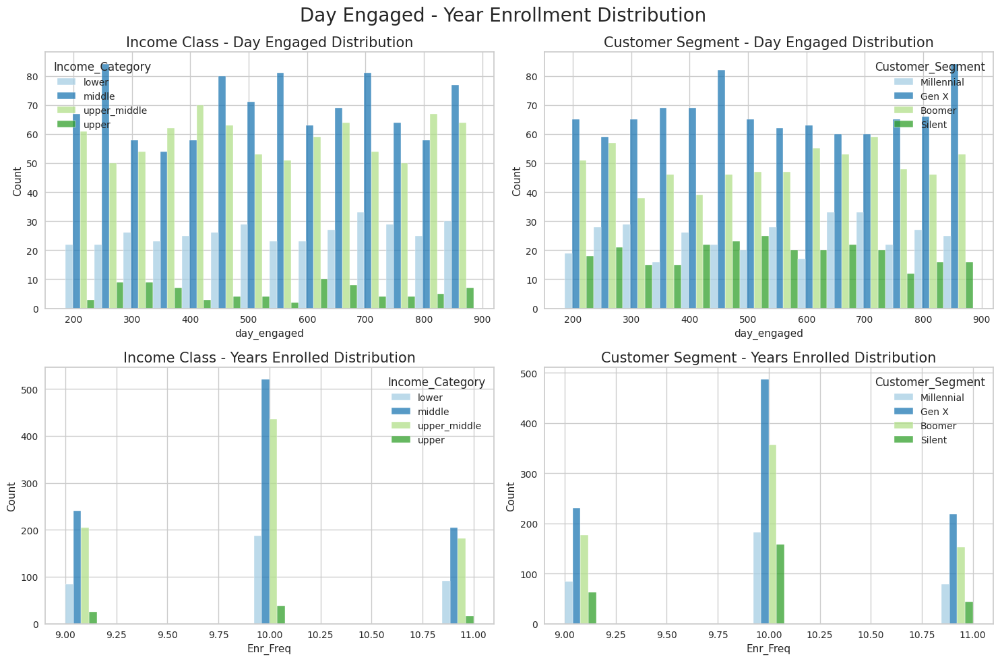

In [ ]:
#plotting Income segment and Age segment with day and  year engagement with the company 
fig,ax = plt.subplots(nrows = 2,ncols = 2,figsize = (15,10))
fig.suptitle(" Day Engaged - Year Enrollment Distribution",fontsize = 20)
ax[0,0].set_title('Income Class - Day Engaged Distribution',fontsize = 15)
ax[0,1].set_title('Customer Segment - Day Engaged Distribution',fontsize = 15)
ax[1,0].set_title('Income Class - Years Enrolled Distribution',fontsize = 15)
ax[1,1].set_title('Customer Segment - Years Enrolled Distribution',fontsize = 15)
sn.histplot(ax=ax[0,0],data = df_cust5,x ='day_engaged', hue ='Income_Category',
               palette="Paired",multiple = 'dodge')
sn.histplot(ax=ax[0,1],data = df_cust5,x ='day_engaged', hue ='Customer_Segment',
               palette="Paired",multiple = 'dodge')
sn.histplot(ax=ax[1,0],data = df_cust5,x ='Enr_Freq', hue ='Income_Category',
               palette="Paired",multiple = 'dodge')
sn.histplot(ax=ax[1,1],data = df_cust5,x ='Enr_Freq', hue ='Customer_Segment',
               palette="Paired",multiple = 'dodge')
plt.tight_layout()




- Observations 

-  the first plot shows us that according to income categories for how many days the customers have been enrolled, and we observe that, customers from middle class and upper middle class have been enrolled for quite a long time and are in majority, followed by other classes with least enrolment from upper class 

- the second plot shows us that according to customer type for how any days the customers have enrolled and we observe that,customers of age group GenX and Boomers have been with the company and are in majority followed by other classes with least from upper class.

- the third plot shows us according income classes for how many years customers have enrolled with the company, and we observe that, customers enrolled from 9 years are from middle and upper middle class and respectively same with customers enrolled from 10 and 11 years,we also observe that the frequency of customers from lower and upper class is least.

- the fourth plot shows us according customer segment classes for how many years customers have enrolled with the company, and we observe that, customers enrolled from are from age groups GenX and Boomer with high frequency of customers comparatively to other age groups with customers from silent age group being least 

- these plots also gives us information that most of our customers are from middle and upper middle class within age groups GenX to Boomers,as they share highest frequency comparatively to other classes in Income or Age groups 

In [ ]:
 #checking with value counts with income category and family 
 df_cust5.groupby('Income_Category')['Family'].sum().sort_values(ascending = False)

Income_Category
middle          2823
upper_middle    1874
lower            954
upper            136
Name: Family, dtype: int64

In [ ]:
df_cust5.groupby('Customer_Segment')['Family'].sum().sort_values(ascending = False)

Customer_Segment
Gen X         2556
Boomer        1832
Millennial     742
Silent         657
Name: Family, dtype: int64

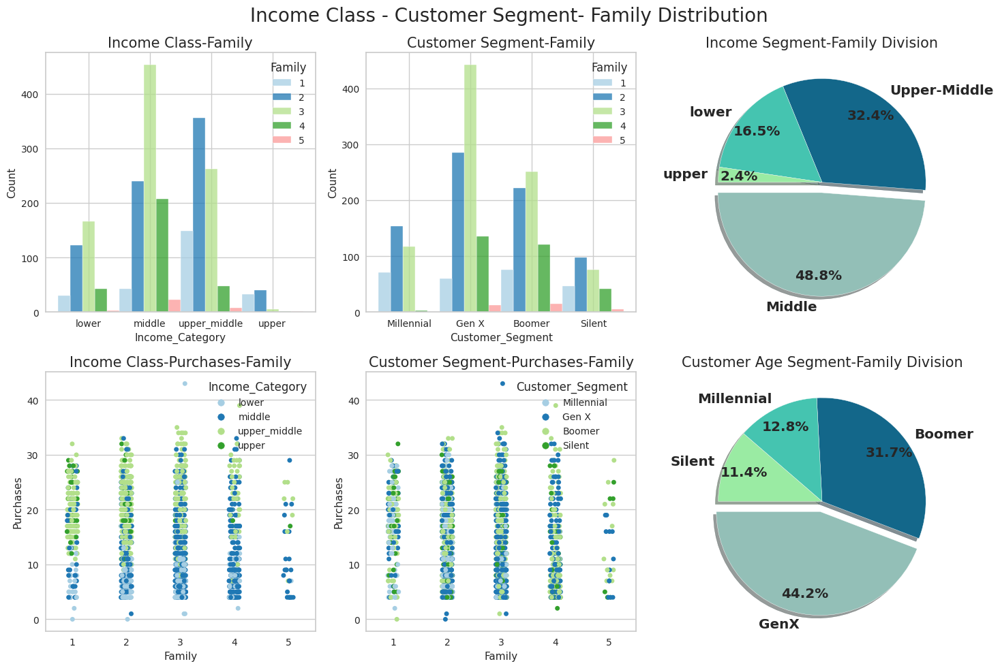

In [ ]:
#plotting with Income category and Customer Segment With Family 
fig,ax = plt.subplots(nrows = 2,ncols = 3,figsize = (15,10))
fig.suptitle(" Income Class - Customer Segment- Family Distribution",fontsize = 20)
ax[0,0].set_title('Income Class-Family',fontsize = 15)
ax[0,1].set_title('Customer Segment-Family',fontsize = 15)
ax[1,0].set_title('Income Class-Purchases-Family',fontsize = 15)
ax[1,1].set_title('Customer Segment-Purchases-Family',fontsize = 15)
ax[0,2].set_title('Income Segment-Family Division',fontsize = 15)
ax[1,2].set_title('Customer Age Segment-Family Division',fontsize = 15)
sn.histplot(ax=ax[0,0],data = df_cust5,x ='Income_Category', hue ='Family',
               palette="Paired",multiple = 'dodge')
sn.histplot(ax=ax[0,1],data = df_cust5,x ='Customer_Segment', hue ='Family',
               palette="Paired",multiple = 'dodge')
sn.stripplot(ax=ax[1,0],data = df_cust5,x ='Family',y = 'Purchases', hue ='Income_Category',
               palette="Paired")
sn.stripplot(ax=ax[1,1],data = df_cust5,x ='Family',y = 'Purchases', hue ='Customer_Segment',
               palette="Paired",)
colors =['#93BFB7', '#13678A', '#45C4B0', 
          '#9AEBA3']
explode = (0.1, 0.00, 0.00, 0.00,)

labels = 'Middle','Upper-Middle','lower','upper' #adding labels 

grp_family = df_cust5.groupby('Income_Category')['Family'].sum().sort_values(ascending = False) #grouping by income category and family 
ax[0,2].pie(grp_family,colors = colors,explode = explode,
            autopct='%1.1f%%', textprops={'size':'large',
                 'fontweight':'bold'},shadow = True,labels = labels,startangle = 180,
            pctdistance = 0.80)
labels2 = 'GenX','Boomer','Millennial','Silent'
grp_segment = df_cust5.groupby('Customer_Segment')['Family'].sum().sort_values(ascending = False) #grouping by customer Age segment and family
ax[1,2].pie(grp_segment,colors = colors,explode = explode,
            autopct='%1.1f%%', textprops={'size':'large',
                 'fontweight':'bold'},shadow = True,labels = labels2,startangle = 180,
            pctdistance = 0.80) # plotting a pie chart 
plt.tight_layout()


- Observations

-  In the first plot we observe that most of the our customers have family members of 2 or 3 and most of them are from Middle and upper middle class followed by lower and upper class 

- In the second plot we observe that most of our customer having family members  of 2 or 3 are from age range from 42-56 years followed by 56-70 years and,with least interaction with silent generation that is 70-85 years.

- the third plot shows us income division among families and their class and we observe that most  of the families come from middle and upper middle class followed by lower class and with least percentage of upper class

-  the fourth plot shows us that most of the purchases are made by middle and upper middle class with least purchases  by upper class. we also observe that family with 5 members engage the least when compared to purchases.

- In the fifth plot we observe that most of the purchases are made by age categories Millennials , GenX and Boomers,with least rate of purchase by silent age categories, we also observe that regardless of age types family members with 5 have least rate of purchase 

- In the sixth plot we observe that that most of the members of family are from age categories GenX followed by Boomers , Millennials and with least percentage silent members in the family.

- We also observe that 80 percent of our customers are from Lower , Middle and upper Middle class with age ranging from Millennials to baby Boomers, customers from upper class and silent age groups have least purchase rate and come in the 20 percent.

# MultiVariate Analysis 

In [ ]:
df_cust5.head()

,Education,Expenses,Purchases,Acceptance,day_engaged,Enr_Freq,Income_Category,Family,Customer_Segment
0,Grad,1617,25,0,849,11,upper_middle,1,Boomer
1,Grad,27,6,0,299,9,middle,3,Boomer
2,Grad,776,21,0,498,10,upper_middle,2,Boomer
3,Grad,53,8,0,325,9,lower,3,Millennial
4,PostGrad,422,19,0,347,9,upper_middle,3,Gen X


In [ ]:
#checking with the shape of our dataset 
df_cust5.shape

(2229, 9)

In [ ]:
#resetting our dataframe
df_cust5.reset_index(inplace = True)

In [ ]:
#dropping our duplicate index row
df_cust5.drop(['index'],axis = 1)

,Education,Expenses,Purchases,Acceptance,day_engaged,Enr_Freq,Income_Category,Family,Customer_Segment
0,Grad,1617,25,0,849,11,upper_middle,1,Boomer
1,Grad,27,6,0,299,9,middle,3,Boomer
2,Grad,776,21,0,498,10,upper_middle,2,Boomer
3,Grad,53,8,0,325,9,lower,3,Millennial
4,PostGrad,422,19,0,347,9,upper_middle,3,Gen X
...,...,...,...,...,...,...,...,...,...
2224,Grad,1341,18,0,567,10,upper_middle,3,Boomer
2225,PostGrad,444,22,1,205,9,upper_middle,5,Silent
2226,Grad,1241,19,1,341,9,middle,1,Gen X
2227,PostGrad,843,23,0,342,9,upper_middle,3,Boomer


In [ ]:
#checking with correlation with varaibles 
df_cust5.corr(method = 'pearson')

,index,Expenses,Purchases,Acceptance,day_engaged,Enr_Freq,Family
index,1.000000,0.005608,0.008800,0.021287,-0.005506,-0.021522,0.011678
Expenses,0.005608,1.000000,0.753420,0.460748,0.158163,0.143727,-0.424953
Purchases,0.008800,0.753420,1.000000,0.259529,0.206677,0.180447,-0.202651
Acceptance,0.021287,0.460748,0.259529,1.000000,-0.011566,-0.021958,-0.203125
day_engaged,-0.005506,0.158163,0.206677,-0.011566,1.000000,0.910254,-0.025709
Enr_Freq,-0.021522,0.143727,0.180447,-0.021958,0.910254,1.000000,-0.030783
Family,0.011678,-0.424953,-0.202651,-0.203125,-0.025709,-0.030783,1.000000


<Axes: >

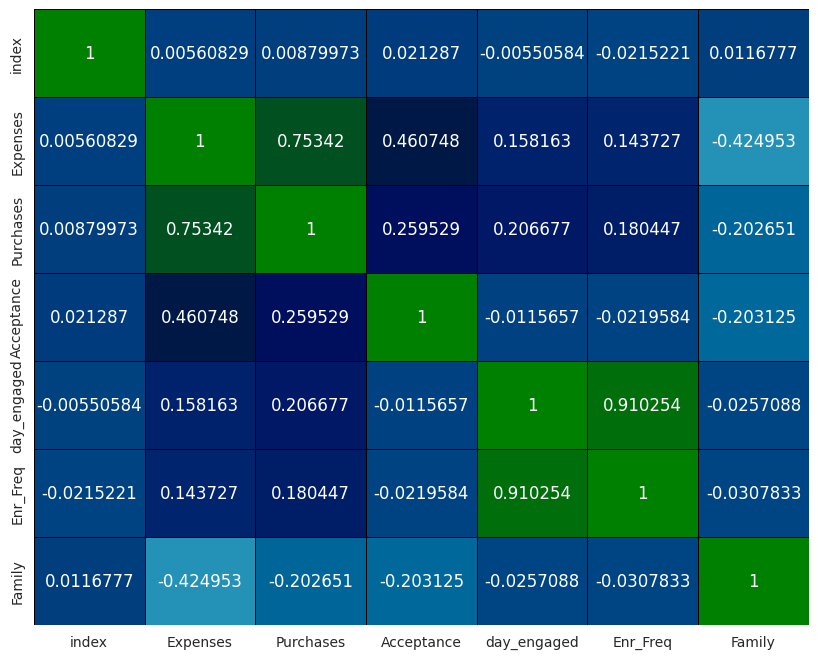

In [ ]:
#plotting pearsons coefficient matrix 
fig,ax = plt.subplots(figsize = (10,8))
sn.heatmap(df_cust5.corr(),annot=True,fmt='g',cbar=False,linewidths='0.5',linecolor='black',cmap='ocean_r',
           vmin = -1,vmax = 1)


- observations
- Day engaged and years enrolled frequency is highly correlated to each other 

- Expenses and purchases are also highly correlated to each other 



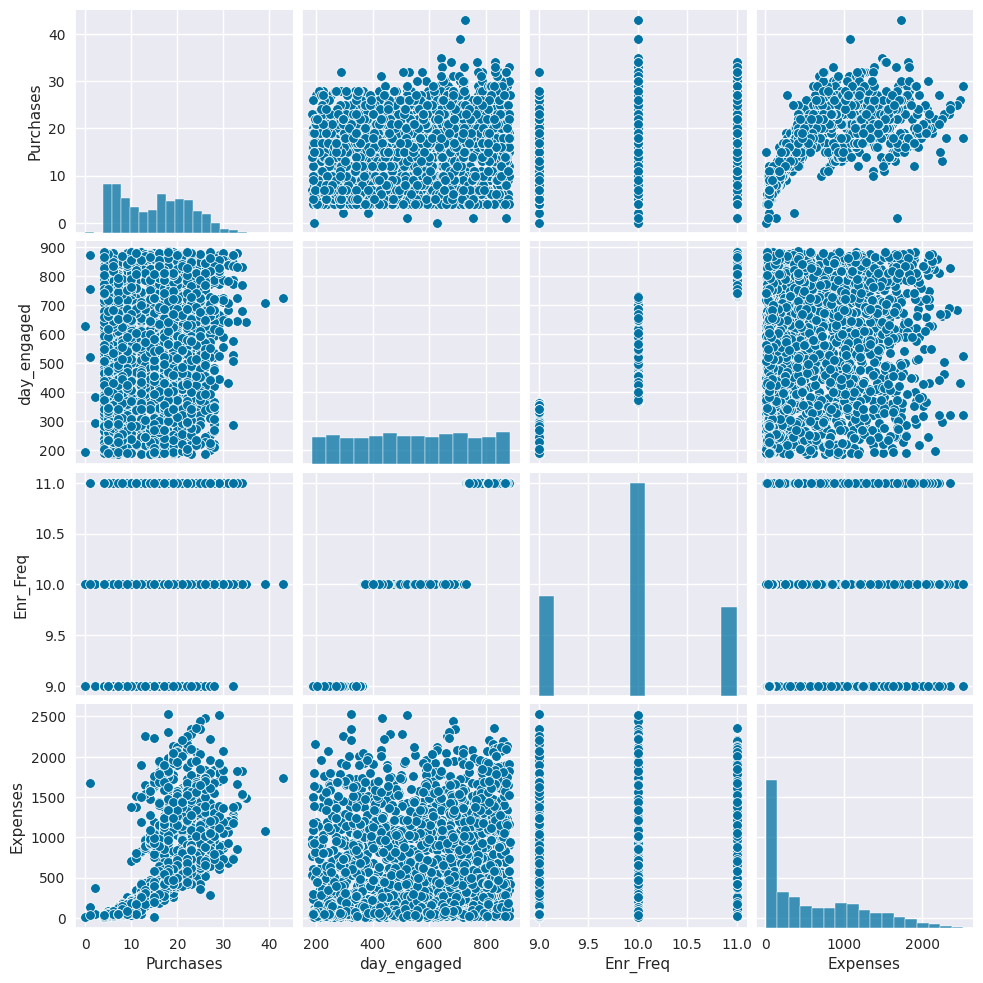

In [ ]:
#plotting the pairplot to check the rlationship with numerical features 
sn.set_style('darkgrid')
sn.pairplot(df_cust5,
            vars = ['Purchases','day_engaged',
                    'Enr_Freq','Expenses'] )


- Observations 
- we find Positive relationship of variables with purchases and expenses and positively correlated
- we also oserve that day engaged and enrollment frequency is having positive relationhip and positively correlated 


In [ ]:
#dropping our one out of correlated features 
df_cust6 = df_cust5.copy()
df_cust6.drop(['Expenses','Enr_Freq'],axis = 1 , inplace = True)

In [ ]:
df_cust6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2229 entries, 0 to 2228
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   index             2229 non-null   int64   
 1   Education         2229 non-null   object  
 2   Purchases         2229 non-null   int64   
 3   Acceptance        2229 non-null   int64   
 4   day_engaged       2229 non-null   int64   
 5   Income_Category   2229 non-null   category
 6   Family            2229 non-null   int64   
 7   Customer_Segment  2229 non-null   category
dtypes: category(2), int64(5), object(1)
memory usage: 109.4+ KB


In [ ]:
#selecting our features to required index 
df_cust6 = df_cust6[['Purchases','day_engaged','Acceptance','Income_Category','Customer_Segment','Family','Education']]

In [ ]:
df_cust6.head()

,Purchases,day_engaged,Acceptance,Income_Category,Customer_Segment,Family,Education
0,25,849,0,upper_middle,Boomer,1,Grad
1,6,299,0,middle,Boomer,3,Grad
2,21,498,0,upper_middle,Boomer,2,Grad
3,8,325,0,lower,Millennial,3,Grad
4,19,347,0,upper_middle,Gen X,3,PostGrad


# Feature Scaling

- Standard Scaler

In [ ]:
#dividing our features into numerical and categorical 
num_df = df_cust6[['Purchases','day_engaged']]
cat_df = df_cust6.iloc[:,2:7]

In [ ]:

#applying standard scaler on  the dataset 
std = StandardScaler()
df_scaled = std.fit_transform(num_df)

In [ ]:
#our scaled data 
df_scaled

array([[ 1.32944442,  1.52926525],
       [-1.16383787, -1.19076912],
       [ 0.80454288, -0.20661123],
       ...,
       [ 0.54209212, -0.98305741],
       [ 1.06699365, -0.97811189],
       [-0.50771095,  1.32649905]])

In [ ]:
#storing into our final dataframe 
df_final = pd.concat([pd.DataFrame(df_scaled,columns = ['Purchases','day_engaged']),cat_df],axis =1)

In [ ]:
df_final 

,Purchases,day_engaged,Acceptance,Income_Category,Customer_Segment,Family,Education
0,1.329444,1.529265,0,upper_middle,Boomer,1,Grad
1,-1.163838,-1.190769,0,middle,Boomer,3,Grad
2,0.804543,-0.206611,0,upper_middle,Boomer,2,Grad
3,-0.901387,-1.062186,0,lower,Millennial,3,Grad
4,0.542092,-0.953384,0,upper_middle,Gen X,3,PostGrad
...,...,...,...,...,...,...,...
2224,0.410867,0.134629,0,upper_middle,Boomer,3,Grad
2225,0.935768,-1.655648,1,upper_middle,Silent,5,PostGrad
2226,0.542092,-0.983057,1,middle,Gen X,1,Grad
2227,1.066994,-0.978112,0,upper_middle,Boomer,3,PostGrad


In [ ]:
#converting our categorical columns from string to categorical
df_final['Education'] = df_final['Education'].astype('category')

In [ ]:
df_final.dtypes

Purchases            float64
day_engaged          float64
Acceptance             int64
Income_Category     category
Customer_Segment    category
Family                 int64
Education           category
dtype: object

In [ ]:
df_final.head()

,Purchases,day_engaged,Acceptance,Income_Category,Customer_Segment,Family,Education
0,1.329444,1.529265,0,upper_middle,Boomer,1,Grad
1,-1.163838,-1.190769,0,middle,Boomer,3,Grad
2,0.804543,-0.206611,0,upper_middle,Boomer,2,Grad
3,-0.901387,-1.062186,0,lower,Millennial,3,Grad
4,0.542092,-0.953384,0,upper_middle,Gen X,3,PostGrad


In [ ]:
# getting dummies for all of our categorical variables 
df_final2 = pd.get_dummies(df_final,columns = ['Income_Category','Customer_Segment','Education'])

In [ ]:
df_final2

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad
0,1.329444,1.529265,0,1,0,0,1,0,0,0,1,0,1,0,0
1,-1.163838,-1.190769,0,3,0,1,0,0,0,0,1,0,1,0,0
2,0.804543,-0.206611,0,2,0,0,1,0,0,0,1,0,1,0,0
3,-0.901387,-1.062186,0,3,1,0,0,0,1,0,0,0,1,0,0
4,0.542092,-0.953384,0,3,0,0,1,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,0.410867,0.134629,0,3,0,0,1,0,0,0,1,0,1,0,0
2225,0.935768,-1.655648,1,5,0,0,1,0,0,0,0,1,0,1,0
2226,0.542092,-0.983057,1,1,0,1,0,0,0,1,0,0,1,0,0
2227,1.066994,-0.978112,0,3,0,0,1,0,0,0,1,0,0,1,0


# Feature Selection PCA on Standard Scaler

In [ ]:
pca = PCA(n_components= 15)
pca_components = pd.DataFrame(pca.fit_transform(df_final2),columns=['pc1','pc2','pc3','pc4','pc5',
                                                                   'pc6','pc7','pc8','pc9','pc10','pc11','pc12','pc13','pc14','pc15'])
pca_components

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15
0,2.429155,0.473833,-0.917135,-0.488741,-0.929028,0.414410,0.176404,-0.495785,-0.028747,-0.021715,-0.015442,-0.022484,1.985138e-15,-5.438166e-16,-3.379259e-17
1,-1.652407,-0.591337,0.087252,-0.651246,-0.250454,0.829569,0.528802,-0.346400,-0.074799,-0.057304,0.014615,0.027502,2.745305e-16,8.106921e-16,1.655872e-16
2,1.000496,-0.585937,0.077650,-0.696630,-0.822407,0.483951,-0.064279,-0.388982,-0.032317,-0.086945,0.008384,0.015222,6.426709e-16,-4.848787e-16,2.524080e-16
3,-1.362638,-0.628320,-0.311510,-0.805260,-0.143418,0.237282,-0.718484,0.819741,0.620187,0.017522,-0.014221,-0.196210,4.655246e-16,5.145653e-16,-1.130890e-15
4,0.016425,-0.793834,1.026327,0.492582,-0.316977,-0.835681,-0.509435,-0.118563,-0.051124,-0.260087,0.049596,0.037829,-3.615545e-15,1.495328e-16,-2.166338e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,0.451230,0.144904,0.538184,-0.780031,-0.600028,0.618605,-0.389918,-0.338329,-0.166453,-0.220805,0.067837,0.045551,-1.351392e-17,-7.252075e-17,4.620286e-18
2225,-0.432621,-0.887434,2.909529,0.265596,0.604106,0.230085,-0.950054,0.899443,-0.618065,0.283055,-0.042666,0.027480,1.522756e-17,-1.239123e-17,5.482782e-17
2226,0.576707,-1.483841,-0.697893,-0.508858,0.530254,-0.640071,1.224632,-0.238848,0.265494,0.250391,-0.234211,-0.089205,-3.382796e-17,-2.126984e-17,-6.220988e-17
2227,0.491499,-0.912973,1.358340,0.513490,-0.751870,0.444356,-0.406152,-0.209047,0.161669,-0.084212,0.000200,0.016849,-8.249380e-18,-1.367008e-16,-6.316606e-17


<Axes: xlabel='pc1', ylabel='pc2'>

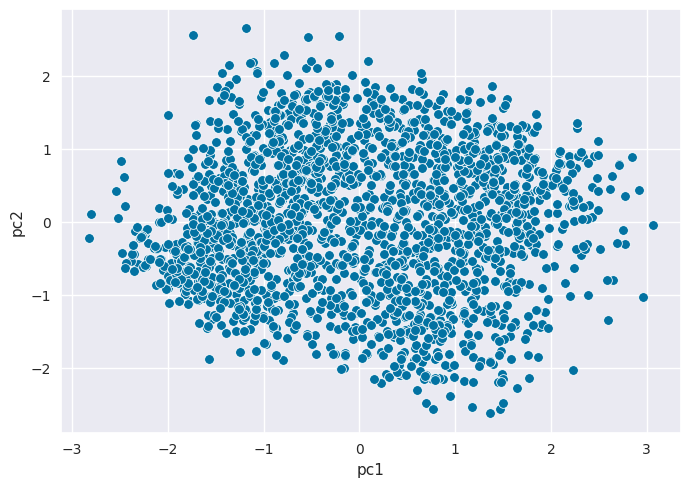

In [ ]:
#plotting scatter plot 
sn.scatterplot(x=pca_components.pc1,y=pca_components.pc2,palette='dark')

In [ ]:
#checking with explained variance for our columns 
var = (pca.explained_variance_ratio_)
var

array([2.76350014e-01, 1.88788631e-01, 1.41434922e-01, 9.47012613e-02,
       7.87499062e-02, 6.79781244e-02, 5.52141430e-02, 3.58384560e-02,
       2.61842137e-02, 2.20102973e-02, 7.02964561e-03, 5.72038525e-03,
       2.97186997e-33, 2.56753369e-33, 1.69783263e-33])

In [ ]:
#checking with cumulative variance 
cum_var = pd.DataFrame(np.cumsum(np.round(var,decimals=2)*100))
cum_var

,0
0,28.0
1,47.0
2,61.0
3,70.0
4,78.0
5,85.0
6,91.0
7,95.0
8,98.0
9,100.0


Text(0.5, 1.0, 'Explained variance by each component')

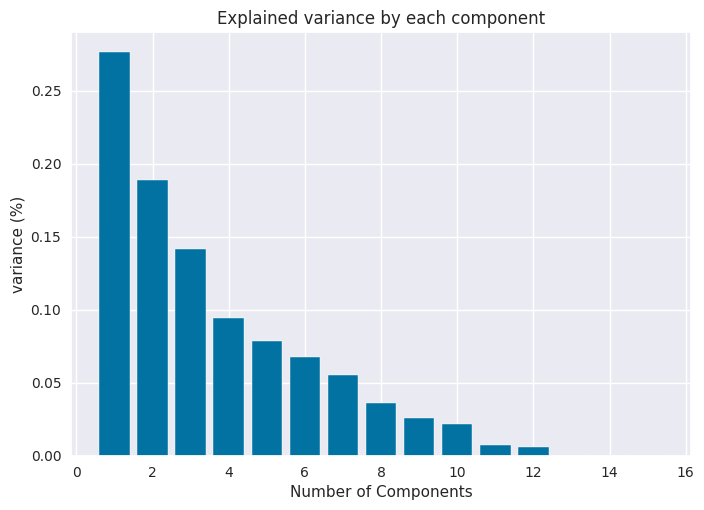

In [ ]:
#plotting against variance for components 
plt.bar(range(1, len(var)+1),var)
plt.xlabel('Number of Components')
plt.ylabel('variance (%)')
plt.title('Explained variance by each component')

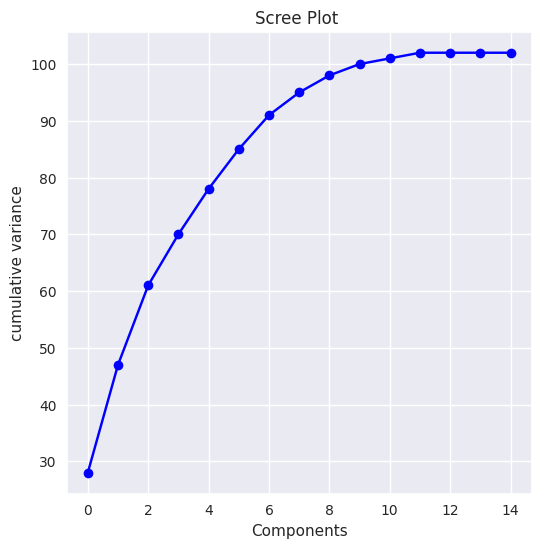

In [ ]:
#plotting scree plot 
plt.figure(figsize=(6,6))
plt.plot(cum_var,color = 'blue',marker = 'o')
plt.title('Scree Plot ')
plt.xlabel('Components')
plt.ylabel('cumulative variance')
plt.show()

- We observe that with 3 components we are getting good variance of above 70% hence we take with components 3

In [ ]:
#selecting our top 3 features
pca = PCA(n_components=3)
pca_final = pd.DataFrame(pca.fit_transform(df_final2),columns=['pc1','pc2','pc3',])
                                                                 
pca_final

,pc1,pc2,pc3
0,2.429155,0.473833,-0.917135
1,-1.652407,-0.591337,0.087252
2,1.000496,-0.585937,0.077650
3,-1.362638,-0.628320,-0.311510
4,0.016425,-0.793834,1.026327
...,...,...,...
2224,0.451230,0.144904,0.538184
2225,-0.432621,-0.887434,2.909529
2226,0.576707,-1.483841,-0.697893
2227,0.491499,-0.912973,1.358340


# Model Building By Clustering Techniques




 - KMEANS On Standard Scaler



Elbow plot for PCA


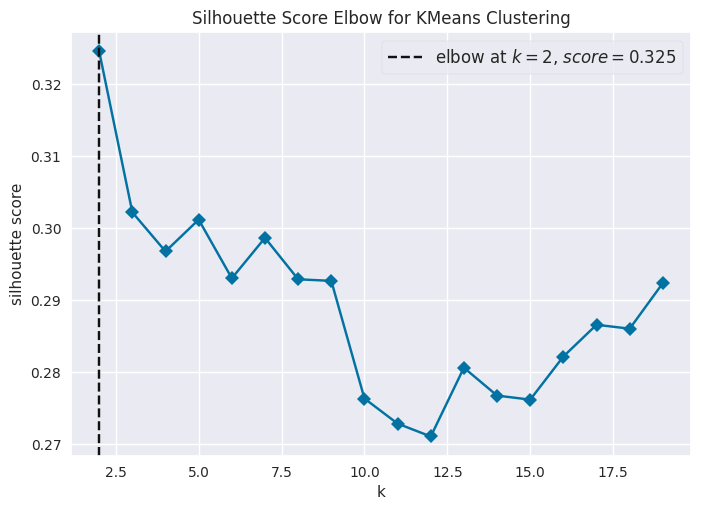

In [ ]:
#visualizing silhouette score with Kelbow visualizer 
model = KMeans(random_state=0,max_iter=500,init = 'k-means++')
visualizer = KElbowVisualizer(model,k =(2,20),metric = 'silhouette',timings = False)
print('Elbow plot for PCA')
visualizer.fit(pca_final)
visualizer.show()
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.32457585762283897
For n_clusters = 3 The average silhouette_score is : 0.30220090407868494
For n_clusters = 4 The average silhouette_score is : 0.2967710403593189
For n_clusters = 5 The average silhouette_score is : 0.3011912092780726
For n_clusters = 6 The average silhouette_score is : 0.29303706723591777
For n_clusters = 7 The average silhouette_score is : 0.29865626114606597
For n_clusters = 8 The average silhouette_score is : 0.29289299598970947
For n_clusters = 9 The average silhouette_score is : 0.2926736696138184


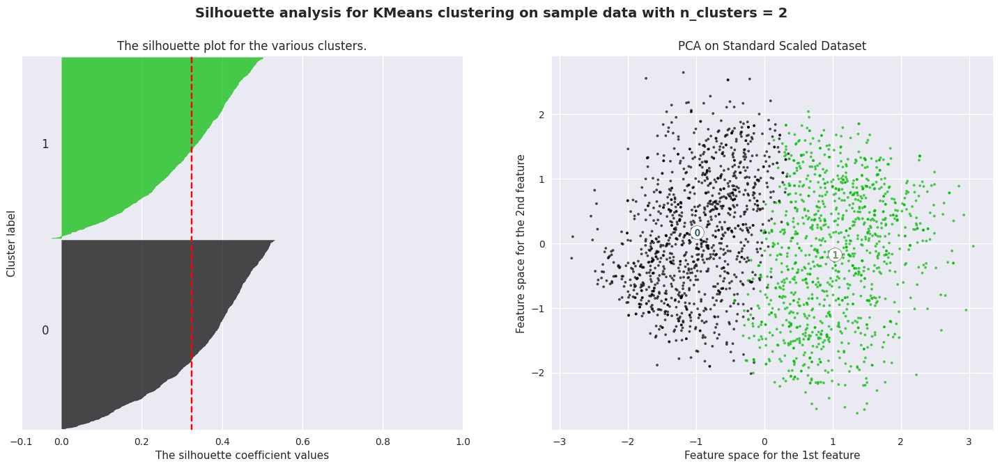

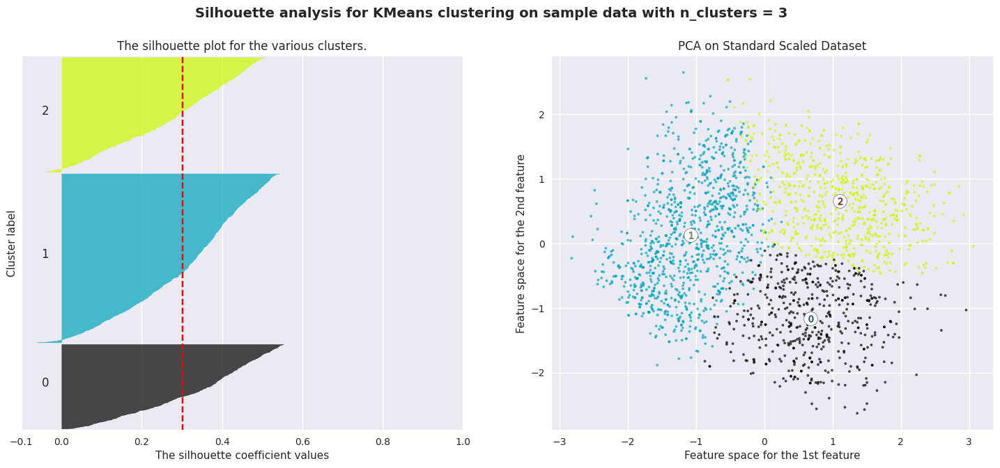

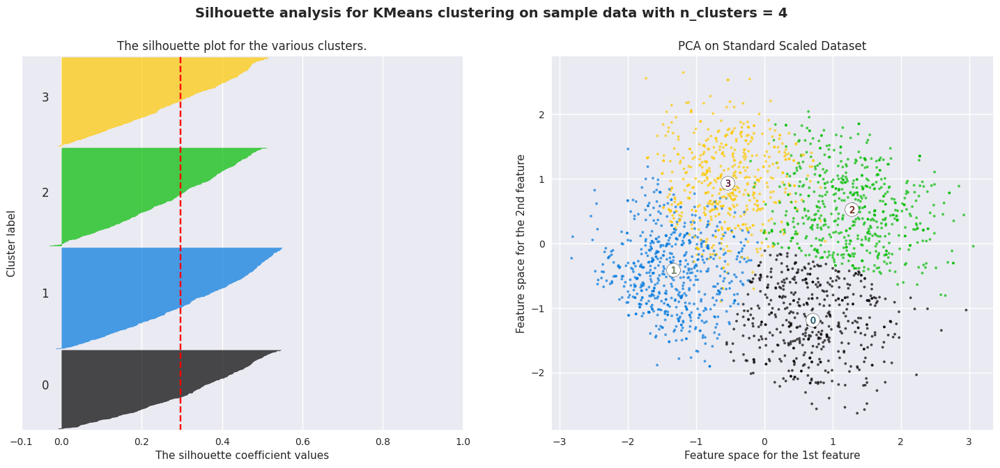

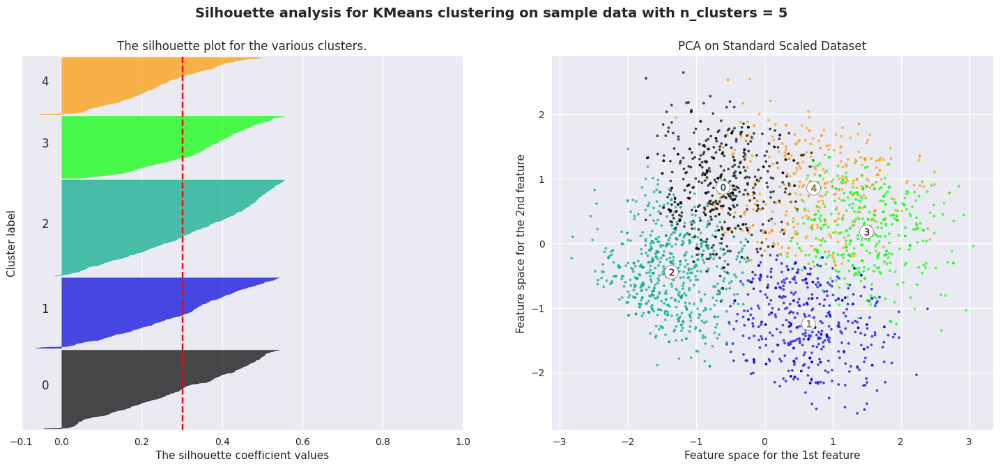

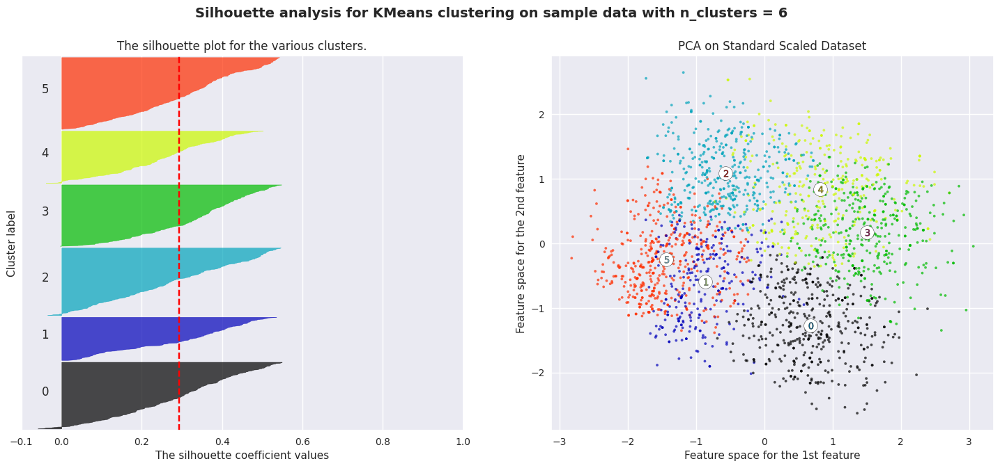

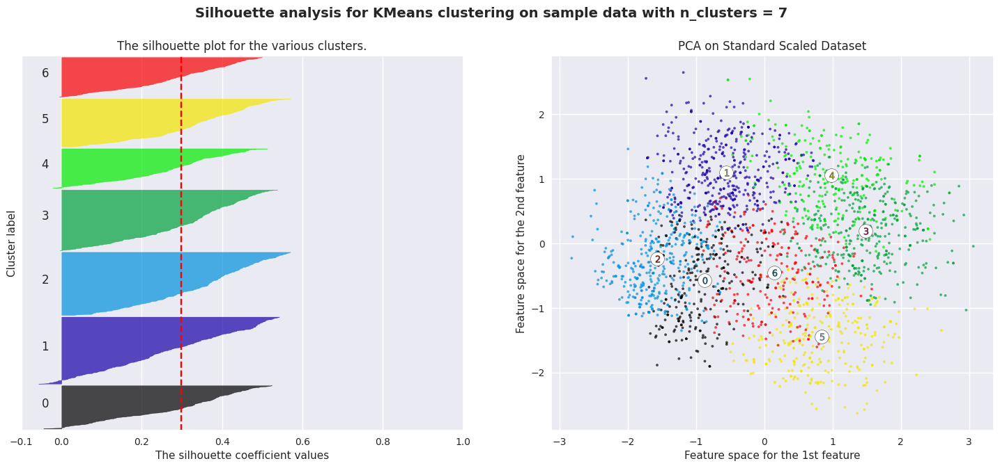

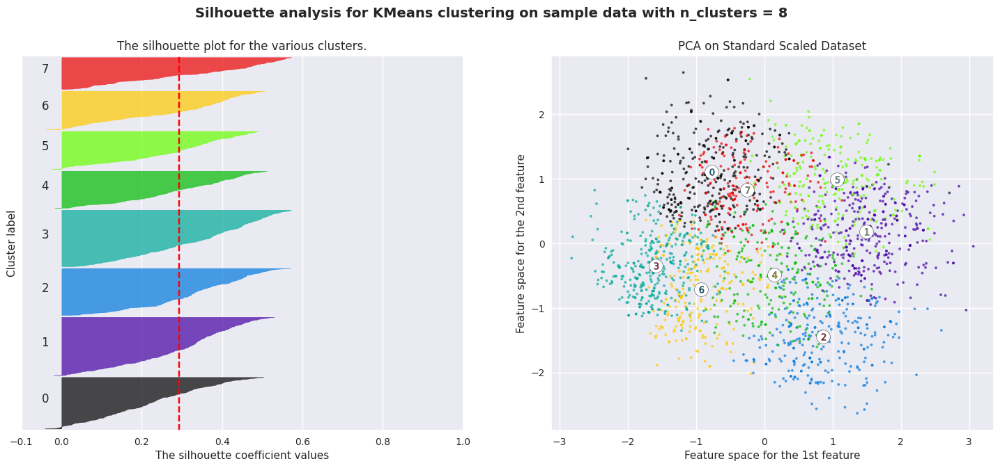

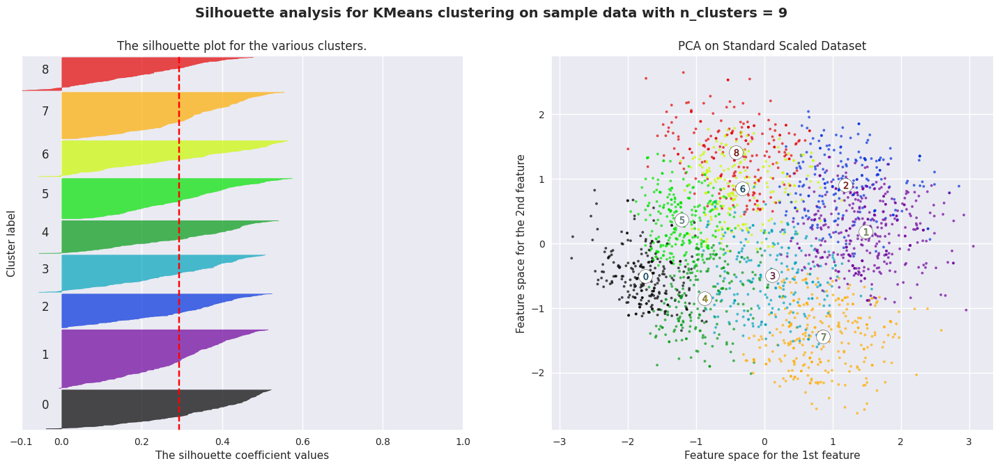

In [ ]:
#using the sklearn library to view the clusters 
range_n_clusters = [2,3,4,5,6,7,8,9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pca_final) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels = clusterer.fit_predict(pca_final)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pca_final, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_final, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(pca_final.iloc[:,0], pca_final.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:,0], centers[:,1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("PCA on Standard Scaled Dataset")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

- Building Our KMeans with clusters  = 2


In [ ]:
#fitting our kmeans Algorithm 
model_kmeans = KMeans(n_clusters=2,random_state=0,init ='k-means++')
kmeans_pred = model_kmeans.fit_predict(pca_final)

In [ ]:
#checking with our labels 
model_kmeans.labels_

array([1, 0, 1, ..., 1, 1, 0], dtype=int32)

In [ ]:
#checking with centroids of the clusters 
model_kmeans.cluster_centers_

array([[-0.99234422,  0.16843582, -0.1507173 ],
       [ 1.03695419, -0.17600771,  0.15749267]])

In [ ]:
#checking with inertia the lower the inertia denser the clusters
model_kmeans.inertia_

4547.965347725137

In [ ]:
#labeling our cluster to our original dataset 
df_final2['kmeans_label_std'] = model_kmeans.labels_


Text(0.5, 1.0, 'KMeans Classification')

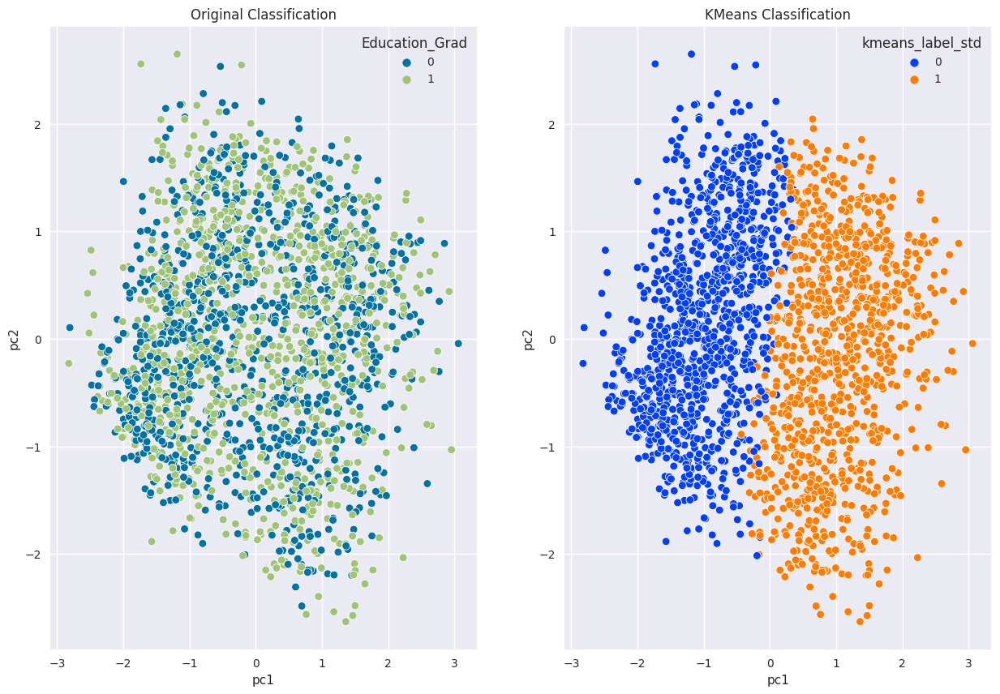

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['kmeans_label_std'],palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('KMeans Classification')

In [ ]:
# Group data by Clusters (K=2)
df_final2.groupby('kmeans_label_std').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
kmeans_label_std,,,,,,,,,,,,,,,
0,-0.815364,-0.184213,0.085237,2.934974,0.308436,0.644991,0.045694,0.000879,0.173989,0.484183,0.257469,0.084359,0.49297,0.461336,0.045694
1,0.850490,0.192149,0.521540,2.242896,0.010999,0.211732,0.705775,0.071494,0.134739,0.351054,0.359303,0.154904,0.51604,0.482126,0.001833


In [ ]:
#saving our average clusters into excel file 
kmeans_df = df_final2.groupby('kmeans_label_std').agg(['mean'])
kmeans_df.to_csv('clustering.csv')

 - building our kmeans with clusters = 3

In [ ]:
#fitting our kmeans Algorithm 
model_kmeans2 = KMeans(n_clusters=3,random_state=0,init ='k-means++')
kmeans_pred2 = model_kmeans2.fit_predict(pca_final)


In [ ]:
#checking with our labels 
model_kmeans2.labels_

array([2, 1, 0, ..., 0, 0, 1], dtype=int32)

In [ ]:
#checking with centroids of the clusters 
model_kmeans2.cluster_centers_

array([[ 0.67849921, -1.16795987,  0.20890788],
       [-1.0833509 ,  0.13460451, -0.178682  ],
       [ 1.10205133,  0.66213257,  0.11024115]])

In [ ]:
#checking with inertia the lower the inertia denser the clusters
model_kmeans2.inertia_

3597.8330753824343

In [ ]:
#labeling our cluster to our original dataset 
df_final2['kmeans_label_std2'] = model_kmeans2.labels_


Text(0.5, 1.0, 'KMeans Classification')

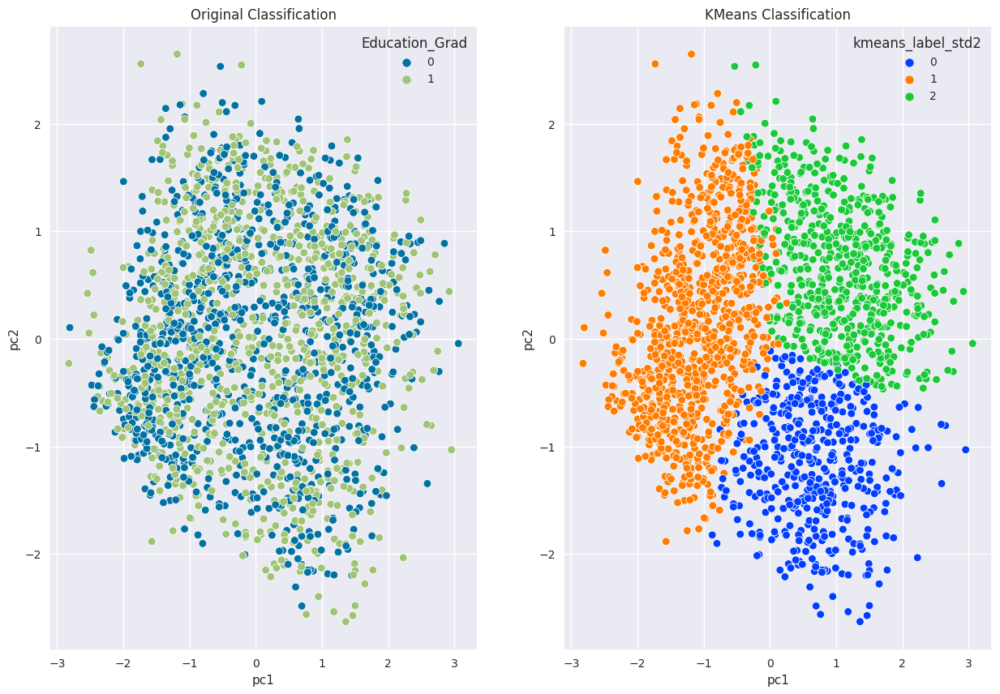

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['kmeans_label_std2'],palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('KMeans Classification')

In [ ]:
# Group data by Clusters (K=3)
df_final2.groupby('kmeans_label_std2').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
kmeans_label_std2,,,,,,,,,,,,,,,,
0,0.669473,-0.808438,0.644531,2.044922,0.011719,0.082031,0.810547,0.095703,0.154297,0.341797,0.335938,0.167969,0.498047,0.501953,0.000000,0.917969
1,-0.898052,-0.240045,0.083089,2.940371,0.328446,0.645161,0.026393,0.000000,0.183773,0.485826,0.252199,0.078201,0.487781,0.462366,0.049853,0.001955
2,0.829880,0.950269,0.361671,2.495677,0.030259,0.378963,0.547550,0.043228,0.112392,0.377522,0.367435,0.142651,0.533141,0.462536,0.004323,0.891931


- building our kmeans with clusters = 5

In [ ]:
#fitting our kmeans Algorithm 
model_kmeans3 = KMeans(n_clusters=5,random_state=0,init ='k-means++')
kmeans_pred3 = model_kmeans3.fit_predict(pca_final)


In [ ]:
#checking with our labels 
model_kmeans3.labels_

array([3, 2, 1, ..., 1, 1, 0], dtype=int32)

In [ ]:
#checking with centroids of the clusters 
model_kmeans3.cluster_centers_

array([[-0.60966167,  0.87548136, -0.69725106],
       [ 0.64101785, -1.24233578,  0.28709809],
       [-1.3626671 , -0.43726397,  0.13110707],
       [ 1.49645513,  0.18659405, -0.46466972],
       [ 0.71537625,  0.86149527,  0.89168657]])

In [ ]:
#checking with inertia the lower the inertia denser the clusters
model_kmeans3.inertia_

2426.6890507357266

In [ ]:
#labeling our cluster to our original dataset 
df_final2['kmeans_label_std3'] = model_kmeans3.labels_


Text(0.5, 1.0, 'KMeans Classification')

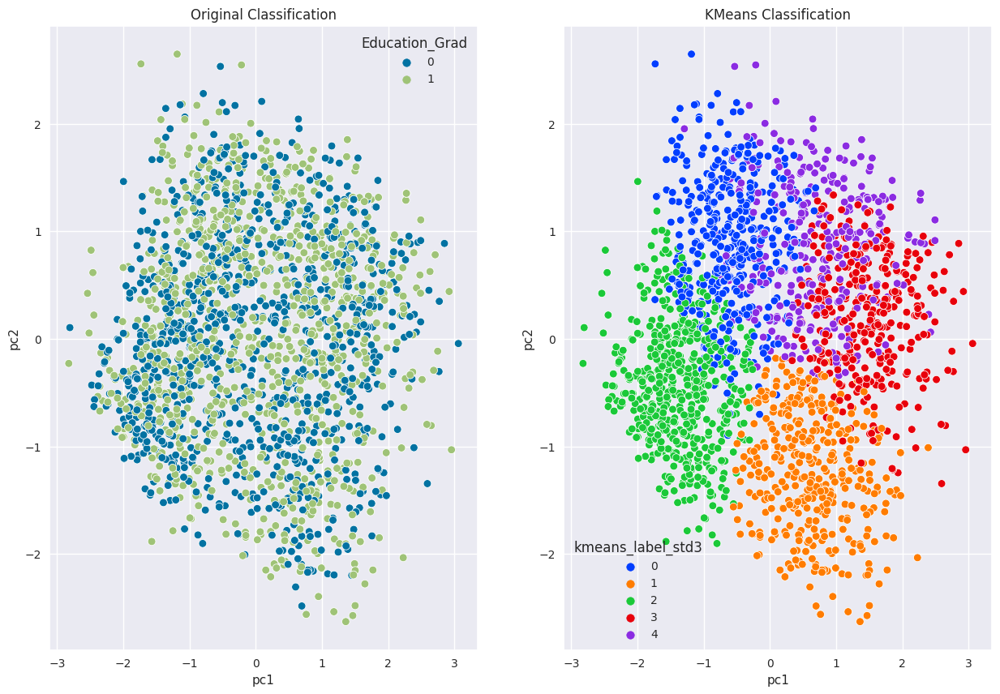

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['kmeans_label_std3'],palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('KMeans Classification')

In [ ]:
# Group data by Clusters (K=5)
df_final2.groupby('kmeans_label_std3').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std,kmeans_label_std2
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
kmeans_label_std3,,,,,,,,,,,,,,,,,
0,-0.886685,0.737192,0.076763,2.686722,0.419087,0.568465,0.010373,0.002075,0.240664,0.468880,0.219917,0.070539,0.549793,0.373444,0.076763,0.045643,1.122407
1,0.679393,-0.912469,0.648148,2.094907,0.004630,0.064815,0.840278,0.090278,0.127315,0.356481,0.354167,0.162037,0.520833,0.479167,0.000000,0.944444,0.013889
2,-0.880373,-0.934799,0.095400,3.028961,0.257240,0.695060,0.047700,0.000000,0.148211,0.492334,0.262351,0.097104,0.449744,0.522998,0.027257,0.000000,0.969336
3,0.836051,0.870350,0.567282,1.707124,0.015831,0.208443,0.683377,0.092348,0.200528,0.290237,0.356201,0.153034,0.506596,0.490765,0.002639,1.000000,1.725594
4,0.956448,0.738464,0.223496,3.329513,0.005731,0.504298,0.478510,0.011461,0.031519,0.444126,0.392550,0.131805,0.510029,0.489971,0.000000,0.808023,1.836676


#Hierarchial Clustering

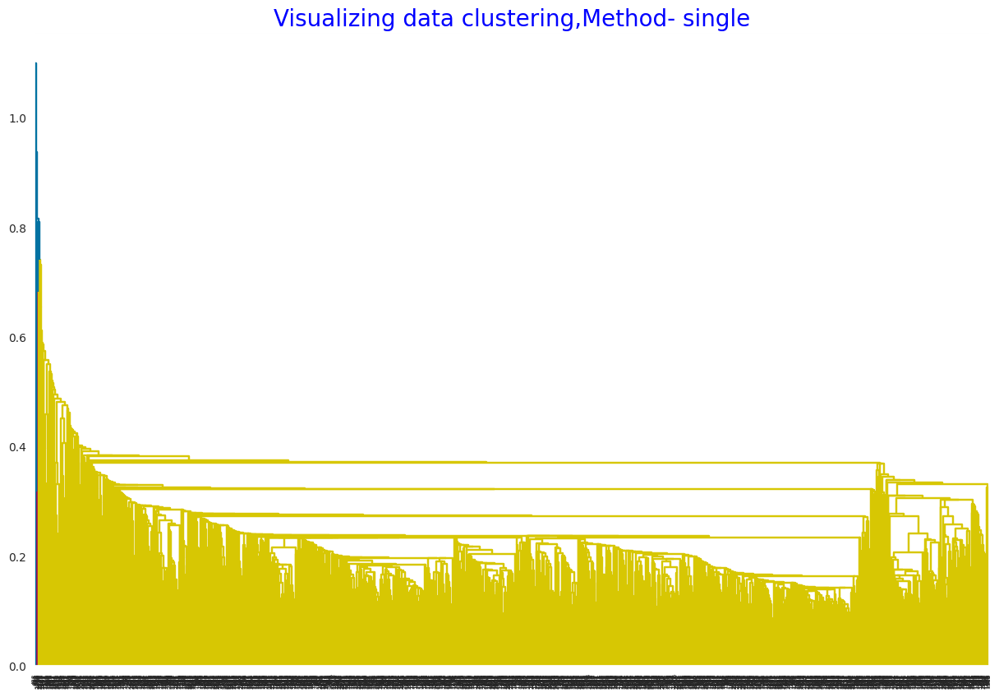

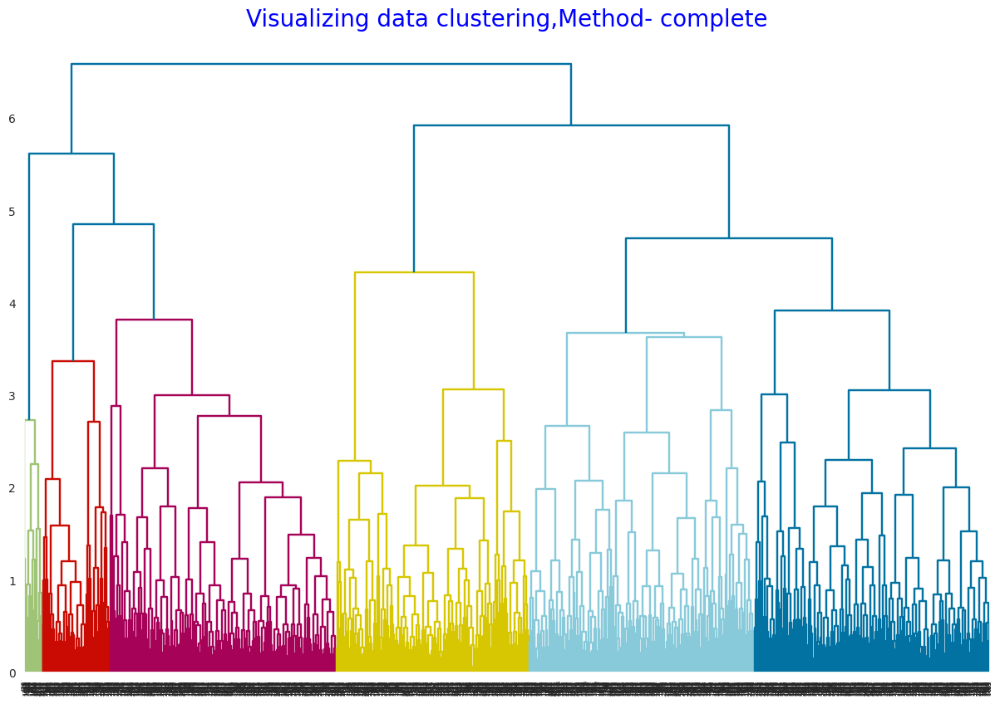

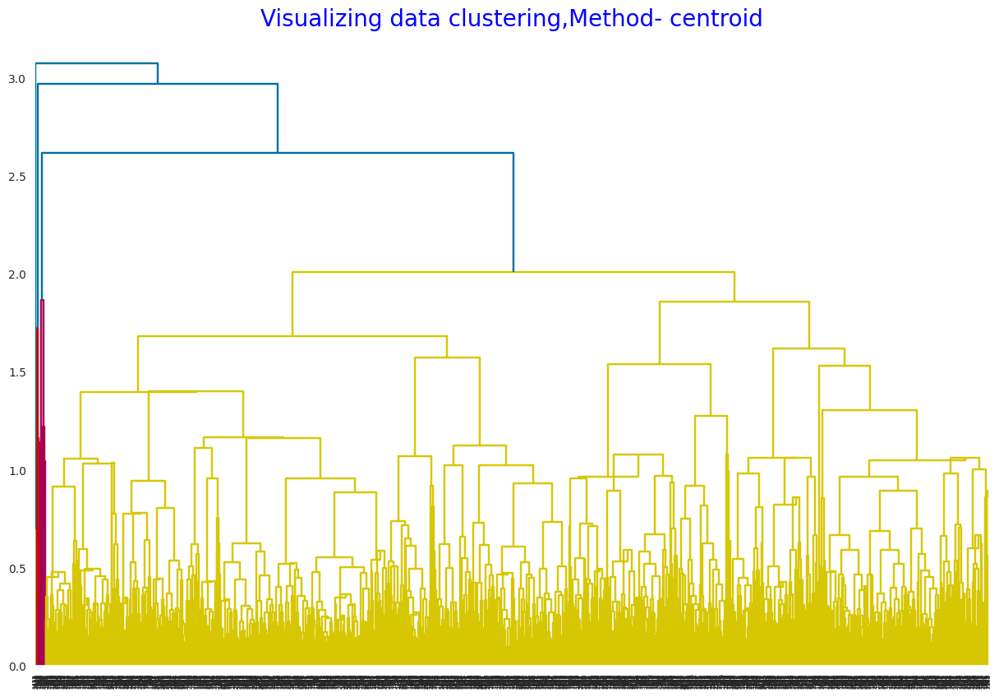

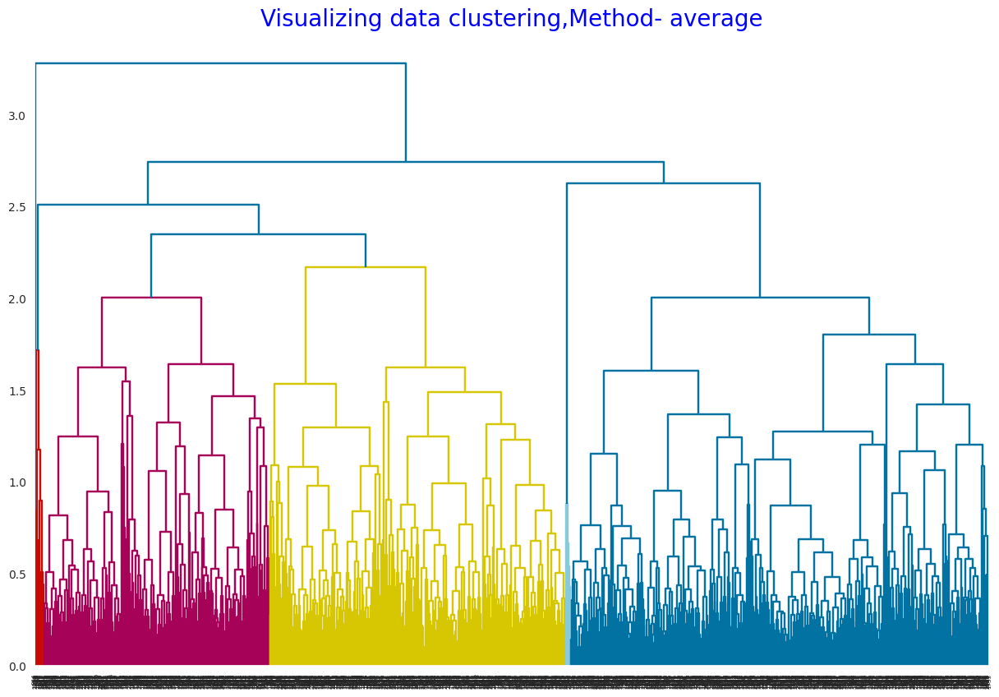

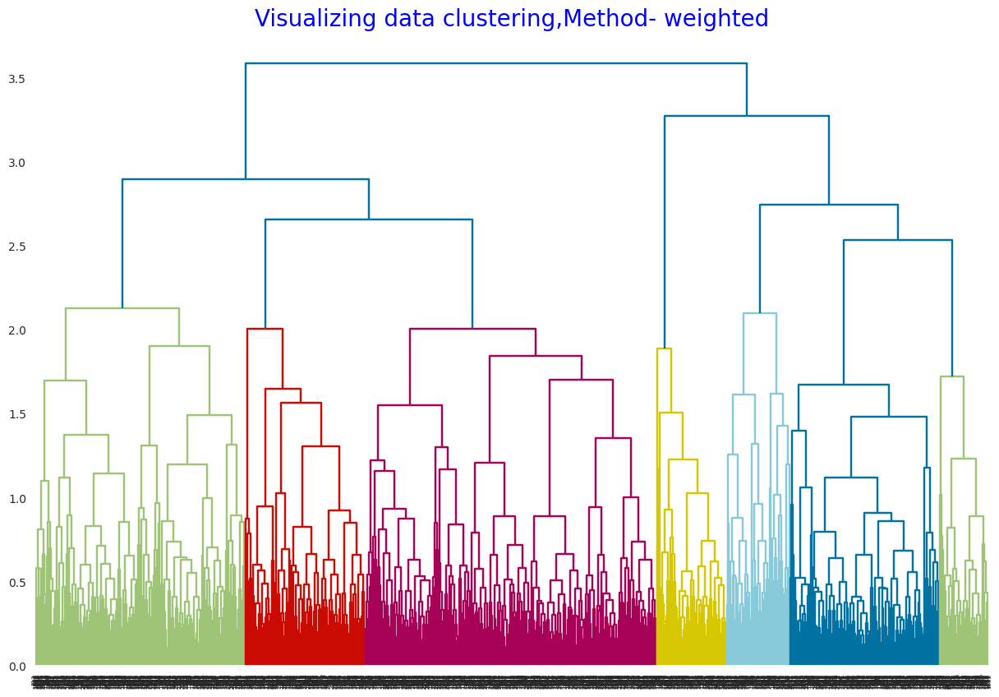

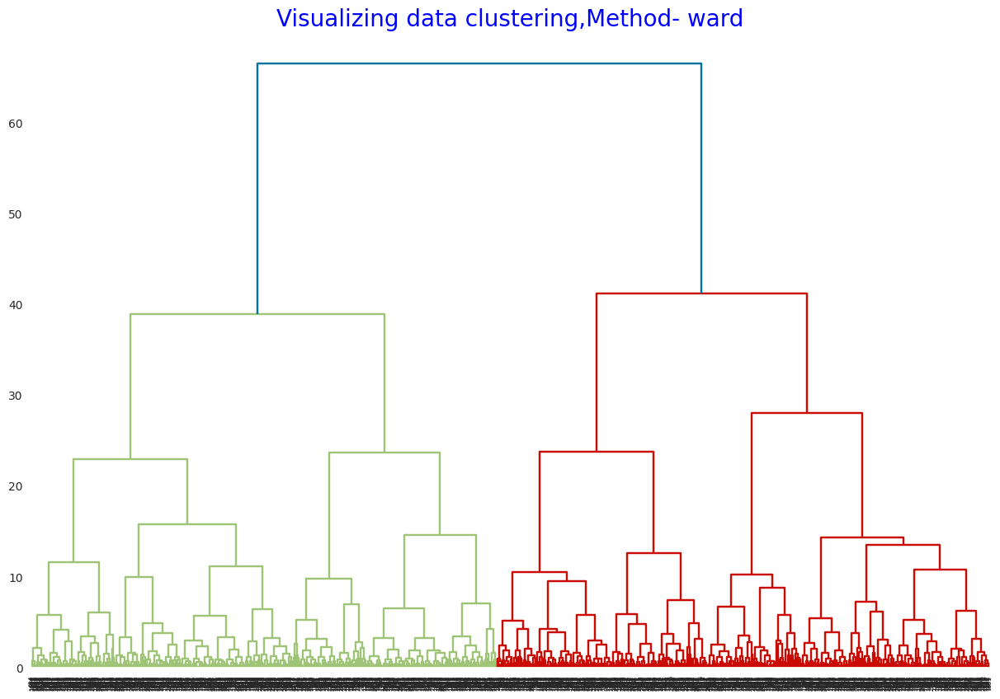

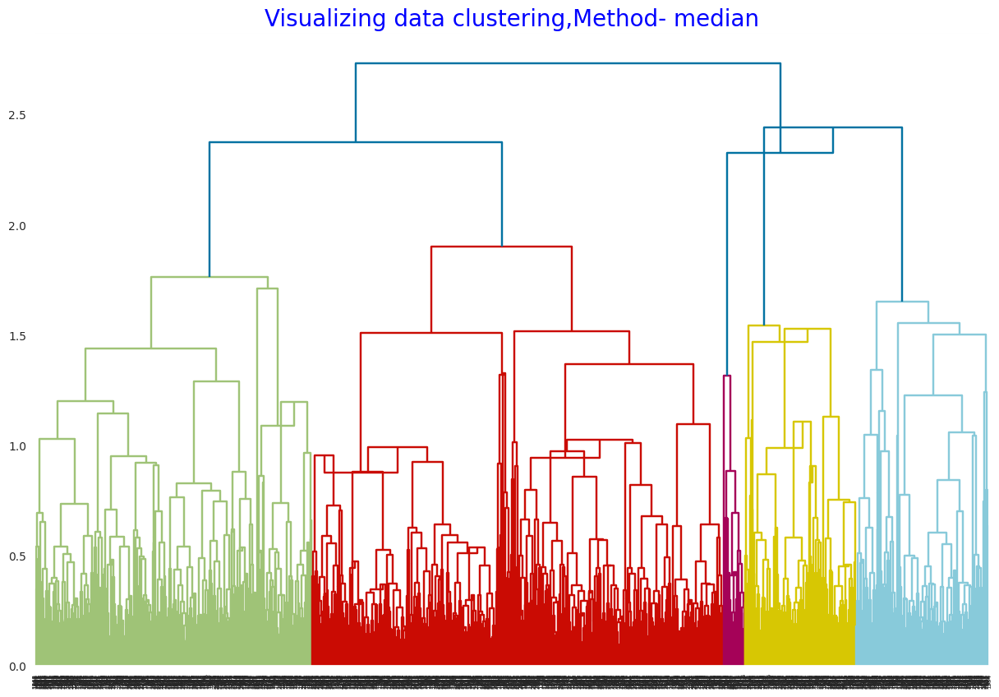

In [ ]:
for methods in ['single','complete','centroid','average','weighted','ward','median']:
  plt.figure(figsize = (15,10))
  dict = {'fontsize':20,'fontweight':12,'color':'blue'}
  plt.title('Visualizing data clustering,Method- {}'.format(methods),fontdict=dict)
  Dendrogram = sch.dendrogram(sch.linkage(pca_final,method=methods,optimal_ordering=False))


In [ ]:
# Applying Different Linkages using Euclidean Method for distance Calculation
n_clusters = [2,3,4,5,6,7,8]
for n_clusters in n_clusters:
  for linkages in ["complete","average","single","ward"]:
    for affinities in ["euclidean","l1","l2","manhattan","cosine"]:

      hie_cluster1 = AgglomerativeClustering(n_clusters = n_clusters, linkage = linkages)
      hie_labels1 = hie_cluster1.fit_predict(pca_final)
      silhouette_score1 = silhouette_score(pca_final,hie_labels1)
      print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages,"and Affinity-",affinities,':',silhouette_score1)
      print()


For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.1893007884016704

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l1 : 0.1893007884016704

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l2 : 0.1893007884016704

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.1893007884016704

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- cosine : 0.1893007884016704

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- euclidean : 0.24812283730649504

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l1 : 0.24812283730649504

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l2 : 0.24812283730649504

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- manhattan :

- Observation 

With standard scaler we are getting silhouette score of 0.36 with linkage as single and affinity as manhattan 

In [ ]:
#Fitting our agglomerative clustering with optimal Parameters 
agg_clus = AgglomerativeClustering(n_clusters = 2,linkage = 'single',affinity='manhattan')
pred_hie = agg_clus.fit_predict(pca_final)
print(pred_hie.shape)
pred_hie

(2229,)


array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
#calculating our silhouette score
(silhouette_score(pca_final, agg_clus.labels_)*100).round(3)

36.77

In [ ]:
#fitting our labels on our dataframe
df_final2['hie_labels'] = agg_clus.labels_

In [ ]:
# Group data by Clusters 
df_final2.groupby('hie_labels').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std,kmeans_label_std2,kmeans_label_std3
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
hie_labels,,,,,,,,,,,,,,,,,,
0,-0.001421,-0.000373,0.298923,2.595601,0.162926,0.433124,0.368492,0.035458,0.154847,0.41921,0.307002,0.118941,0.504488,0.471275,0.024237,0.489228,1.081239,1.855925
1,3.166600,0.831947,0.000000,4.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,4.000000


Text(0.5, 1.0, 'Agglomerative Classification')

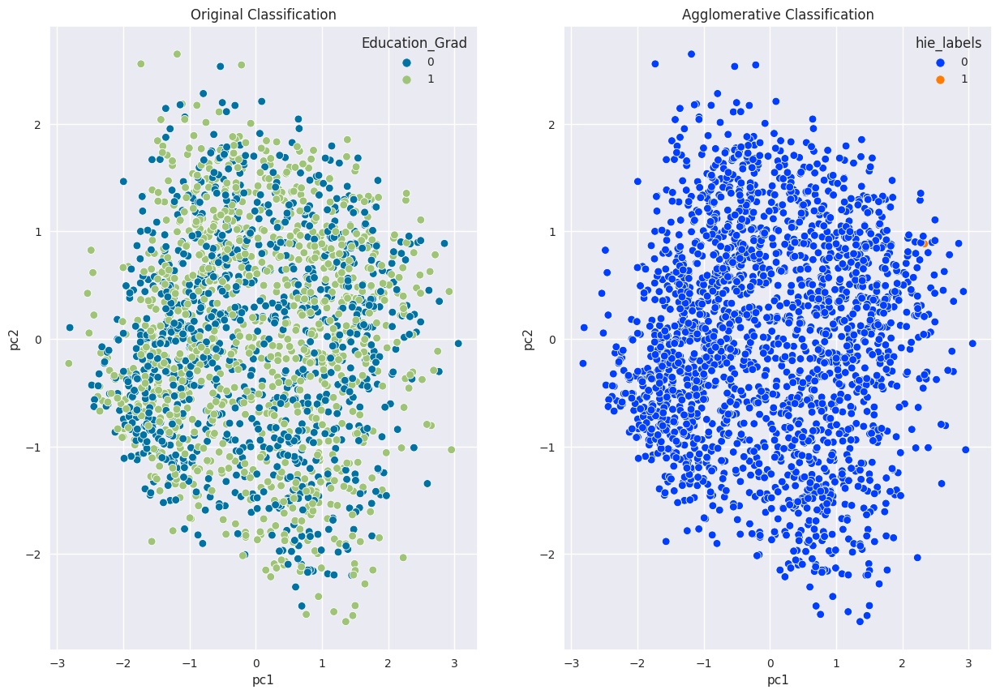

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['hie_labels'],palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('Agglomerative Classification')

# Density Based Clustering (DBSCANS)

In [ ]:
#converting our pca to numpy
X = pca_final.to_numpy()

In [ ]:
#defining our parameters 
epsilons = np.linspace(0.01,1,num = 15)
min_samples = np.arange(2,20,step = 3)
combinations = list(product(epsilons,min_samples))
n = len(combinations)


In [ ]:
#defining our parameters with manual fuction and gridsearching for best parameters 
def get_scores_and_labels(combinations, X):
  scores = []
  all_labels_list = []

  for i, (eps, num_samples) in enumerate(combinations):
    dbscan_cluster_model = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
    labels = dbscan_cluster_model.labels_
    labels_set = set(labels)
    num_clusters = len(labels_set)
    if -1 in labels_set:
      num_clusters -= 1
    
    if (num_clusters < 2) or (num_clusters > 50):
      scores.append(-10)
      all_labels_list.append('bad')
      c = (eps, num_samples)
      print(f"Combination {c} on iteration {i+1} of {n} has {num_clusters} clusters. Moving on")
      continue
    
    scores.append(silhouette_score(X, labels))
    all_labels_list.append(labels)
    print(f"Index: {i}, Score: {scores[-1]}, Labels: {all_labels_list[-1]}, NumClusters: {num_clusters}")

  best_index = np.argmax(scores)
  best_parameters = combinations[best_index]
  best_labels = all_labels_list[best_index]
  best_score = scores[best_index]

  return {'best_epsilon': best_parameters[0],
          'best_min_samples': best_parameters[1], 
          'best_labels': best_labels,
          'best_score': best_score}

best_dict = get_scores_and_labels(combinations, X)

Combination (0.01, 2) on iteration 1 of 90 has 208 clusters. Moving on
Combination (0.01, 5) on iteration 2 of 90 has 0 clusters. Moving on
Combination (0.01, 8) on iteration 3 of 90 has 0 clusters. Moving on
Combination (0.01, 11) on iteration 4 of 90 has 0 clusters. Moving on
Combination (0.01, 14) on iteration 5 of 90 has 0 clusters. Moving on
Combination (0.01, 17) on iteration 6 of 90 has 0 clusters. Moving on
Combination (0.08071428571428571, 2) on iteration 7 of 90 has 333 clusters. Moving on
Index: 7, Score: -0.2997991909940281, Labels: [-1 -1 -1 ... -1 -1 -1], NumClusters: 4
Combination (0.08071428571428571, 8) on iteration 9 of 90 has 0 clusters. Moving on
Combination (0.08071428571428571, 11) on iteration 10 of 90 has 0 clusters. Moving on
Combination (0.08071428571428571, 14) on iteration 11 of 90 has 0 clusters. Moving on
Combination (0.08071428571428571, 17) on iteration 12 of 90 has 0 clusters. Moving on
Combination (0.15142857142857144, 2) on iteration 13 of 90 has 392 

In [ ]:
#locating our best parameters for dbscans 
best_dict

{'best_epsilon': 0.8585714285714285,
 'best_min_samples': 2,
 'best_labels': array([0, 0, 0, ..., 0, 0, 0]),
 'best_score': 0.18901207285487706}

In [ ]:
#fitting our dbscan optimal parameters 
dbscan = DBSCAN(eps = 0.85,min_samples=2)
dbscan.fit(pca_final)

DBSCAN(eps=0.85, min_samples=2)

In [ ]:
#checking with labels 
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
#adding the labels to our dataframe 
df_final2['dbscan_labels'] = dbscan.labels_

In [ ]:
df_final2.groupby('dbscan_labels').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std,kmeans_label_std2,kmeans_label_std3,hie_labels
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
dbscan_labels,,,,,,,,,,,,,,,,,,,
-1,3.166600,0.831947,0.000000,4.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,1.000000,0.000000,0.000000,1.0000,0.000000,1.000000,2.000000,4.000000,1.0
0,-0.002145,0.000039,0.299191,2.593441,0.163073,0.432615,0.368823,0.03549,0.154987,0.419587,0.306379,0.119048,0.504942,0.4708,0.024259,0.489668,1.081312,1.853998,0.0
1,0.804543,-0.458833,0.000000,5.000000,0.000000,1.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,0.000000,1.0000,0.000000,0.000000,1.000000,4.000000,0.0


Text(0.5, 1.0, 'DBSCAN Classification')

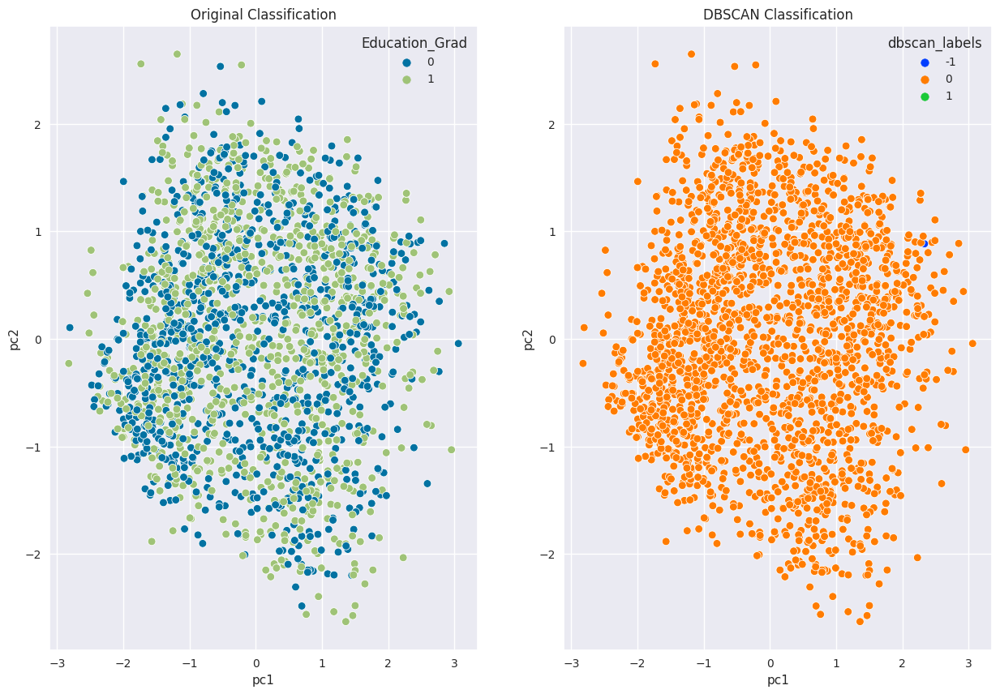

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final.iloc[:,0],y = pca_final.iloc[:,1],data = df_final2,hue = df_final2['dbscan_labels'],palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('DBSCAN Classification')

# PCA on MinMax Scaler

In [ ]:
#dividing our features into numerical and categorical 
num_df = df_cust6[['Purchases','day_engaged']]
cat_df = df_cust6.iloc[:,2:7]

In [ ]:
#applying MinMax scaler on  the dataset 
min = MinMaxScaler()
df_minmax = min.fit_transform(num_df)

In [ ]:
#our scaled data 
df_minmax

array([[0.58139535, 0.94849785],
       [0.13953488, 0.16165951],
       [0.48837209, 0.44635193],
       ...,
       [0.44186047, 0.22174535],
       [0.53488372, 0.22317597],
       [0.25581395, 0.88984263]])

In [ ]:
#storing into our final dataframe 
df_final_minmax = pd.concat([pd.DataFrame(df_minmax,columns = ['Purchases','day_engaged']),cat_df],axis =1)

In [ ]:
#converting our categorical columns from string to categorical
df_final_minmax['Education'] = df_final_minmax['Education'].astype('category')

In [ ]:
df_final_minmax.dtypes

Purchases            float64
day_engaged          float64
Acceptance             int64
Income_Category     category
Customer_Segment    category
Family                 int64
Education           category
dtype: object

In [ ]:
# getting dummies for all of our categorical variables 
df_final_minmax2 = pd.get_dummies(df_final_minmax,columns = ['Income_Category','Customer_Segment','Education'])

In [ ]:
pca2 = PCA(n_components= 15)
pca_components2 = pd.DataFrame(pca2.fit_transform(df_final_minmax2),columns=['pc1','pc2','pc3','pc4','pc5',
                                                                   'pc6','pc7','pc8','pc9','pc10','pc11','pc12','pc13','pc14','pc15'])
pca_components2

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,pc11,pc12,pc13,pc14,pc15
0,1.636621,-0.628758,-0.536065,-0.871598,-0.009687,-0.524087,-0.310350,-0.024570,0.412894,-0.008945,-0.024370,0.022074,1.087833e-15,1.946773e-15,-3.258139e-17
1,-0.636041,-0.622715,-0.093013,-0.571074,0.804235,-0.288159,-0.231367,0.037019,-0.375268,-0.034685,0.016927,-0.082733,6.626370e-16,7.661702e-16,-1.569145e-16
2,0.751201,-0.649572,-0.154024,-1.001602,-0.183860,-0.378250,-0.208482,-0.055823,-0.085417,0.012368,0.016649,0.010434,-1.112281e-15,7.139313e-16,1.001145e-16
3,-0.286233,-0.840296,-0.236606,-0.106197,-0.009962,1.329423,0.168747,-0.252532,-0.332143,0.025301,-0.171058,0.098637,1.817702e-15,-4.546379e-17,-9.770131e-16
4,-0.288819,0.632328,-0.009665,0.119362,-1.128759,-0.243621,0.068074,-0.211669,-0.266434,0.051860,0.036296,0.001536,-3.031931e-16,-3.771824e-15,-4.696301e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,-0.128282,-0.681570,0.223981,-1.134794,-0.359119,-0.234189,-0.115833,-0.110252,0.011871,0.027910,0.024893,-0.071293,2.895668e-17,-6.265358e-18,-1.042759e-16
2225,-1.618386,0.780879,1.659694,-0.594051,-0.869708,0.427288,1.038077,0.479644,-0.391716,-0.003751,0.050205,0.076193,-9.713135e-17,1.940581e-17,-6.815879e-17
2226,1.337646,-0.533911,-0.065168,1.154149,0.742548,-0.616978,-0.250592,0.102317,-0.281697,-0.146178,-0.028475,0.190584,-4.876565e-17,-1.639495e-17,-6.954306e-17
2227,-0.192684,0.718173,0.094682,-1.115369,-0.507645,-0.135966,-0.152065,-0.150498,-0.264979,0.052246,0.035660,0.085605,-2.130227e-16,4.666609e-17,-1.118518e-16


<Axes: xlabel='pc1', ylabel='pc2'>

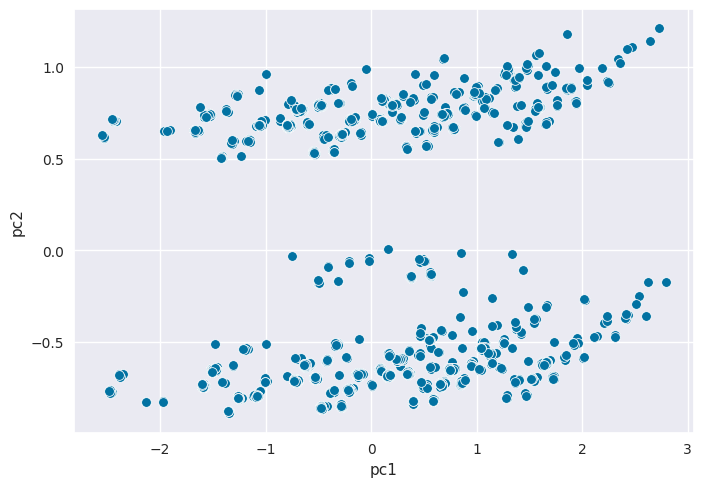

In [ ]:
#plotting scatter plot 
sn.scatterplot(x=pca_components2.pc1,y=pca_components2.pc2,palette='dark')

In [ ]:
#checking with explained variance for our columns 
var = (pca2.explained_variance_ratio_)
var

array([2.93288682e-01, 1.50511112e-01, 1.33867038e-01, 1.13731208e-01,
       9.73266818e-02, 7.09874575e-02, 5.24724269e-02, 3.63601143e-02,
       2.61204756e-02, 1.19863910e-02, 9.10525421e-03, 4.24315898e-03,
       6.81229246e-33, 5.36847376e-33, 3.70272959e-33])

In [ ]:
#checking with cumulative variance 
cum_var = pd.DataFrame(np.cumsum(np.round(var,decimals=2)*100))
cum_var

,0
0,29.0
1,44.0
2,57.0
3,68.0
4,78.0
5,85.0
6,90.0
7,94.0
8,97.0
9,98.0


Text(0.5, 1.0, 'Explained variance by each component')

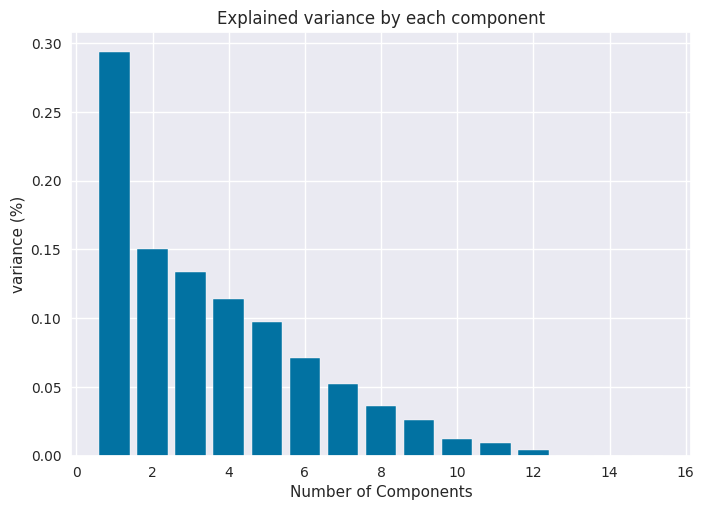

In [ ]:
#plotting against variance for components 
plt.bar(range(1, len(var)+1),var)
plt.xlabel('Number of Components')
plt.ylabel('variance (%)')
plt.title('Explained variance by each component')

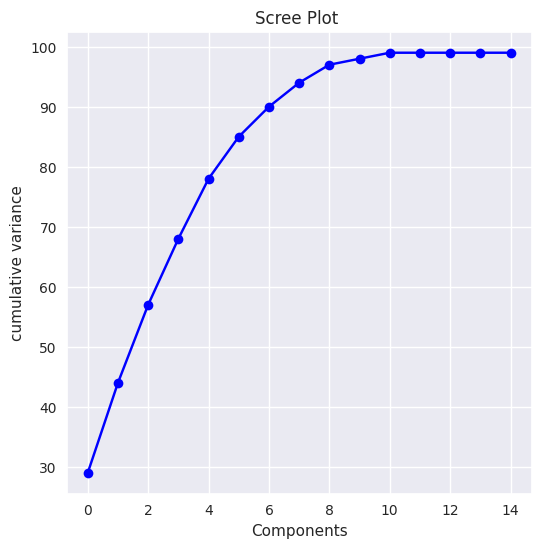

In [ ]:
#plotting scree plot 
plt.figure(figsize=(6,6))
plt.plot(cum_var,color = 'blue',marker = 'o')
plt.title('Scree Plot ')
plt.xlabel('Components')
plt.ylabel('cumulative variance')
plt.show()

In [ ]:
#selecting our top 3 features
pca_2 = PCA(n_components= 3)
pca_final2 = pd.DataFrame(pca_2.fit_transform(df_final_minmax2),columns=['pc1','pc2','pc3'])
pca_final2

,pc1,pc2,pc3
0,1.636621,-0.628758,-0.536065
1,-0.636041,-0.622715,-0.093013
2,0.751201,-0.649572,-0.154024
3,-0.286233,-0.840296,-0.236606
4,-0.288819,0.632328,-0.009665
...,...,...,...
2224,-0.128282,-0.681570,0.223981
2225,-1.618386,0.780879,1.659694
2226,1.337646,-0.533911,-0.065168
2227,-0.192684,0.718173,0.094682


- KMEANS On Min-max Scaler




Elbow plot for PCA


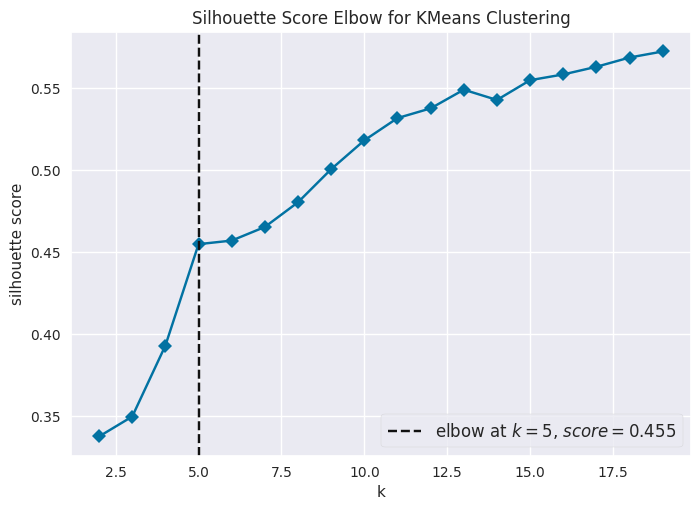

In [ ]:
#visualizing silhouette score with Kelbow visualizer 
model = KMeans(random_state=0,max_iter=500,init = 'k-means++')
visualizer = KElbowVisualizer(model,k =(2,20),metric = 'silhouette',timings = False)
print('Elbow plot for PCA')
visualizer.fit(pca_final2)
visualizer.show()
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.33775367122595357
For n_clusters = 3 The average silhouette_score is : 0.3499102511063136
For n_clusters = 4 The average silhouette_score is : 0.39318292178237924
For n_clusters = 5 The average silhouette_score is : 0.45501840107709696
For n_clusters = 6 The average silhouette_score is : 0.45719717803065013
For n_clusters = 7 The average silhouette_score is : 0.4655029303441874
For n_clusters = 8 The average silhouette_score is : 0.4805616425921935
For n_clusters = 9 The average silhouette_score is : 0.5007455280388918


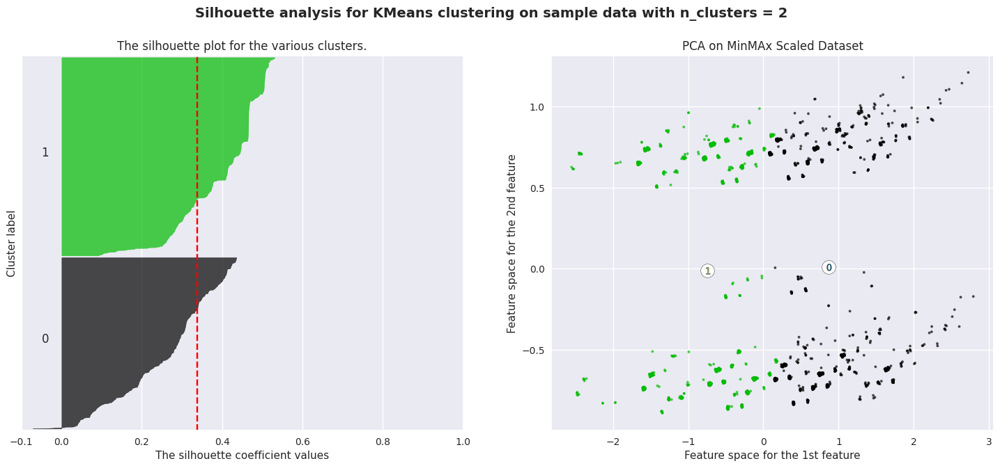

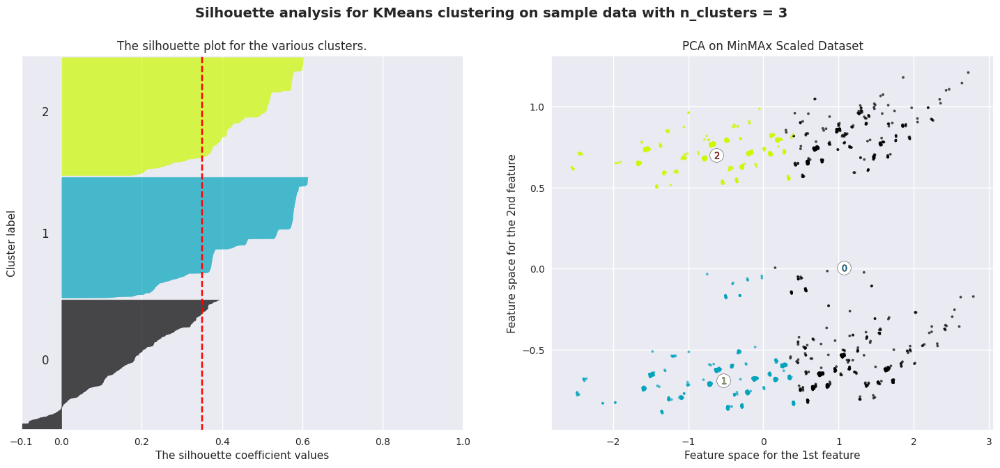

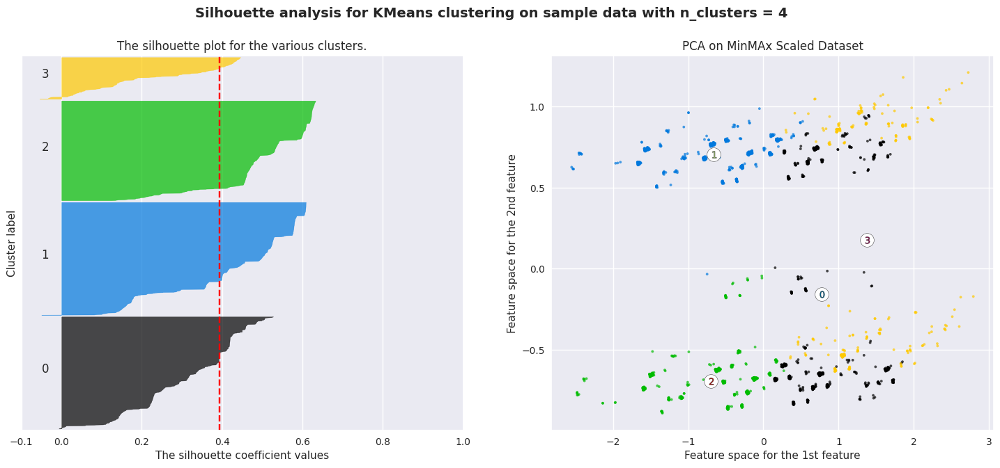

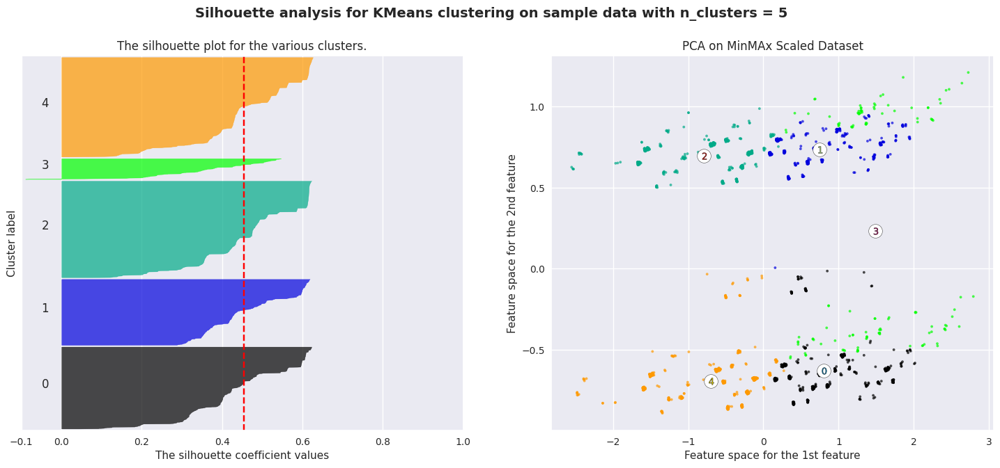

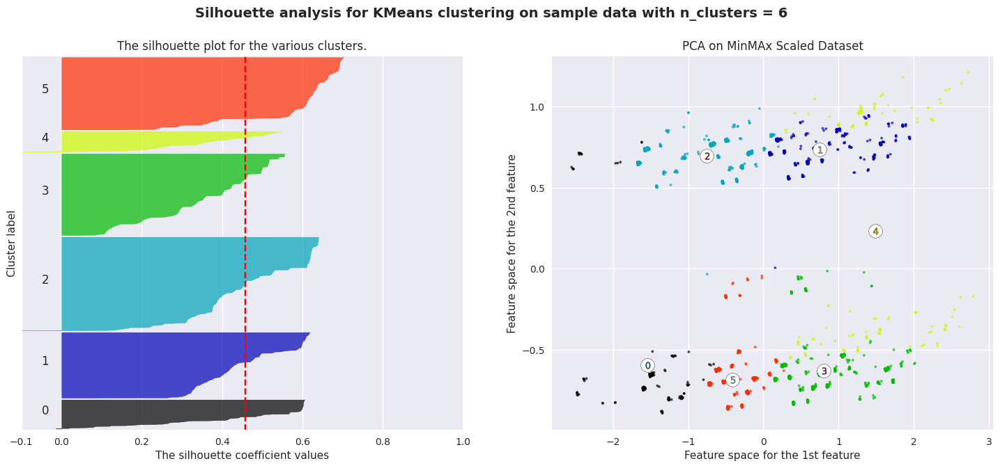

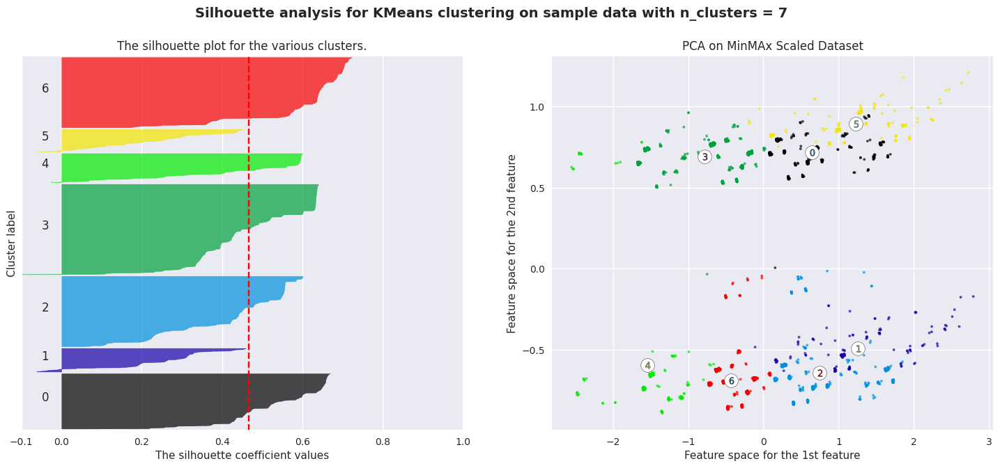

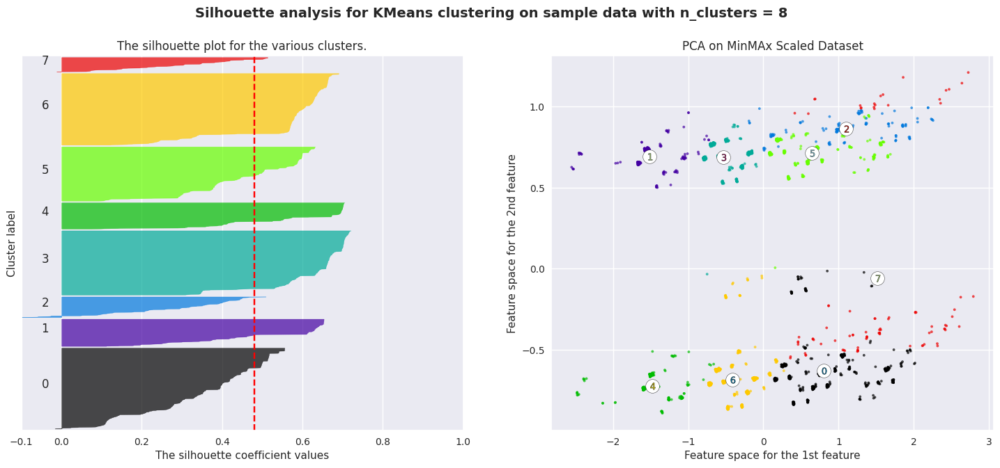

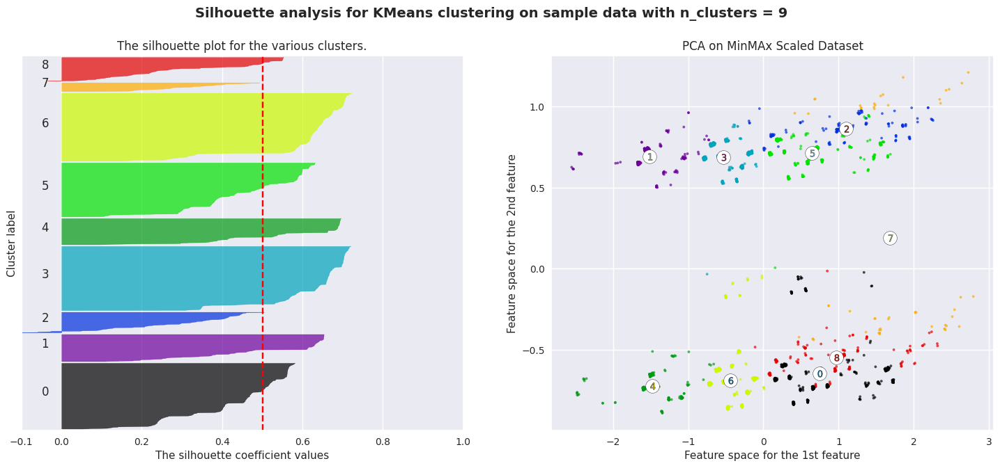

In [ ]:
#using the sklearn library to view the clusters 
range_n_clusters = [2,3,4,5,6,7,8,9]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(pca_final2) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels = clusterer.fit_predict(pca_final2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(pca_final2, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(pca_final2, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(pca_final2.iloc[:,0], pca_final2.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:,0], centers[:,1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("PCA on MinMAx Scaled Dataset")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

In [ ]:
#fitting our kmeans Algorithm 
model_kmeans = KMeans(n_clusters=5,random_state=0,init ='k-means++')
kmeans_pred = model_kmeans.fit_predict(pca_final2)

In [ ]:
#checking with our labels 
model_kmeans.labels_

array([0, 4, 0, ..., 0, 2, 2], dtype=int32)

In [ ]:
#checking with centroids of the clusters 
model_kmeans.cluster_centers_

array([[ 0.80508495, -0.63085465, -0.31514185],
       [ 0.74961607,  0.73612095, -0.43689358],
       [-0.79374443,  0.69666664,  0.04141545],
       [ 1.48718116,  0.23543239,  1.78982819],
       [-0.70066715, -0.69330887,  0.13521526]])

In [ ]:
#checking wiht inertia the lower the inertia denser the clusters
model_kmeans.inertia_

1150.5460510219743

In [ ]:
#labeling our cluster to our original dataset 
df_final_minmax2['kmeans_label_min'] = model_kmeans.labels_

Text(0.5, 1.0, 'KMEANS min max Classification')

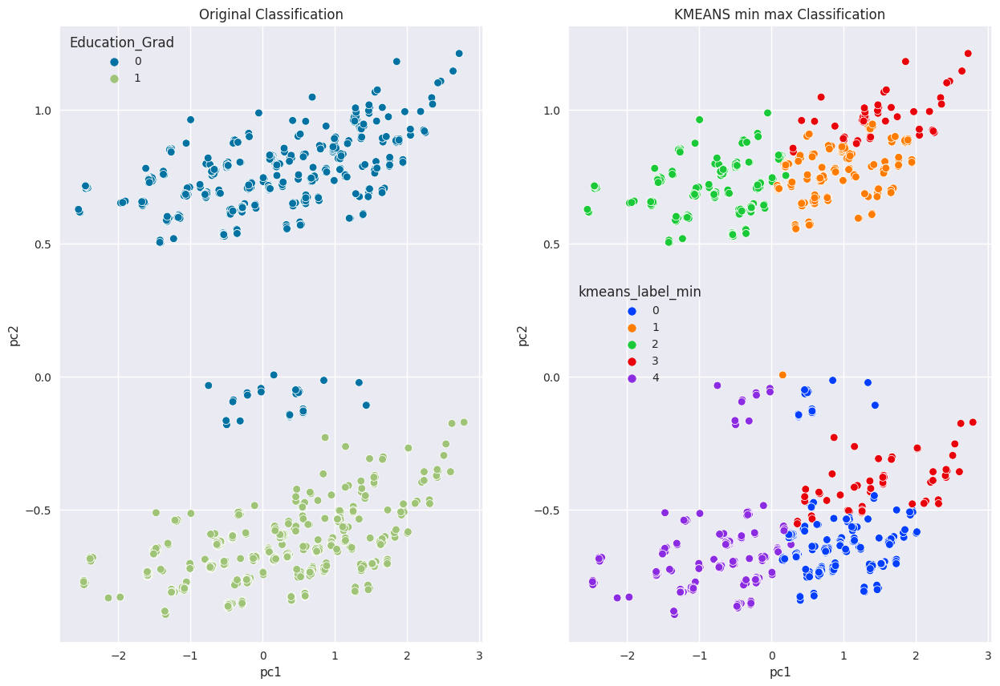

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final2.iloc[:,0],y =  pca_final2.iloc[:,1],data =  df_final_minmax2,hue =  df_final_minmax2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final2.iloc[:,0],y =  pca_final2.iloc[:,1],data =  df_final_minmax2,hue = df_final_minmax2['kmeans_label_min'],
               palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('KMEANS min max Classification')

In [ ]:
# Group data by Clusters (K=2)
df_final_minmax2.groupby('kmeans_label_min').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
kmeans_label_min,,,,,,,,,,,,,,,
0,0.349626,0.516732,0.193613,1.774451,0.213573,0.271457,0.487026,0.027944,0.239521,0.333333,0.303393,0.123752,0.938124,0.000000,0.061876
1,0.387558,0.523935,0.208437,1.741935,0.111663,0.344913,0.481390,0.062035,0.183623,0.347395,0.317618,0.151365,0.000000,0.997519,0.002481
2,0.314781,0.464572,0.154237,3.313559,0.130508,0.611864,0.255932,0.001695,0.076271,0.466102,0.325424,0.132203,0.000000,1.000000,0.000000
3,0.491851,0.494982,2.519685,1.874016,0.000000,0.055118,0.653543,0.291339,0.267717,0.377953,0.196850,0.157480,0.535433,0.464567,0.000000
4,0.314527,0.528210,0.121711,3.294408,0.220395,0.529605,0.246711,0.003289,0.118421,0.500000,0.309211,0.072368,0.963816,0.000000,0.036184


# Hierarchial Clustering 

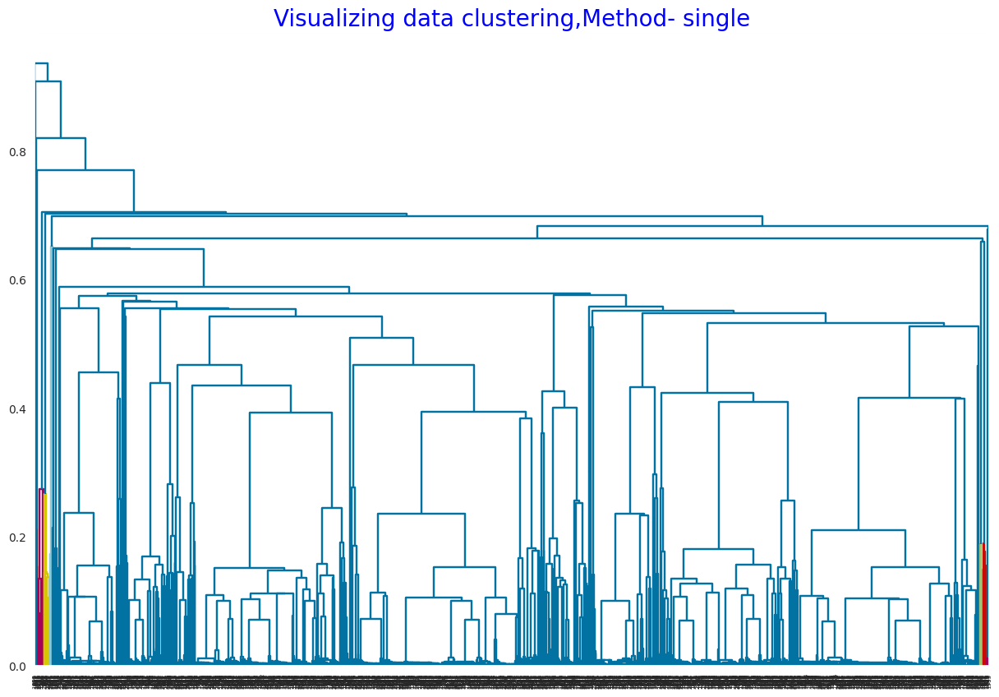

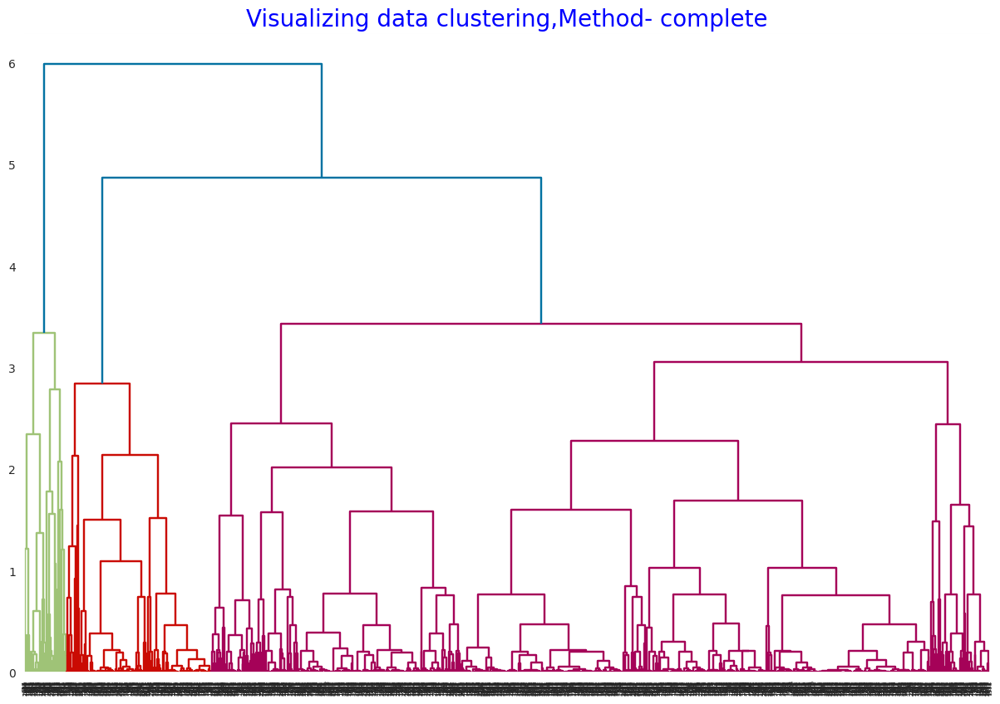

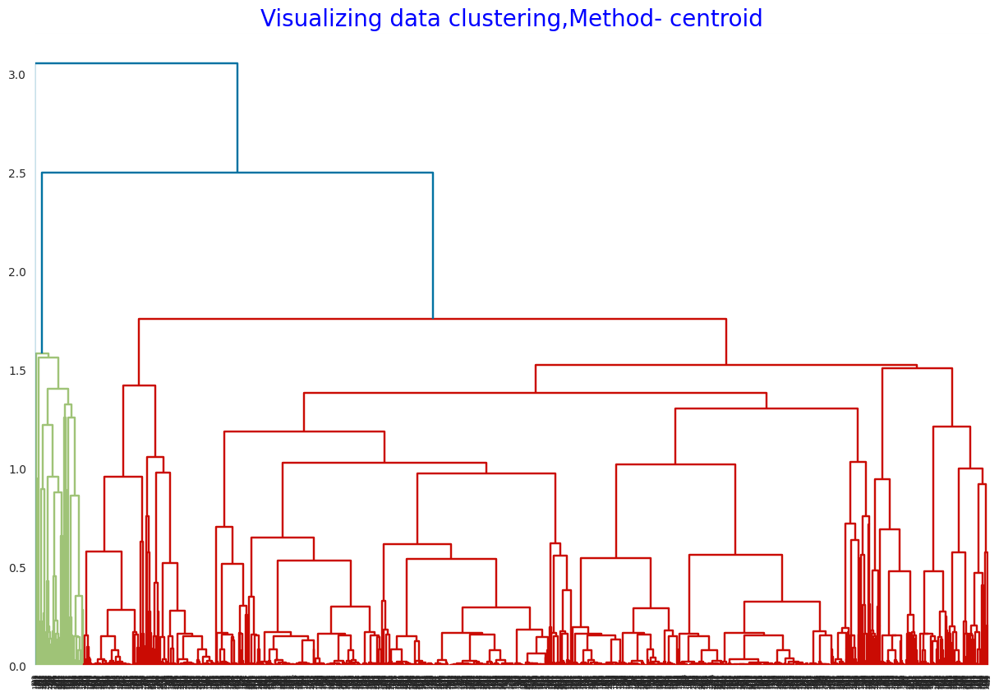

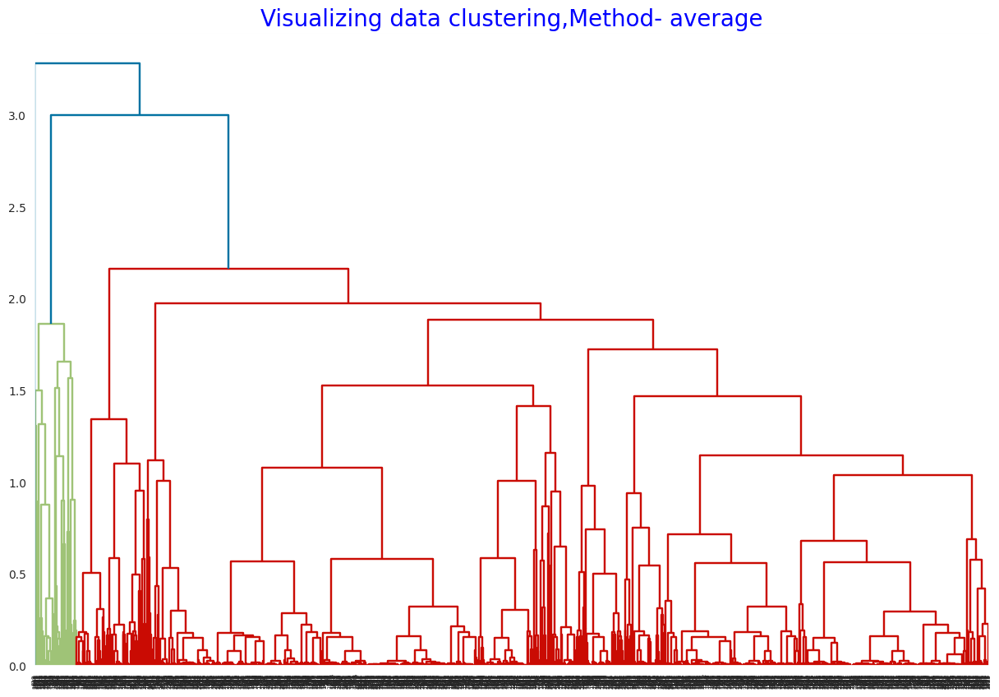

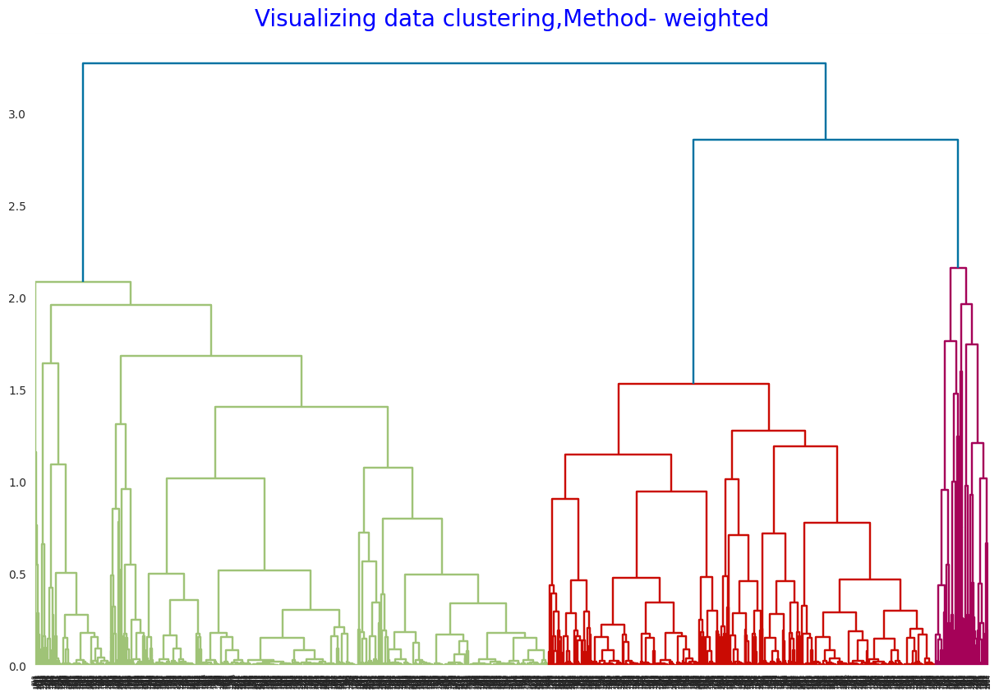

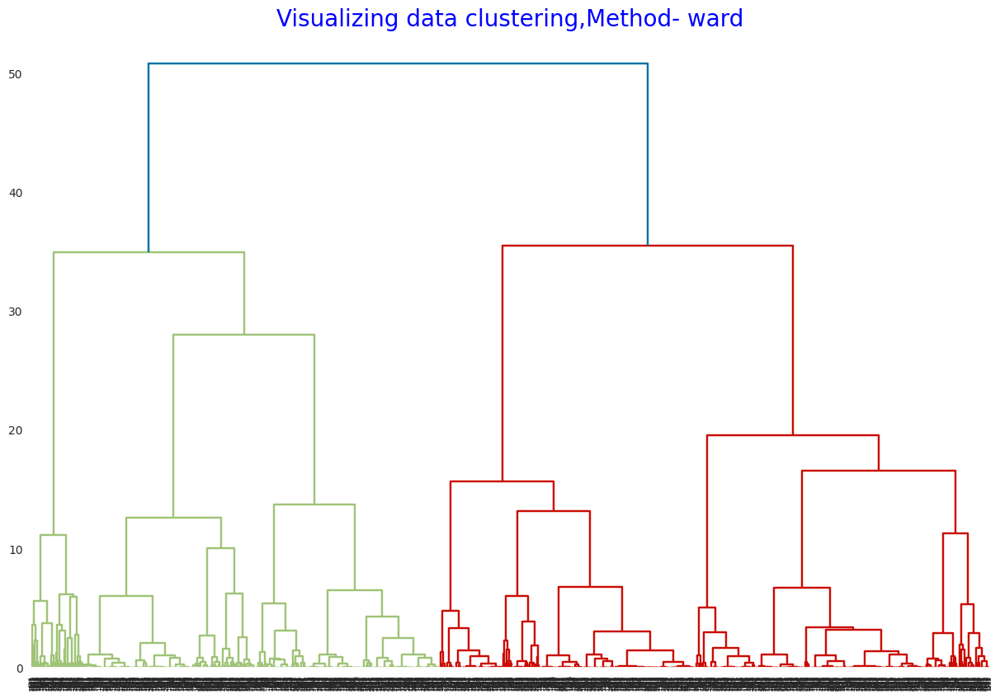

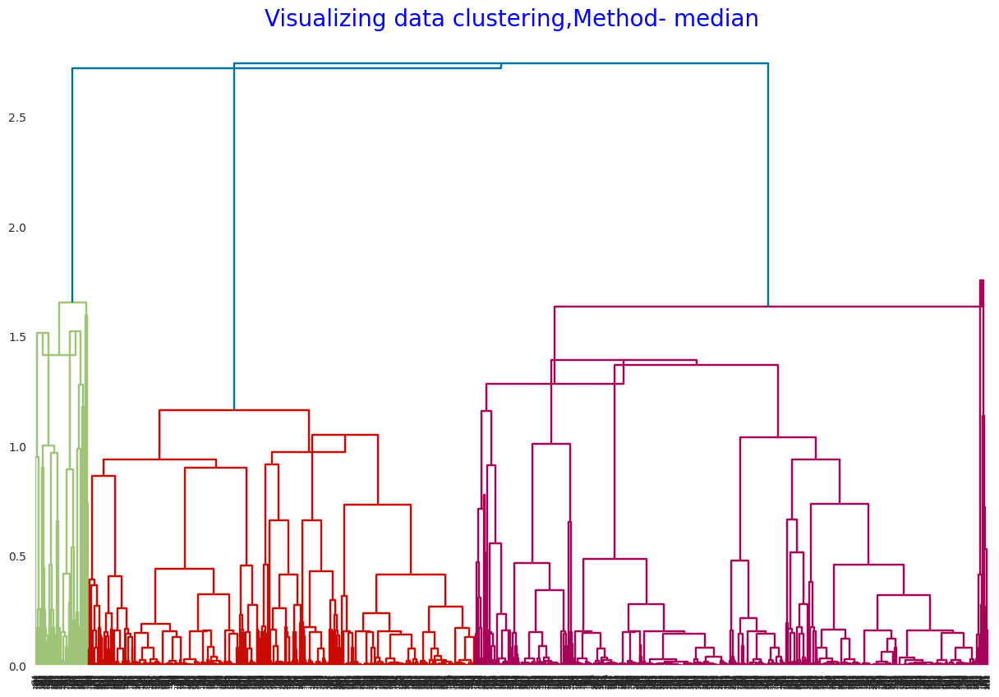

In [ ]:
for methods in ['single','complete','centroid','average','weighted','ward','median']:
  plt.figure(figsize = (15,10))
  dict = {'fontsize':20,'fontweight':12,'color':'blue'}
  plt.title('Visualizing data clustering,Method- {}'.format(methods),fontdict=dict)
  Dendrogram = sch.dendrogram(sch.linkage(pca_final2,method=methods,optimal_ordering=False))


In [ ]:
# Applying Different Linkages using Euclidean Method for distance Calculation
n_clusters = [2,3,4,5,6,7,8]
for n_clusters in n_clusters:
  for linkages in ["complete","average","single","ward"]:
    for affinities in ["euclidean","l1","l2","manhattan","cosine"]:

      hie_cluster2 = AgglomerativeClustering(n_clusters = n_clusters, linkage = linkages)
      hie_labels2 = hie_cluster2.fit_predict(pca_final2)
      silhouette_score1 = silhouette_score(pca_final2,hie_labels2)
      print("For n_clusters =", n_clusters,"The average silhouette_score with linkage-",linkages,"and Affinity-",affinities,':',silhouette_score1)
      print()


For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- euclidean : 0.44451534525707775

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l1 : 0.44451534525707775

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- l2 : 0.44451534525707775

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- manhattan : 0.44451534525707775

For n_clusters = 2 The average silhouette_score with linkage- complete and Affinity- cosine : 0.44451534525707775

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- euclidean : 0.4459759720197553

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l1 : 0.4459759720197553

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- l2 : 0.4459759720197553

For n_clusters = 2 The average silhouette_score with linkage- average and Affinity- manhattan

- Observation

With Minmax Scaler For n_clusters = 3 The average silhouette_score with linkage- single and Affinity- l2 : 0.51

In [ ]:
#Fitting our agglomerative clustering with optimal Parameters 
agg_clus = AgglomerativeClustering(n_clusters = 3,linkage = 'single',affinity='manhattan')
pred_hie2 = agg_clus.fit_predict(pca_final2)
print(pred_hie2.shape)
pred_hie2

(2229,)


array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
#calculating our silhouette score
(silhouette_score(pca_final2, agg_clus.labels_)*100).round(3)

51.872

In [ ]:
#fitting our labels on our dataframe
df_final_minmax2['hie_labels'] = agg_clus.labels_

In [ ]:
# Group data by Clusters 
df_final_minmax2.groupby('hie_labels').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_min
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
hie_labels,,,,,,,,,,,,,,,,
0,0.345609,0.505936,0.293801,2.596137,0.163073,0.433513,0.368823,0.034591,0.154987,0.419587,0.306379,0.119048,0.504043,0.471698,0.024259,1.9708
1,0.511628,0.773963,4.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,3.0000
2,0.465116,0.576538,4.000000,3.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,3.0000


Text(0.5, 1.0, 'Agglomerative Classification')

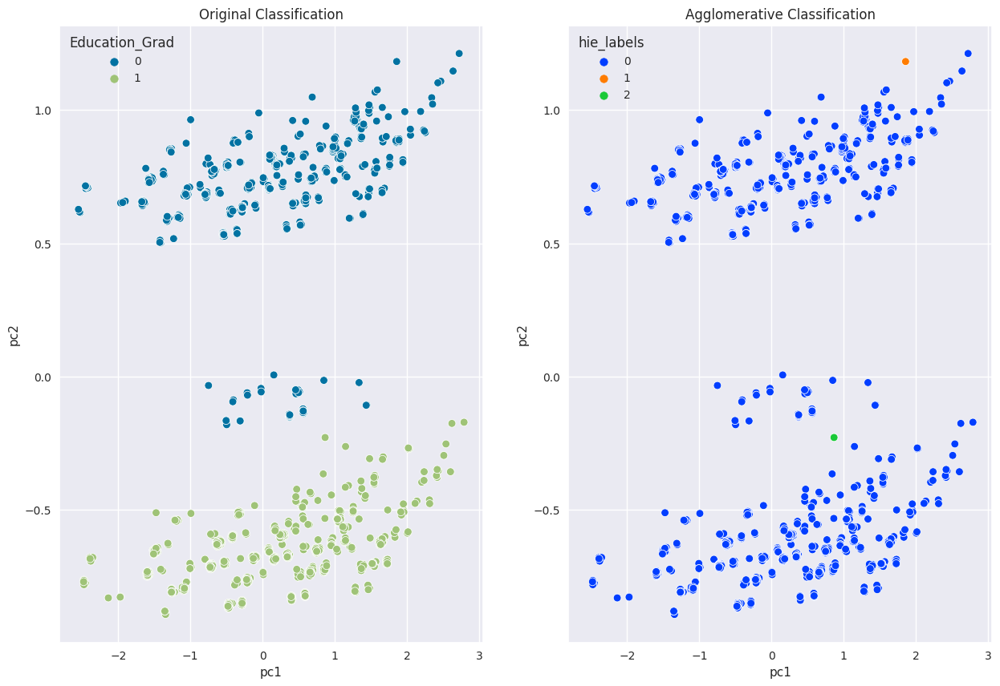

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final2.iloc[:,0],y = pca_final2.iloc[:,1],data = df_final_minmax2,hue = df_final_minmax2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final2.iloc[:,0],y = pca_final2.iloc[:,1],data = df_final_minmax2,hue = df_final_minmax2['hie_labels'],
               palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('Agglomerative Classification')

# Density Based Clustering (DBSCANS) on MinMax Scaler

In [ ]:
#converting our pca to numpy
X = pca_final2.to_numpy()

In [ ]:
#defining our parameters 
epsilons = np.linspace(0.01,1,num = 15)
min_samples = np.arange(2,20,step = 3)
combinations = list(product(epsilons,min_samples))
n = len(combinations)


In [ ]:
#defining our parameters with manual fuction and gridsearching for best parameters 
def get_scores_and_labels(combinations, X):
  scores = []
  all_labels_list = []

  for i, (eps, num_samples) in enumerate(combinations):
    dbscan_cluster_model = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
    labels = dbscan_cluster_model.labels_
    labels_set = set(labels)
    num_clusters = len(labels_set)
    if -1 in labels_set:
      num_clusters -= 1
    
    if (num_clusters < 2) or (num_clusters > 10):
      scores.append(-10)
      all_labels_list.append('bad')
      c = (eps, num_samples)
      print(f"Combination {c} on iteration {i+1} of {n} has {num_clusters} clusters. Moving on")
      continue
    
    scores.append(silhouette_score(X, labels))
    all_labels_list.append(labels)
    print(f"Index: {i}, Score: {scores[-1]}, Labels: {all_labels_list[-1]}, NumClusters: {num_clusters}")

  best_index = np.argmax(scores)
  best_parameters = combinations[best_index]
  best_labels = all_labels_list[best_index]
  best_score = scores[best_index]

  return {'best_epsilon': best_parameters[0],
          'best_min_samples': best_parameters[1], 
          'best_labels': best_labels,
          'best_score': best_score}

best_dict = get_scores_and_labels(combinations, X)

Combination (0.01, 2) on iteration 1 of 90 has 198 clusters. Moving on
Combination (0.01, 5) on iteration 2 of 90 has 75 clusters. Moving on
Combination (0.01, 8) on iteration 3 of 90 has 51 clusters. Moving on
Combination (0.01, 11) on iteration 4 of 90 has 34 clusters. Moving on
Combination (0.01, 14) on iteration 5 of 90 has 25 clusters. Moving on
Combination (0.01, 17) on iteration 6 of 90 has 23 clusters. Moving on
Combination (0.08071428571428571, 2) on iteration 7 of 90 has 165 clusters. Moving on
Combination (0.08071428571428571, 5) on iteration 8 of 90 has 89 clusters. Moving on
Combination (0.08071428571428571, 8) on iteration 9 of 90 has 64 clusters. Moving on
Combination (0.08071428571428571, 11) on iteration 10 of 90 has 48 clusters. Moving on
Combination (0.08071428571428571, 14) on iteration 11 of 90 has 41 clusters. Moving on
Combination (0.08071428571428571, 17) on iteration 12 of 90 has 35 clusters. Moving on
Combination (0.15142857142857144, 2) on iteration 13 of 90 

In [ ]:
#locating our best parameters for dbscans 
best_dict

{'best_epsilon': 0.8585714285714285,
 'best_min_samples': 2,
 'best_labels': array([0, 0, 0, ..., 0, 0, 0]),
 'best_score': 0.5187166644639329}

In [ ]:
#fitting our dbscan optimal parameters 
dbscan = DBSCAN(eps = 0.85,min_samples=2)
dbscan.fit(pca_final2)

DBSCAN(eps=0.85, min_samples=2)

In [ ]:
#checking with labels 
dbscan.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
#adding the labels to our dataframe 
df_final_minmax2['dbscan_labels'] = dbscan.labels_

In [ ]:
df_final_minmax2.groupby('dbscan_labels').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_min,hie_labels
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
dbscan_labels,,,,,,,,,,,,,,,,,
-1,0.511628,0.773963,4.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,3.0000,1.0
0,0.345609,0.505936,0.293801,2.596137,0.163073,0.433513,0.368823,0.034591,0.154987,0.419587,0.306379,0.119048,0.504043,0.471698,0.024259,1.9708,0.0
1,0.465116,0.576538,4.000000,3.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,3.0000,2.0


Text(0.5, 1.0, 'DBSCAN Classification')

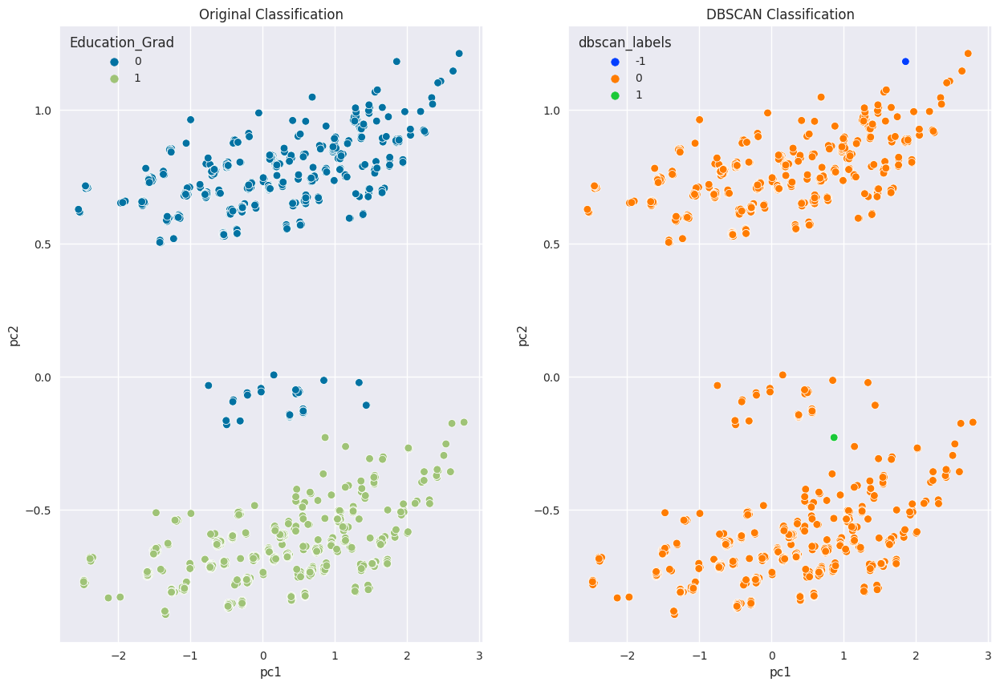

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = pca_final2.iloc[:,0],y = pca_final2.iloc[:,1],data = df_final_minmax2,hue = df_final_minmax2['Education_Grad'])
sn.scatterplot(ax = ax[1],x = pca_final2.iloc[:,0],y = pca_final2.iloc[:,1],data = df_final_minmax2,hue = df_final_minmax2['dbscan_labels'],palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('DBSCAN Classification')

# KPrototypes  ALgorithm

In [ ]:
df_cust6.head()

,Purchases,day_engaged,Acceptance,Income_Category,Customer_Segment,Family,Education
0,25,849,0,upper_middle,Boomer,1,Grad
1,6,299,0,middle,Boomer,3,Grad
2,21,498,0,upper_middle,Boomer,2,Grad
3,8,325,0,lower,Millennial,3,Grad
4,19,347,0,upper_middle,Gen X,3,PostGrad


In [ ]:
df_cust6.dtypes

Purchases              int64
day_engaged            int64
Acceptance             int64
Income_Category     category
Customer_Segment    category
Family                 int64
Education             object
dtype: object

In [ ]:
#importing kmodes library 
from kmodes.kprototypes import KPrototypes

In [ ]:
#converting our string to categorical variable
df_cust6['Education'] = df_cust6['Education'].astype('category')

In [ ]:
#saving our data into array 
array = df_cust6.values

In [ ]:
#converting our integer types to float 
array[:,0] = array[:,0].astype(float)
array[:,1] = array[:,1].astype(float)
array[:,2] = array[:,2].astype(float)
array[:,5] = array[:,5].astype(float)

In [ ]:
array

array([[25.0, 849.0, 0.0, ..., 'Boomer', 1.0, 'Grad'],
       [6.0, 299.0, 0.0, ..., 'Boomer', 3.0, 'Grad'],
       [21.0, 498.0, 0.0, ..., 'Boomer', 2.0, 'Grad'],
       ...,
       [19.0, 341.0, 1.0, ..., 'Gen X', 1.0, 'Grad'],
       [23.0, 342.0, 0.0, ..., 'Boomer', 3.0, 'PostGrad'],
       [11.0, 808.0, 0.0, ..., 'Boomer', 4.0, 'PostGrad']], dtype=object)

In [ ]:
#locating optimal clusters with optimal k value 
cost = []
for cluster in range(1,10):
  try:
    k_pro = KPrototypes(n_clusters=cluster,init = 'huang',random_state=0)
    k_pro.fit_predict(array,categorical = [3,4,6])
    cost.append(k_pro.cost_)
    print('cluster initiation: {}'.format(cluster))
  except:
    break
    

cluster initiation: 1
cluster initiation: 2
cluster initiation: 3
cluster initiation: 4
cluster initiation: 5
cluster initiation: 6
cluster initiation: 7
cluster initiation: 8
cluster initiation: 9


<function matplotlib.pyplot.show(close=None, block=None)>

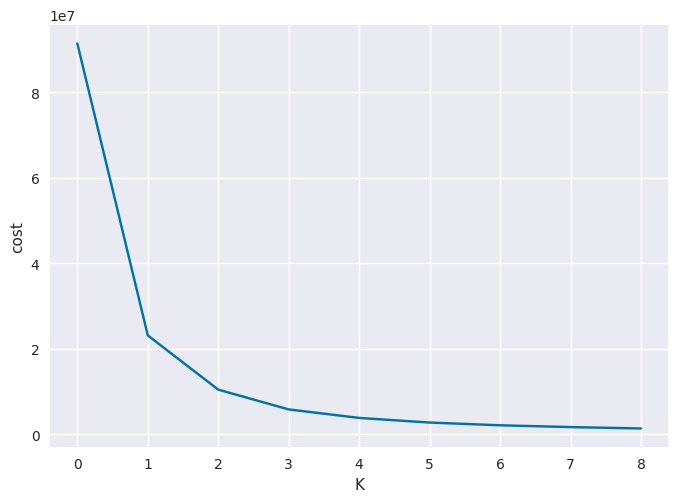

In [ ]:
#plotting the elbow plot 
plt.plot(cost)
plt.xlabel('K')
plt.ylabel('cost')
plt.show


In [ ]:
#locating clusters with k = 3 
from kneed import KneeLocator
cost_knee_c3 = KneeLocator(x = range(1,10),y = cost,S = 0.1,curve = 'convex',direction='decreasing',online = True)

k_cost_c3 = cost_knee_c3.elbow
print("elbow at k = ",f'{k_cost_c3:0f} clusters')


elbow at k =  3.000000 clusters


In [ ]:
#fitting our clusters with optimal clusters 
k_prot = KPrototypes(n_clusters= 3,init='huang',random_state=0)
df_cust6['k_pro_labels'] = k_prot.fit_predict(array,categorical = [3,4,6])

In [ ]:
#locating centroids 
k_prot.cluster_centroids_

array([['16.6485084306096', '768.1880674448768', '0.29571984435797666',
        '2.5603112840466924', 'middle', 'Gen X', 'Grad'],
       ['13.080459770114942', '298.1048850574713', '0.3175287356321839',
        '2.603448275862069', 'middle', 'Gen X', 'PostGrad'],
       ['14.702099737532809', '529.4094488188977', '0.2847769028871391',
        '2.625984251968504', 'middle', 'Gen X', 'PostGrad']], dtype='<U32')

In [ ]:
#computing labels 
k_prot.labels_

array([0, 1, 2, ..., 1, 1, 0], dtype=uint16)

Text(0.5, 1.0, 'Kprototype Classification')

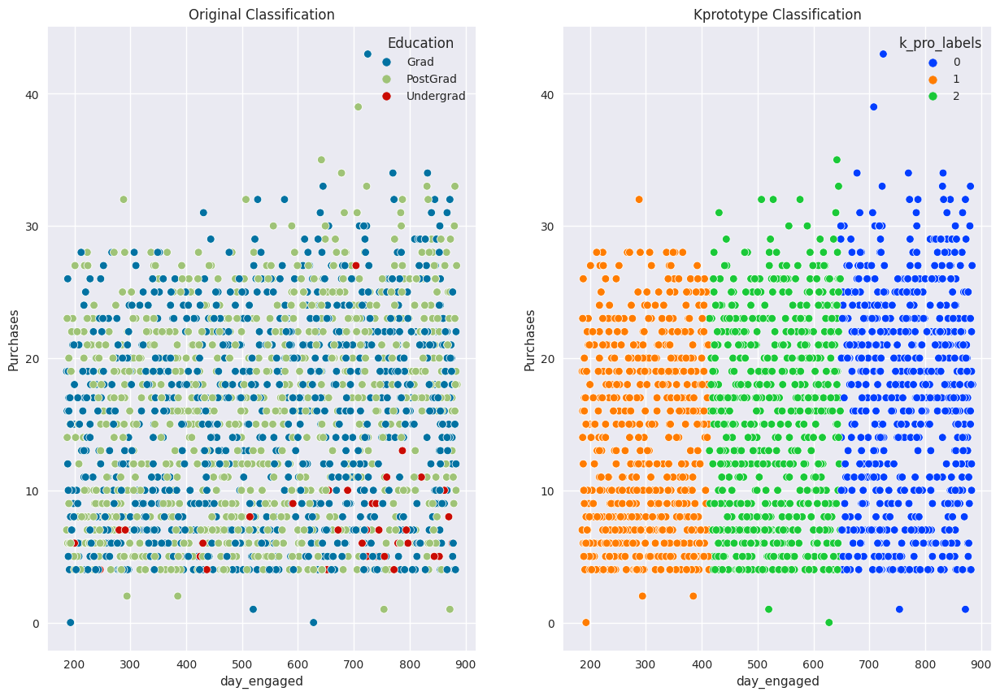

In [ ]:
#plotting with with the labels 
fig,ax = plt.subplots(ncols = 2 ,figsize = (15,10))
sn.scatterplot(ax = ax[0],x = 'day_engaged',y = 'Purchases',data = df_cust6,hue = 'Education')
sn.scatterplot(ax = ax[1], x = 'day_engaged',y = 'Purchases',data = df_cust6,hue = 'k_pro_labels',palette = 'bright')
ax[0].set_title('Original Classification')
ax[1].set_title('Kprototype Classification')

In [ ]:
#checking with the average 
df_cust6.groupby('k_pro_labels').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family
,mean,mean,mean,mean
k_pro_labels,,,,
0,16.648508,768.188067,0.295720,2.560311
1,13.080460,298.104885,0.317529,2.603448
2,14.702100,529.409449,0.284777,2.625984


<Axes: >

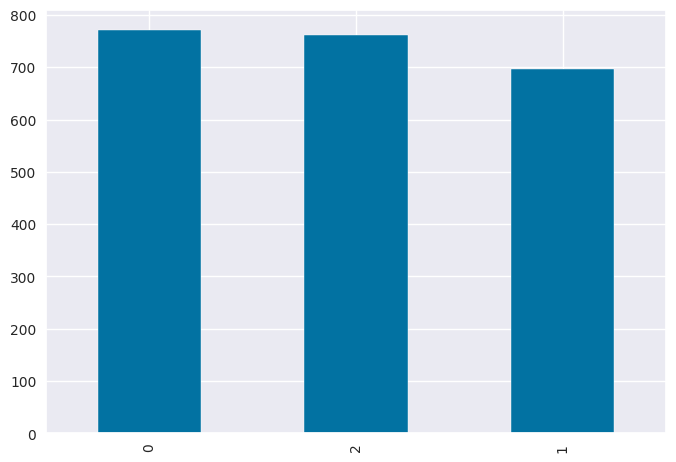

In [ ]:
df_cust6['k_pro_labels'].value_counts().plot(kind = 'bar')

In [ ]:
df_cust6.groupby('k_pro_labels').agg(lambda x: pd.Series.mode(x).iat[0])[['Income_Category','Customer_Segment','Education','Family','Purchases',
                                                                          'day_engaged']]

,Income_Category,Customer_Segment,Education,Family,Purchases,day_engaged
k_pro_labels,,,,,,
0,middle,Gen X,Grad,3,16,853
1,middle,Gen X,PostGrad,3,7,234
2,middle,Gen X,PostGrad,3,5,499


# Model Evaluation

 - After all observation and application different unsupervised on different types of scaling we observe that we are getting good results with kmeans on standard scaler and we will use kmeans with standard scaler for evaluating models 

In [ ]:
#extracting our csv file 
df_csv = df_final2.drop(['hie_labels','dbscan_labels'],axis = 1)
df_csv.to_csv('clustering.csv')

In [ ]:
#building our model for classification 
df_cust7 = df_cust6.copy()
df_cust7 = pd.get_dummies(data =df_cust7,columns=['Income_Category','Customer_Segment','Education'])

In [ ]:
#attaching our kmeans model to our new dataframe 
df_cust7.drop(['k_pro_labels'],axis = 1,inplace = True)
df_cust7['clusters'] = model_kmeans2.labels_

In [ ]:
df_cust7

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,clusters
0,25,849,0,1,0,0,1,0,0,0,1,0,1,0,0,2
1,6,299,0,3,0,1,0,0,0,0,1,0,1,0,0,1
2,21,498,0,2,0,0,1,0,0,0,1,0,1,0,0,0
3,8,325,0,3,1,0,0,0,1,0,0,0,1,0,0,1
4,19,347,0,3,0,0,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,18,567,0,3,0,0,1,0,0,0,1,0,1,0,0,2
2225,22,205,1,5,0,0,1,0,0,0,0,1,0,1,0,0
2226,19,341,1,1,0,1,0,0,0,1,0,0,1,0,0,0
2227,23,342,0,3,0,0,1,0,0,0,1,0,0,1,0,0


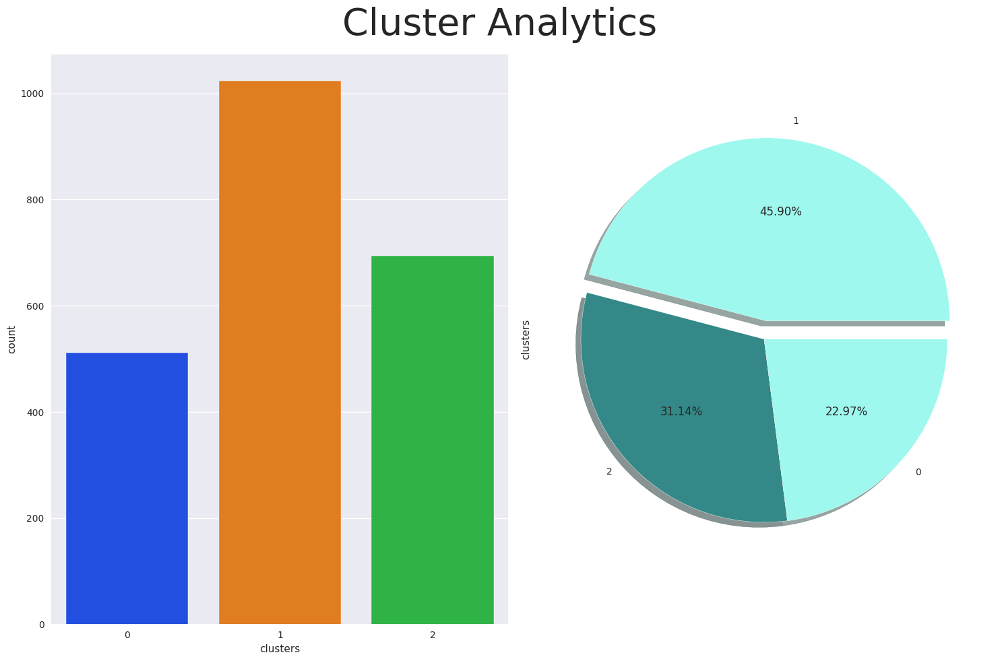

In [ ]:
#checking with the distribution of clusters 
fig,ax = plt.subplots(1,2,figsize = (15,10))
sn.countplot(ax = ax [0],x = df_cust7['clusters'],palette = 'bright') 
colors =['#9EF8EE','#348888']
fig.suptitle('Cluster Analytics',fontsize = 40)
df_cust7.clusters.value_counts().plot(ax = ax [1],kind ='pie', autopct= '%.2f%%',shadow=True,explode = [0.1,0.0,0.0],colors=colors)
plt.tight_layout()

- Observation 
We observe  that the frequency is highest in cluster 2 while cluster 3 is moderately lower compared to cluster 2 and cluster1 being lowest

In [ ]:
#checking with our second cluster
df_final2[df_final2['kmeans_label_std2']==0]

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std,kmeans_label_std2,kmeans_label_std3,hie_labels,dbscan_labels
2,0.804543,-0.206611,0,2,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0
4,0.542092,-0.953384,0,3,0,0,1,0,0,1,0,0,0,1,0,1,0,1,0,0
5,0.935768,-0.300576,0,3,0,0,1,0,0,0,1,0,0,1,0,1,0,4,0,0
12,0.148416,-0.631926,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0
13,0.017191,-0.631926,0,3,0,0,1,0,0,0,0,1,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2211,0.804543,0.030774,2,1,0,0,1,0,1,0,0,0,0,1,0,1,0,3,0,0
2214,0.935768,-0.903929,1,2,0,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0
2225,0.935768,-1.655648,1,5,0,0,1,0,0,0,0,1,0,1,0,1,0,1,0,0
2226,0.542092,-0.983057,1,1,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0


In [ ]:
#checking with our second cluster
df_final2[df_final2['kmeans_label_std2']==1]

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std,kmeans_label_std2,kmeans_label_std3,hie_labels,dbscan_labels
1,-1.163838,-1.190769,0,3,0,1,0,0,0,0,1,0,1,0,0,0,1,2,0,0
3,-0.901387,-1.062186,0,3,1,0,0,0,1,0,0,0,1,0,0,0,1,2,0,0
7,-0.638936,0.312668,0,3,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0
8,-1.163838,0.169248,0,3,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0
9,-1.688739,-1.215497,1,4,1,0,0,0,0,0,0,1,0,1,0,0,1,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2219,-1.032612,-1.541901,0,4,1,0,0,0,0,1,0,0,1,0,0,0,1,2,0,0
2220,-0.770162,0.574780,1,2,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0
2222,-1.426289,1.618285,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0
2223,-1.426289,0.045610,0,3,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0


In [ ]:
#checking with our third cluster
df_final2[df_final2['kmeans_label_std2']==2]

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std,kmeans_label_std2,kmeans_label_std3,hie_labels,dbscan_labels
0,1.329444,1.529265,0,1,0,0,1,0,0,0,1,0,1,0,0,1,2,3,0,0
6,0.804543,1.183079,0,2,0,1,0,0,0,1,0,0,1,0,0,1,2,3,0,0
15,1.460670,1.128678,2,1,0,0,1,0,0,0,0,1,0,1,0,1,2,3,0,0
17,-0.245260,1.549047,0,2,0,1,0,0,0,0,0,1,1,0,0,1,2,0,0,0
18,1.460670,0.515434,1,3,0,0,1,0,0,0,0,1,0,1,0,1,2,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2215,0.935768,1.420464,0,4,0,0,1,0,0,1,0,0,1,0,0,1,2,4,0,0
2216,1.460670,0.535216,0,4,0,0,1,0,0,1,0,0,1,0,0,1,2,4,0,0
2217,0.542092,0.639072,0,2,0,0,1,0,0,0,1,0,1,0,0,1,2,3,0,0
2221,1.591895,1.598502,0,1,0,1,0,0,0,1,0,0,0,1,0,1,2,3,0,0


In [ ]:
#attaching our kmeans model to our new dataframe 
df_cust7.drop(['k_pro_labels'],axis = 1,inplace = True)
df_cust7['clusters'] = model_kmeans2.labels_

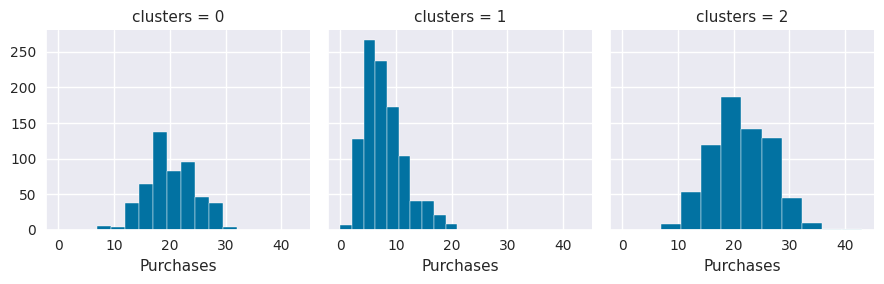

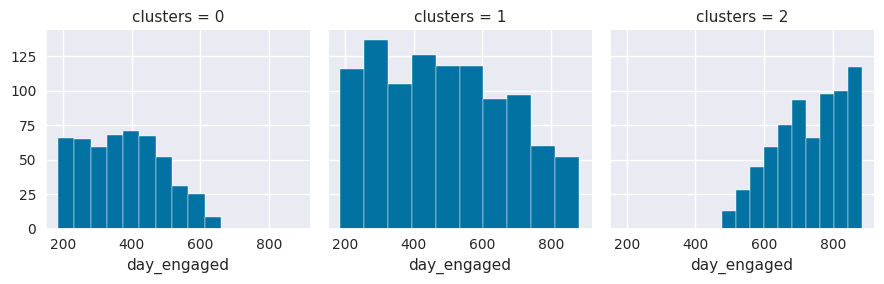

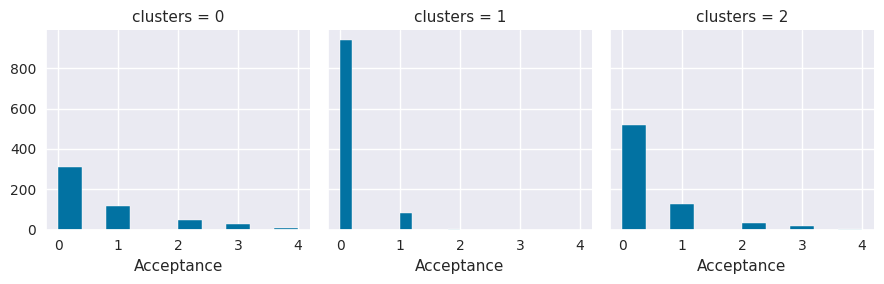

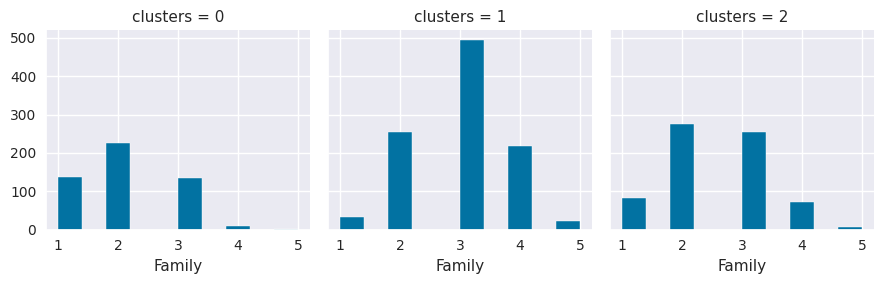

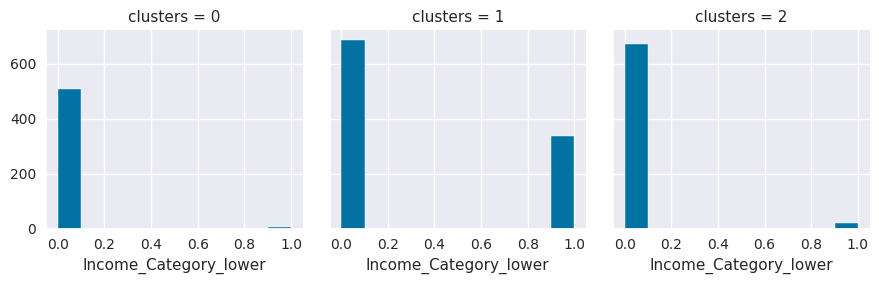

...

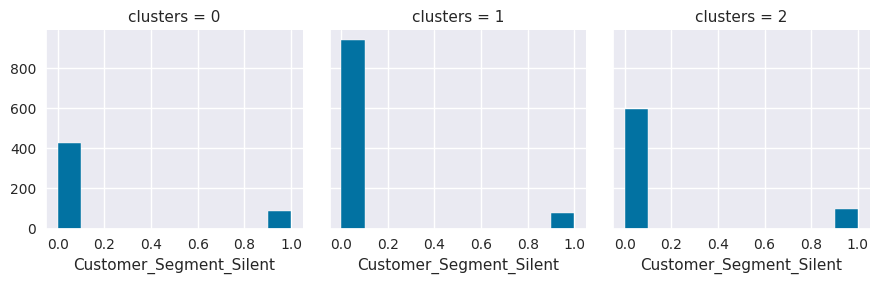

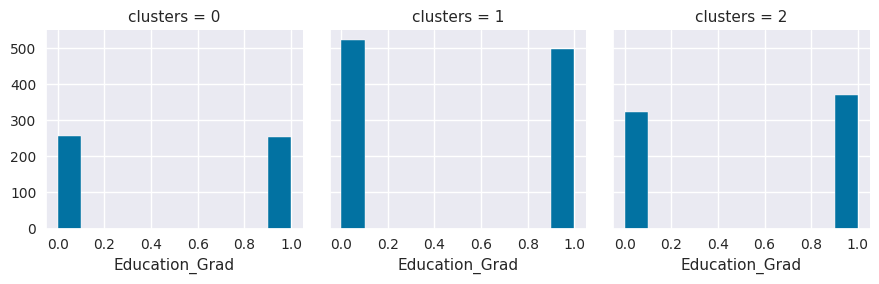

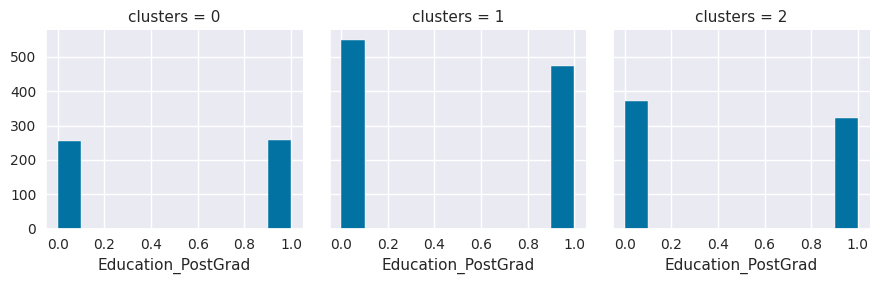

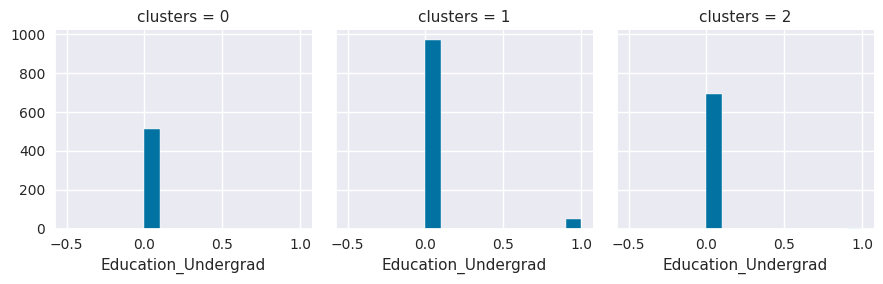

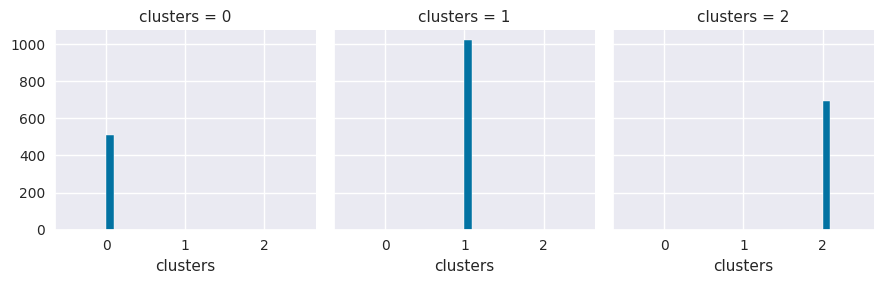

In [ ]:
#checking with the distribution of clusters according to customer characteristics 
for d in df_cust7:
  grid = sn.FacetGrid(df_cust7,col = 'clusters')
  grid = grid.map(plt.hist,d )
  plt.show()

<Axes: xlabel='Acceptance', ylabel='count'>

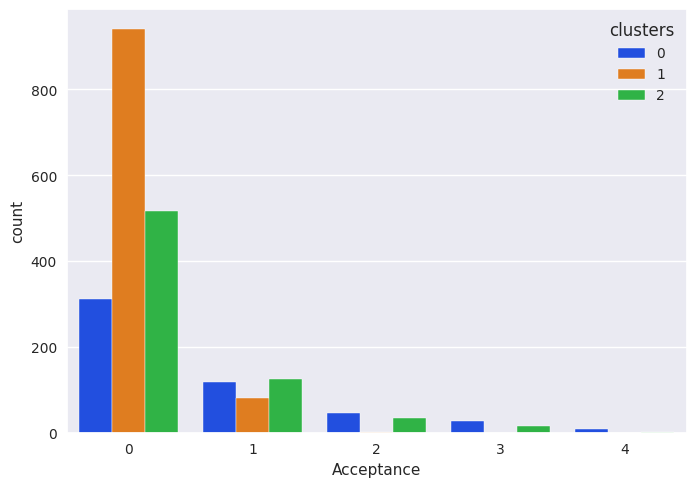

In [ ]:
#plotting with clusters with customers accepted the offers 
sn.countplot(data = df_cust7,x = 'Acceptance',hue = 'clusters',palette = 'bright')

 - Observation

 We can observe that the response with the first campaign response has been the best with cluster 2, with moderate response to the cluster 3 with cluster 1 being lowest, but as we go ahead the interaction of customers with every cluster in the campaign offers has been dropping and in the fifth campaign the interaction has been least 

<Axes: xlabel='Family', ylabel='Purchases'>

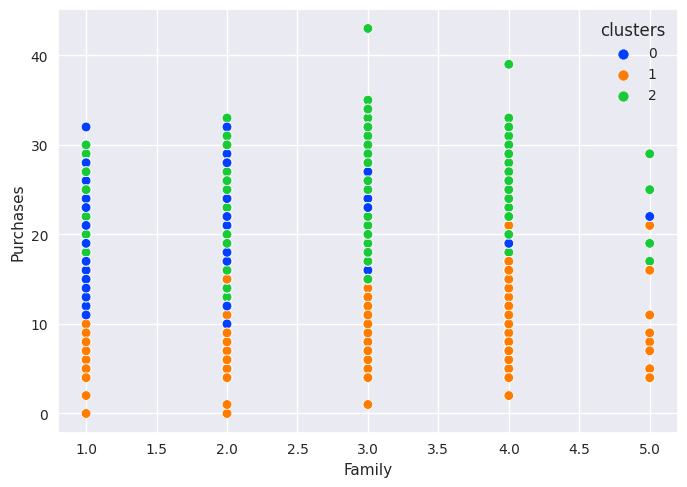

In [ ]:
#plotting with clusters with customers with members in the Family
sn.scatterplot(data = df_cust7,x = 'Family',y = 'Purchases',hue = 'clusters',palette = 'bright')

 - Observation
  
 we observe that a family that have members above 4 are less in numbers and have the least interaction to purchases with the company , the average highest purchases are done by members in the family between 2 - 3 range 

<Axes: xlabel='Income_Category_upper', ylabel='Purchases'>

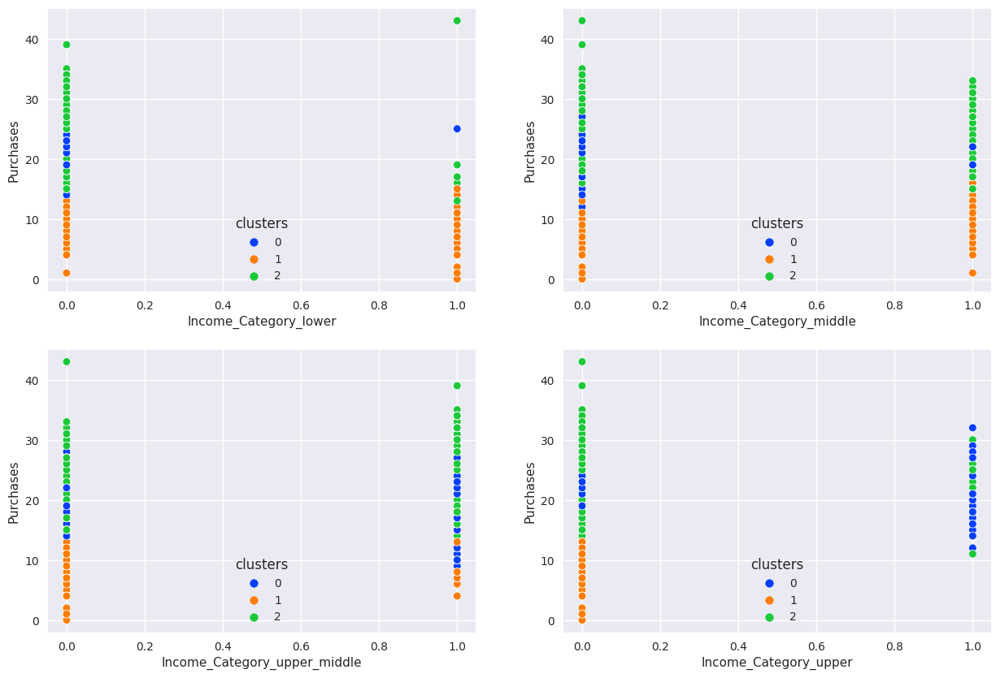

In [ ]:
#evaluating purchases according to income categories 
fig,ax = plt.subplots(nrows = 2,ncols = 2,figsize = (15,10))
sn.scatterplot(ax = ax [0,0],data = df_cust7,x =  'Income_Category_lower',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [0,1],data = df_cust7,x =   'Income_Category_middle',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [1,0],data = df_cust7,x =  'Income_Category_upper_middle',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [1,1],data = df_cust7,x =   'Income_Category_upper',y = 'Purchases',hue = 'clusters',palette = 'bright')

 - Observation

 -In this we observe that most of our customers are from middle and upper middle class backgrounds with surplus purchases on products and if we observe the clusters they are placed also accordingly 

 - Secondly we observe that purchases of products are least with the customer backgrounds with lower and upper class, this could be the reson for the price of the product for customers with lower income and to upper class it might be they are not happy with the price set for product and feel that products are overpriced



<Axes: xlabel='Customer_Segment_Silent', ylabel='Purchases'>

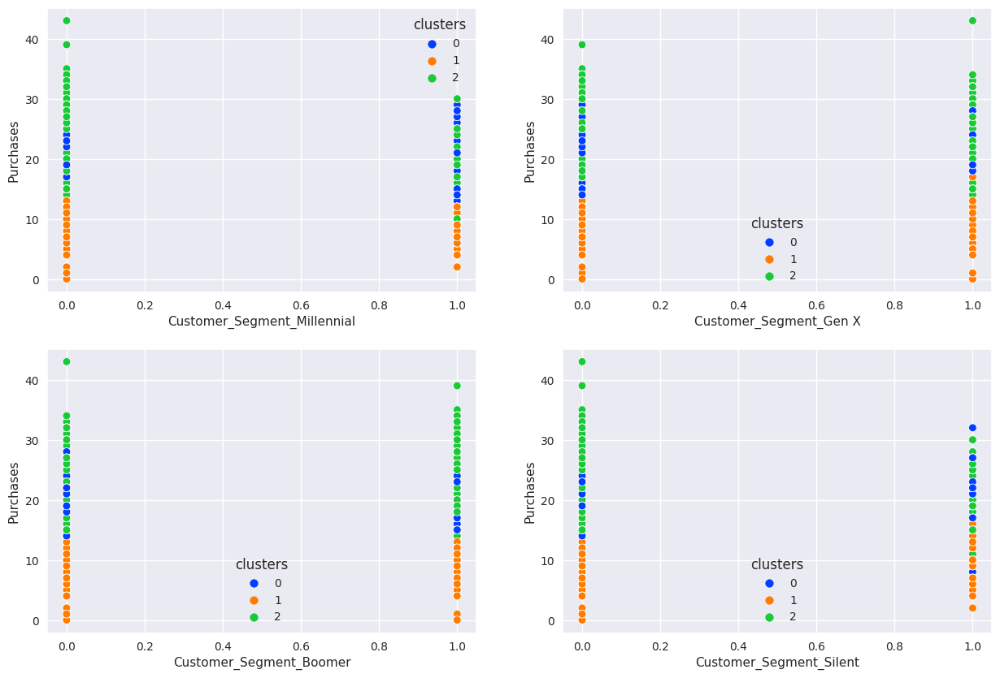

In [ ]:
#evaluating purchases according to age categories 
fig,ax = plt.subplots(nrows = 2,ncols = 2,figsize = (15,10))
sn.scatterplot(ax = ax [0,0],data = df_cust7,x =  'Customer_Segment_Millennial',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [0,1],data = df_cust7,x =    'Customer_Segment_Gen X',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [1,0],data = df_cust7,x =   'Customer_Segment_Boomer',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [1,1],data = df_cust7,x =   'Customer_Segment_Silent',y = 'Purchases',hue = 'clusters',palette = 'bright')

 - Observation

 - When it comes to age groups we observe that most of the customers with highest Purchases are from GenX to Boomers category of age, we have a potential that these people mostly be interest in household products.

 - we also observe that customers who are in age category millennials and silent have moderate purchases to the products so this indicates that these groups might just be very particular and have no association with other products 


<Axes: xlabel='Education_Undergrad', ylabel='Purchases'>

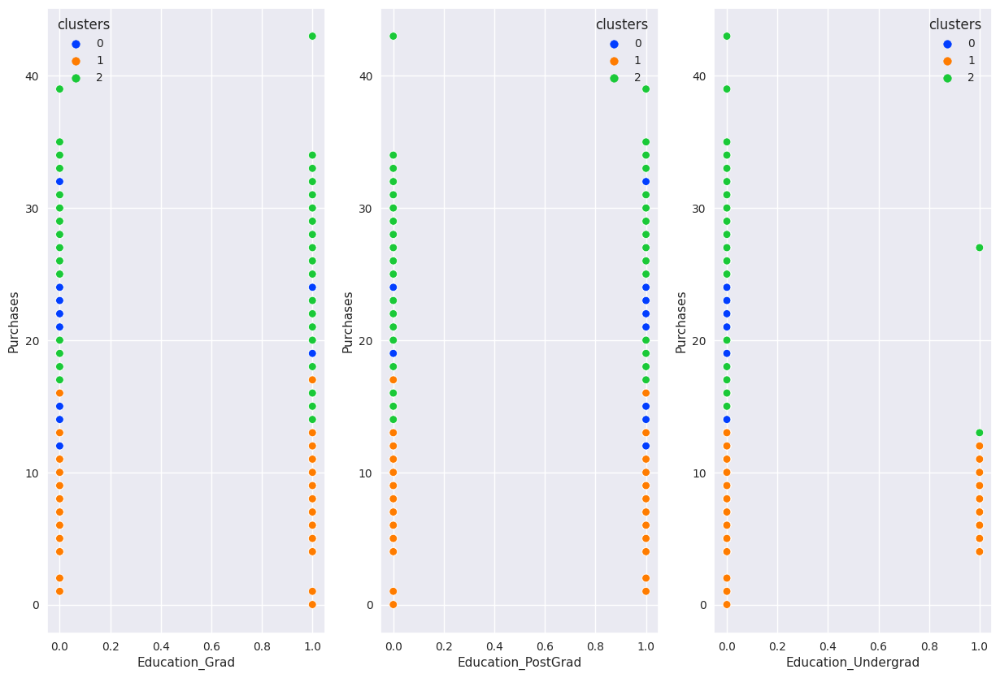

In [ ]:
#evaluating purchases according to age categories 
fig,ax = plt.subplots(ncols = 3,figsize = (15,10))
sn.scatterplot(ax = ax [0],data = df_cust7,x = 'Education_Grad',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [1],data = df_cust7,x =     'Education_PostGrad',y = 'Purchases',hue = 'clusters',palette = 'bright')
sn.scatterplot(ax = ax [2],data = df_cust7,x =   'Education_Undergrad',y = 'Purchases',hue = 'clusters',palette = 'bright')


 - Observation

  when it comes to educaation categories we observe that most of the purchases are done by customers with higher education compared to customers who are just in their undergraduation 

 - Conclusion With Clusters

In [ ]:
# Group data by Clusters (K=3)
df_final2.groupby('kmeans_label_std2').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,kmeans_label_std,kmeans_label_std3,hie_labels,dbscan_labels
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
kmeans_label_std2,,,,,,,,,,,,,,,,,,,
0,0.669473,-0.808438,0.644531,2.044922,0.011719,0.082031,0.810547,0.095703,0.154297,0.341797,0.335938,0.167969,0.498047,0.501953,0.000000,0.917969,1.304688,0.000000,0.000000
1,-0.898052,-0.240045,0.083089,2.940371,0.328446,0.645161,0.026393,0.000000,0.183773,0.485826,0.252199,0.078201,0.487781,0.462366,0.049853,0.001955,1.243402,0.000000,0.001955
2,0.829880,0.950269,0.361671,2.495677,0.030259,0.378963,0.547550,0.043228,0.112392,0.377522,0.367435,0.142651,0.533141,0.462536,0.004323,0.891931,3.168588,0.001441,-0.001441


## Cluster 1
- In the first cluster we observe that the purchases are moderate with least customers engaged on all days with the company but have highest acceptance to campaign offers and mostly they come from upper  middle  class background,most of them fall in the age groups of Gen X and and Boomers with higher background of education.

## Cluster 2 
- In the second cluster we observe that the purchases are lowest and moderately less customers engaged on all days with the company and the acceptance ratio to offers or campaigns is lesser compared to first cluster,most of the customers are from lower and middle class and most of them fall in the age category of Gen X and Boomers having higher education background ,we can also say that most of the families are having members near to 3

## Cluster 3
- In the third cluster we observe that the purchases are highest with most of our customers engaged with the company on daily basis and have a moderate acceptance to any offers or campaigns, in the third cluster we observe that most of the customer come from lower, middle and upper middle class and even in this cluster most of them fall in the age categories of GenX and  Boomers with highest education qualification.



## Summary

We can conclude after observing all clusters are middle and upper middle class and lie in the age groups from Gen X to Boomers and these category of customers comprise 80% of our segmentation of our company and marketing product n this sector would benefit the company

# Davies-Bouldin index 

The davies_bouldin_score function from the sklearn.metrics module computes the Davies-Bouldin index for a given set of data and labels. The index is calculated as the average similarity between each cluster and its most similar cluster, divided by the average similarity between each cluster and its most dissimilar cluster. The resulting score ranges from 0 to infinity, with lower values indicating better clustering.





In [ ]:
from sklearn.metrics import davies_bouldin_score

# X is the data matrix
# k is the number of clusters
kmeans = KMeans(n_clusters=3, random_state=0).fit(df_final2)
labels = kmeans.labels_

# Calculate Davies-Bouldin index
db_index = davies_bouldin_score(df_final2, labels)
print("The Davies-Bouldin index is:", db_index)

The Davies-Bouldin index is: 1.4292756813952237


# Model Building 


In [ ]:
#building our model for classification 
df_cust7 = df_cust6.copy()
df_cust7 = pd.get_dummies(data =df_cust7,columns=['Income_Category','Customer_Segment','Education'])

In [ ]:
df_cust7.head()

,Purchases,day_engaged,Acceptance,Family,k_pro_labels,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad
0,25,849,0,1,0,0,0,1,0,0,0,1,0,1,0,0
1,6,299,0,3,1,0,1,0,0,0,0,1,0,1,0,0
2,21,498,0,2,2,0,0,1,0,0,0,1,0,1,0,0
3,8,325,0,3,1,1,0,0,0,1,0,0,0,1,0,0
4,19,347,0,3,1,0,0,1,0,0,1,0,0,0,1,0


In [ ]:
#attaching our kmeans model to our new dataframe 
df_cust7.drop(['k_pro_labels'],axis = 1,inplace = True)


In [ ]:
#checking with the shape of the data
df_cust7.shape

(2229, 16)

In [ ]:
#checking the data 
df_cust7

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,clusters
0,25,849,0,1,0,0,1,0,0,0,1,0,1,0,0,2
1,6,299,0,3,0,1,0,0,0,0,1,0,1,0,0,1
2,21,498,0,2,0,0,1,0,0,0,1,0,1,0,0,0
3,8,325,0,3,1,0,0,0,1,0,0,0,1,0,0,1
4,19,347,0,3,0,0,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,18,567,0,3,0,0,1,0,0,0,1,0,1,0,0,2
2225,22,205,1,5,0,0,1,0,0,0,0,1,0,1,0,0
2226,19,341,1,1,0,1,0,0,0,1,0,0,1,0,0,0
2227,23,342,0,3,0,0,1,0,0,0,1,0,0,1,0,0


In [ ]:
# Group data by Clusters (K=3)
df_cust7.groupby('clusters').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
clusters,,,,,,,,,,,,,,,
0,19.970703,376.308594,0.644531,2.044922,0.011719,0.082031,0.810547,0.095703,0.154297,0.341797,0.335938,0.167969,0.498047,0.501953,0.000000
1,8.025415,491.239492,0.083089,2.940371,0.328446,0.645161,0.026393,0.000000,0.183773,0.485826,0.252199,0.078201,0.487781,0.462366,0.049853
2,21.193084,731.925072,0.361671,2.495677,0.030259,0.378963,0.547550,0.043228,0.112392,0.377522,0.367435,0.142651,0.533141,0.462536,0.004323


# Model Classification

In [ ]:
final_df = df_cust7.copy().drop(['clusters'],axis = 1)

In [ ]:
final_df.shape

(2229, 15)

In [ ]:
final_df.head()

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad
0,25,849,0,1,0,0,1,0,0,0,1,0,1,0,0
1,6,299,0,3,0,1,0,0,0,0,1,0,1,0,0
2,21,498,0,2,0,0,1,0,0,0,1,0,1,0,0
3,8,325,0,3,1,0,0,0,1,0,0,0,1,0,0
4,19,347,0,3,0,0,1,0,0,1,0,0,0,1,0


In [ ]:
#splitting our variable into independent and dependent variables 
X = pca_final.iloc[:,[0,1]].values
y = model_kmeans2.labels_

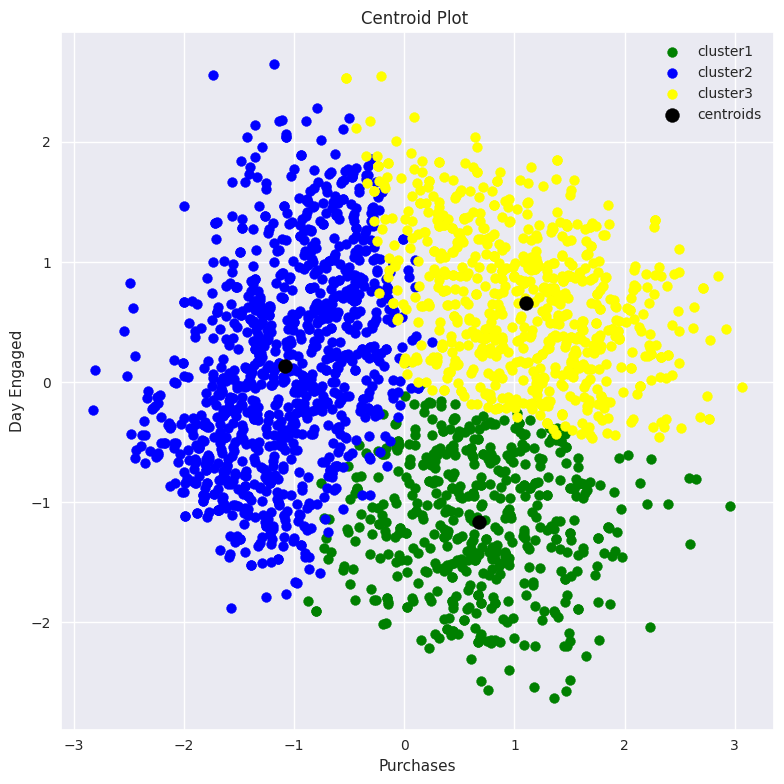

In [ ]:
#plotting our kmeans centroids on pca  with standard scaler
plt.figure(figsize = (8,8))
plt.scatter( X[y==0,0],  X[y==0,1],s = 50 ,c = 'green',label = 'cluster1')
plt.scatter(X[y==1,0],X[y==1,1],s = 50 ,c = 'blue',label = 'cluster2')
plt.scatter(X[y==2,0],X[y==2,1],s = 50 ,c = 'yellow',label = 'cluster3')


#plot the centroids 
plt.scatter(model_kmeans2.cluster_centers_[:,0],model_kmeans2.cluster_centers_[:,1],s = 100,c = 'black',label = 'centroids')
plt.title("Centroid Plot ")
plt.xlabel("Purchases")
plt.ylabel("Day Engaged")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
final_model = KMeans(n_clusters=3,init ='k-means++',random_state=0)
preds_km = final_model.fit_predict(final_df)
preds_km

array([2, 1, 0, ..., 1, 1, 2], dtype=int32)

In [ ]:
#splitting our variable into independent and dependent variables 
X = final_df.iloc[:,[0,1]].values
y = model_kmeans2.labels_

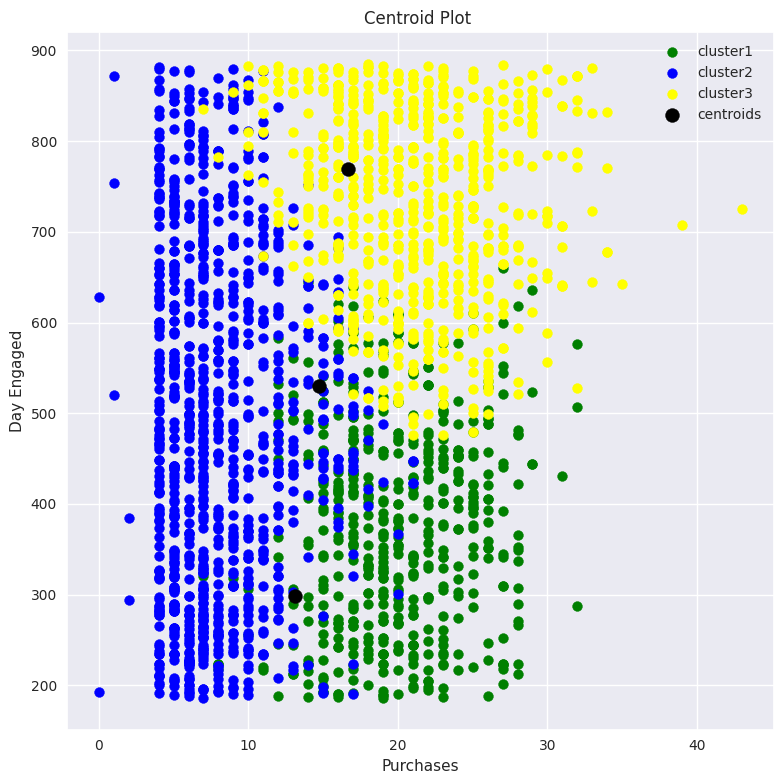

In [ ]:
#plotting our centroids 
plt.figure(figsize = (8,8))
plt.scatter( X[y==0,0],  X[y==0,1],s = 50 ,c = 'green',label = 'cluster1')
plt.scatter(X[y==1,0],X[y==1,1],s = 50 ,c = 'blue',label = 'cluster2')
plt.scatter(X[y==2,0],X[y==2,1],s = 50 ,c = 'yellow',label = 'cluster3')


#plot the centroids for kmeans with original dataset 
plt.scatter(final_model.cluster_centers_[:,0],final_model.cluster_centers_[:,1],s = 100,c = 'black',label = 'centroids')
plt.title("Centroid Plot ")
plt.xlabel("Purchases")
plt.ylabel("Day Engaged")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
#attaching our clusters to labels 
final_df['clusters'] = final_model.labels_

In [ ]:
# Group data by Clusters (K=3)
final_df.groupby('clusters').agg(['mean'])

,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad
,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
clusters,,,,,,,,,,,,,,,
0,14.733596,530.334646,0.284777,2.624672,0.152231,0.451444,0.366142,0.030184,0.145669,0.426509,0.299213,0.128609,0.490814,0.497375,0.011811
1,13.088698,298.602289,0.316166,2.605150,0.153076,0.417740,0.386266,0.042918,0.150215,0.422031,0.307582,0.120172,0.487840,0.494993,0.017167
2,16.623698,768.653646,0.296875,2.559896,0.182292,0.428385,0.355469,0.033854,0.167969,0.408854,0.315104,0.108073,0.532552,0.424479,0.042969


In [ ]:
final_df.head()


,Purchases,day_engaged,Acceptance,Family,Income_Category_lower,Income_Category_middle,Income_Category_upper_middle,Income_Category_upper,Customer_Segment_Millennial,Customer_Segment_Gen X,Customer_Segment_Boomer,Customer_Segment_Silent,Education_Grad,Education_PostGrad,Education_Undergrad,clusters
0,25,849,0,1,0,0,1,0,0,0,1,0,1,0,0,2
1,6,299,0,3,0,1,0,0,0,0,1,0,1,0,0,1
2,21,498,0,2,0,0,1,0,0,0,1,0,1,0,0,0
3,8,325,0,3,1,0,0,0,1,0,0,0,1,0,0,1
4,19,347,0,3,0,0,1,0,0,1,0,0,0,1,0,1


# Saving the Model for future Predictions

In [ ]:
import pickle

In [ ]:
filename = 'final_model.sav'
pickle.dump(final_model,open(filename,'wb'))

In [ ]:
#load the model from disk 
loaded_model = pickle.load(open(filename,'rb'))


In [ ]:
#saving our excel file 
final_df.to_csv("clustering_final.csv")

# Making a Predictive System

In [ ]:
input_data = ( 25 ,849,	0	,1,	0,	0,	1,	0,	0,	0, 1,	0,	1,	0,	0)

input_data_array = np.asarray(input_data)

input_data_reshape = input_data_array.reshape(1,-1)

prediction = loaded_model.predict(input_data_reshape)
print(prediction)

if (prediction[0]==0):
  print(' the purchases are moderate with least customers engaged on all days with the company but have highest acceptance to campaign offers and mostly they come from upper class background,most of them fall in the age groups of Gen X and and Boomers with higher background of education')
elif(prediction[0]==1):
  print( 'the purchases are lowest and moderately less customers engaged on all days with the company and the acceptance ratio to offers or campaigns is lesser compared to first cluster,most of the customers are from lower and middle class and most of them fall in the age category of Gen X and Boomers having higher education background ,we can also say that most of the families are having members near to 3')
else:
  print(' the purchases are highest with most of our customers engaged with the company on daily basis and have a moderate acceptance to any offers or campaigns, in the third cluster we observe that most of the customer come from middle and upper middle class and even in this cluster most of them fall in the age categories of GenX and  Boomers with highest education qualification')


[2]
 the purchases are highest with most of our customers engaged with the company on daily basis and have a moderate acceptance to any offers or campaigns, in the third cluster we observe that most of the customer come from middle and upper middle class and even in this cluster most of them fall in the age categories of GenX and  Boomers with highest education qualification


In [ ]:
#saving our dataframe for bivariate plots 
df_cust5.to_csv("plot_dataframe.csv")
df_cust7.to_csv("evaluation_dataframe.csv")

## Project Conclusion

- In this project we have worked over Customer Segmentation for a company and perform a personality analysis of the customers purchases over products 

- we have extracted new features from the original dataset and reduced our dimensions 

- we have performed EDA and outlier analysis and divivded our features like income and age by binning them into segments.

- we have performed univariate , bivariate and multivariate plots and with different plots we have understood the characteristics of customers according to their purchases and expenses with categories like income and age and where they fall 

- we have also performed feature scaling with Standard and MinMax scaler and observed the clusters formed with both the scalers 

- for feature selection we have used the black box technique,the most often used Principal Component Analysis and we have observed the component with the scree plot for accuracy

- For model Building we have performed different types of algorithms such as Kmeans , Agglomerative , DBSCANS and also Kprototypes since we had mixed dataframe and observed clusters obtained from the algorithms respectively

- We have chosen Kmeans on Stnadard Scaler which gave us the best results and with Kmeans we have performed with different K values and later we came to a conclusion that with 3 clusters we are getting the best results

- for model validation we have performed different types of validation like the silhouette score and david bouldins index and we have got the optimal accuracy with the clusters.

- for Future predictions we have used the randomforest as the classification alogorithm and we have got the best accuracy for the finalised model with clustering and have validated the results with accuracy score.

- In this project we have understood that the customer segmentation can be divided into many types of segmentation and also we have observed that which classes have the highest purchases and expenses based on income and age categories 

# Solutions To Company

 - When it comes to Purchases and expenses we have observed that most of the people come from middle and upper-middle class backgrounds and have the highest purchases and expenses, they almost comprise 80% of the total segmentation.

 - We can attract this segment with more offers and campaigns with the products and bring the prices to affordable rates with association to another items, so every middle and upper middle class family engage with the company 

 - we can run an advertise campaign for these segments that would improve sales of the products and could attract the consumer with discounts and coupons with two or more products.

 - We could also look at the age segmentation and we observed that most of our consumers are from GenX to boomers so for these groups we could create awareness by catalogs and run a creative campaigns and keeps offers for consumers who fall in this age group.

 - When it  comes to families for families we can keep products like hampers and call it as family pack and we have observed that consumers with a family are more in ratio when compared to bachelors or couples 
 
 - To end with a conclusion the company has to create more awareness of their products, discounts , offers, campaigns, advertisements and digital media marketing  for the income groups that fall in middle class and upper middle class and between age groups that fall in GenX and Boomers that are within a family.This would increase the range of consumers and sales of products.